# Cellula Task - Notebook 2

## Overview
This notebook demonstrates data processing, analysis and visualization techniques using Python.

**Author:** Omar Mamon Hamed  
**Date:** 26/2/2025  
**Version:** 1.0

### Contents
- Data Loading and Preprocessing  
- Exploratory Data Analysis
- Statistical Analysis
- Data Visualization
- Results and Conclusions

---
*Note: Make sure all required libraries are installed before running this notebook in your machine*

In [1]:
# Data manipulation libraries
import pandas as pd
import numpy as np

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib.gridspec import GridSpec
from mpl_toolkits.mplot3d import Axes3D

# Geospatial libraries
import folium
from folium.plugins import HeatMap
from geopy.distance import geodesic
from math import radians, sin, cos, sqrt, atan2

# Statistical and machine learning libraries
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA


## Load data

In [2]:
# Load the data
df = pd.read_csv('final_internship_data.csv')

## Understand the Data Structure

In [3]:
df.head()

,User ID,User Name,Driver Name,Car Condition,Weather,Traffic Condition,key,fare_amount,pickup_datetime,pickup_longitude,...,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
0,KHVrEVlD,Kimberly Adams,Amy Butler,Very Good,windy,Congested Traffic,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21,-1.288826,...,6,0,2009,20.265840,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897
1,lPxIuEri,Justin Tapia,Hannah Zimmerman,Excellent,cloudy,Flow Traffic,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16,-1.291824,...,1,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217
2,gsVN8JLS,Elizabeth Lopez,Amanda Jackson,Bad,stormy,Congested Traffic,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00,-1.291242,...,8,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961
3,9I7kWFgd,Steven Wilson,Amy Horn,Very Good,stormy,Flow Traffic,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42,-1.291319,...,4,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905
4,8QN5ZaGN,Alexander Andrews,Cassandra Larson,Bad,stormy,Congested Traffic,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00,-1.290987,...,3,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703


In [4]:
df.rename(columns={
    "User ID": "user_id",
    "User Name": "user_name",
    "Driver Name": "driver_name",
    "Car Condition": "car_condition",
    "Weather": "weather",
    "Traffic Condition": "traffic",
    "key": "ride_id",
    "fare_amount": "fare",
    "pickup_datetime": "pickup_time",
    "pickup_longitude": "pickup_lon",
    "pickup_latitude": "pickup_lat",
    "dropoff_longitude": "dropoff_lon",
    "dropoff_latitude": "dropoff_lat",
    "passenger_count": "passengers",
    "hour": "request_hour",
    "day": "request_day",
    "month": "request_month",
    "weekday": "request_weekday",
    "year": "request_year",
    "jfk_dist": "distance_jfk",
    "ewr_dist": "distance_ewr",
    "lga_dist": "distance_lga",
    "sol_dist": "distance_sol",
    "nyc_dist": "distance_nyc",
    "distance": "ride_distance",
    "bearing": "ride_bearing"
}, inplace=True)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 26 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   user_id          500000 non-null  object 
 1   user_name        500000 non-null  object 
 2   driver_name      500000 non-null  object 
 3   car_condition    500000 non-null  object 
 4   weather          500000 non-null  object 
 5   traffic          500000 non-null  object 
 6   ride_id          500000 non-null  object 
 7   fare             500000 non-null  float64
 8   pickup_time      500000 non-null  object 
 9   pickup_lon       500000 non-null  float64
 10  pickup_lat       500000 non-null  float64
 11  dropoff_lon      499995 non-null  float64
 12  dropoff_lat      499995 non-null  float64
 13  passengers       500000 non-null  int64  
 14  request_hour     500000 non-null  int64  
 15  request_day      500000 non-null  int64  
 16  request_month    500000 non-null  int6

In [6]:
df.describe() 

,fare,pickup_lon,pickup_lat,dropoff_lon,dropoff_lat,passengers,request_hour,request_day,request_month,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing
count,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000,499995.000000
mean,11.358361,-1.265712,0.696740,-1.265755,0.696675,1.683428,13.510834,15.684206,6.268650,3.042008,2011.739132,385.279367,380.503657,363.843772,363.674038,355.991423,19.468775,0.297145
std,9.916617,0.206941,0.140909,0.205903,0.128997,1.307395,6.511571,8.681066,3.437815,1.949240,1.860889,2419.087483,2428.804740,2425.075903,2428.348683,2428.730839,367.299601,1.804548
min,-44.900000,-52.119764,-54.389440,-59.049665,-44.676047,0.000000,0.000000,1.000000,1.000000,0.000000,2009.000000,1.017646,1.460945,0.382119,0.532545,0.080500,0.000000,-3.141593
25%,6.000000,-1.291405,0.710958,-1.291393,0.710943,1.000000,9.000000,8.000000,3.000000,1.000000,2010.000000,41.341514,32.173712,17.100762,14.886989,7.147384,1.214550,-0.854721
50%,8.500000,-1.291226,0.711268,-1.291197,0.711277,1.000000,14.000000,16.000000,6.000000,3.000000,2012.000000,42.523163,34.787507,19.591554,18.347580,10.458151,2.116970,-0.050442
75%,12.500000,-1.290970,0.711520,-1.290908,0.711538,2.000000,19.000000,23.000000,9.000000,5.000000,2013.000000,43.785649,38.304502,22.214815,22.417812,14.448699,3.890070,2.206769
max,500.000000,37.360538,29.724576,0.712985,7.061893,6.000000,23.000000,31.000000,12.000000,6.000000,2015.000000,30133.067880,30167.595967,30167.285794,30159.407296,30162.285356,12399.956433,3.141593


In [7]:
df.nunique()

user_id            500000
user_name          221675
driver_name        221700
car_condition           4
weather                 5
traffic                 3
ride_id            500000
fare                 1688
pickup_time        461206
pickup_lon          95037
pickup_lat         119115
dropoff_lon        108283
dropoff_lat        135053
passengers              7
request_hour           24
request_day            31
request_month          12
request_weekday         7
request_year            7
distance_jfk       490613
distance_ewr       490613
distance_lga       490613
distance_sol       490613
distance_nyc       490613
ride_distance      485705
ride_bearing       485636
dtype: int64

## Data Quality Assessment

Initial data inspection reveals:

1. Dataset Size:
    - 500,000 records
    - 26 columns

2. Missing Values:
    - 5 null values identified in multiple columns:
      * dropoff_lon
      * dropoff_lat
      * distance_jfk
      * distance_ewr  
      * distance_lga
      * distance_sol
      * distance_nyc
      * ride_distance
      * ride_bearing

3. Data Types:
    - Float64: 12 columns (coordinates, distances, fare)
    - Int64: 6 columns (passengers, time features)
    - Object: 8 columns (IDs, names, conditions)

4. Impact Assessment:
    - Missing data represents only 0.001% of total records
    - Safe to proceed with row deletion given minimal data loss

## Handle Missing Values

In [8]:
df.isnull().sum()  # Count missing values per column  

user_id            0
user_name          0
driver_name        0
car_condition      0
weather            0
traffic            0
ride_id            0
fare               0
pickup_time        0
pickup_lon         0
pickup_lat         0
dropoff_lon        5
dropoff_lat        5
passengers         0
request_hour       0
request_day        0
request_month      0
request_weekday    0
request_year       0
distance_jfk       5
distance_ewr       5
distance_lga       5
distance_sol       5
distance_nyc       5
ride_distance      5
ride_bearing       5
dtype: int64

In [9]:
# First, let's identify which rows have missing values in each column
missing_lon = df[df['dropoff_lon'].isna()].index
missing_lat = df[df['dropoff_lat'].isna()].index
missing_distances = df[df['ride_distance'].isna()].index
missing_bearing = df[df['ride_bearing'].isna()].index

print(f"Missing dropoff_lon: {len(missing_lon)} rows")
print(f"Missing dropoff_lat: {len(missing_lat)} rows")
print(f"Missing ride_distance: {len(missing_distances)} rows")
print(f"Missing ride_bearing: {len(missing_bearing)} rows")

# Check overlap between missing values
print(f"Rows missing both coordinates: {len(set(missing_lon).intersection(missing_lat))}")

Missing dropoff_lon: 5 rows
Missing dropoff_lat: 5 rows
Missing ride_distance: 5 rows
Missing ride_bearing: 5 rows
Rows missing both coordinates: 5


In [10]:
# Identify the rows where dropoff coordinates are missing
missing_coordinate_rows = df[df['dropoff_lon'].isna()].index
print(f"Found {len(missing_coordinate_rows)} rows with missing coordinates out of {len(df)} total rows")
print(f"Rows to process: {missing_coordinate_rows.tolist()}")

Found 5 rows with missing coordinates out of 500000 total rows
Rows to process: [120227, 245696, 340533, 428108, 471472]


In [11]:
# Define a function to calculate distance between two geographic points
def calculate_geographic_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the distance between two geographic points using the Haversine formula.
    
    Parameters:
        lat1, lon1: Latitude and longitude of the first point in decimal degrees
        lat2, lon2: Latitude and longitude of the second point in decimal degrees
        
    Returns:
        Distance in kilometers between the two points
    """
    
    # Earth's radius in kilometers
    earth_radius_miles = 6371
    
    # Convert decimal degrees to radians
    lat1_rad, lon1_rad, lat2_rad, lon2_rad = map(radians, [lat1, lon1, lat2, lon2])
    
    # Calculate differences in coordinates
    delta_lat = lat2_rad - lat1_rad
    delta_lon = lon2_rad - lon1_rad
    
    # Apply Haversine formula
    a = sin(delta_lat/2)**2 + cos(lat1_rad) * cos(lat2_rad) * sin(delta_lon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    
    # Calculate distance
    distance_miles = earth_radius_miles * c
    
    return distance_miles

In [12]:
# Define locations of key points for distance calculations
airport_locations = {
    'jfk': {'name': 'JFK Airport', 'coordinates': (40.6413, -73.7781)},
    'ewr': {'name': 'Newark Airport', 'coordinates': (40.6895, -74.1745)},
    'lga': {'name': 'LaGuardia Airport', 'coordinates': (40.7769, -73.8740)},
    'sol': {'name': 'Statue of Liberty', 'coordinates': (40.7527, -73.9772)},
    'nyc': {'name': 'NYC Center', 'coordinates': (40.7128, -74.0060)}
}

In [13]:
# Drop null values from the dataset
df.dropna(subset=['dropoff_lon', 'dropoff_lat'], inplace=True)

In [14]:
df.isnull().sum()

user_id            0
user_name          0
driver_name        0
car_condition      0
weather            0
traffic            0
ride_id            0
fare               0
pickup_time        0
pickup_lon         0
pickup_lat         0
dropoff_lon        0
dropoff_lat        0
passengers         0
request_hour       0
request_day        0
request_month      0
request_weekday    0
request_year       0
distance_jfk       0
distance_ewr       0
distance_lga       0
distance_sol       0
distance_nyc       0
ride_distance      0
ride_bearing       0
dtype: int64

## Data Distributions

#### Univariate Analysis

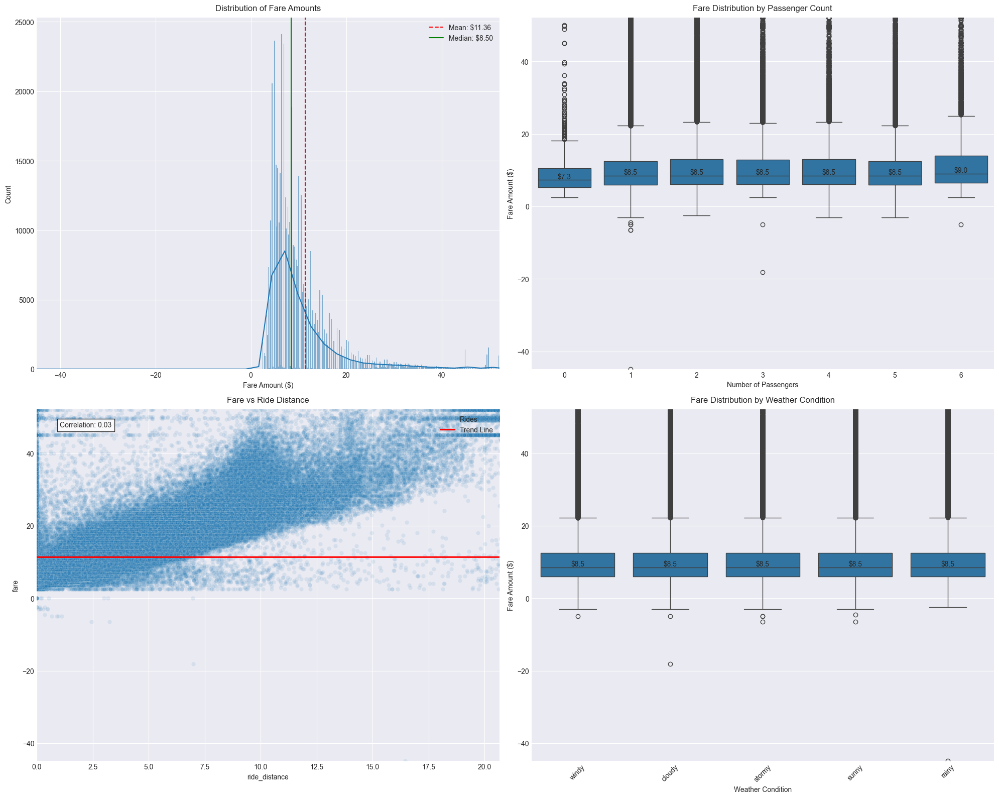

In [15]:
# Create a figure with 2x2 subplots with better spacing
plt.style.use('seaborn-v0_8-darkgrid')
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# 1. Fare Distribution (Top Left)
sns.histplot(data=df, x='fare', kde=True, ax=axes[0,0])
axes[0,0].set_title('Distribution of Fare Amounts', fontsize=12, pad=10)
axes[0,0].set_xlabel('Fare Amount ($)', fontsize=10)
axes[0,0].set_ylabel('Count', fontsize=10)

# Add mean and median lines with annotations
mean_fare = df['fare'].mean()
median_fare = df['fare'].median()
axes[0,0].axvline(mean_fare, color='red', linestyle='--', 
                  label=f'Mean: ${mean_fare:.2f}')
axes[0,0].axvline(median_fare, color='green', linestyle='-', 
                  label=f'Median: ${median_fare:.2f}')
axes[0,0].legend()

# Set x-axis limits to show 99% of the data
fare_99th = np.percentile(df['fare'], 99)
axes[0,0].set_xlim(df['fare'].min(), fare_99th)

# 2. Fare by Passenger Count (Top Right)
sns.boxplot(data=df, x='passengers', y='fare', ax=axes[0,1])
axes[0,1].set_title('Fare Distribution by Passenger Count', fontsize=12, pad=10)
axes[0,1].set_xlabel('Number of Passengers', fontsize=10)
axes[0,1].set_ylabel('Fare Amount ($)', fontsize=10)

# Set y-axis limits to show 99% of the data
axes[0,1].set_ylim(df['fare'].min(), fare_99th)

# Add median values on top of boxes
medians = df.groupby('passengers')['fare'].median()
for i, median in enumerate(medians):
    axes[0,1].text(i, median, f'${median:.1f}', 
                   horizontalalignment='center', verticalalignment='bottom')

# 3. Fare vs Distance (Bottom Left)
scatter = sns.scatterplot(data=df, x='ride_distance', y='fare', alpha=0.1, ax=axes[1,0])
axes[1,0].set_title('Fare vs Ride Distance', fontsize=12, pad=10)
axes[1,0].set_xlabel('Ride Distance (miles)', fontsize=10)
axes[1,0].set_ylabel('Fare Amount ($)', fontsize=10)

# Set axis limits to show 99% of the data
distance_99th = np.percentile(df['ride_distance'], 99)
axes[1,0].set_xlim(0, distance_99th)
axes[1,0].set_ylim(df['fare'].min(), fare_99th)

# Add trend line with confidence interval
sns.regplot(data=df, x='ride_distance', y='fare', 
            scatter=False, color='red', ax=axes[1,0],
            line_kws={'label': 'Trend Line'})

# Calculate correlation coefficient
correlation = df['ride_distance'].corr(df['fare'])

# Add correlation text
axes[1,0].text(0.05, 0.95, f'Correlation: {correlation:.2f}', 
               transform=axes[1,0].transAxes, 
               fontsize=10, 
               bbox=dict(facecolor='white', alpha=0.8))

# Add legend
axes[1,0].legend(['Rides', 'Trend Line'], loc='upper right')

# 4. Fare Distribution by Weather (Bottom Right)
sns.boxplot(data=df, x='weather', y='fare', ax=axes[1,1])
axes[1,1].set_title('Fare Distribution by Weather Condition', fontsize=12, pad=10)
axes[1,1].set_xlabel('Weather Condition', fontsize=10)
axes[1,1].set_ylabel('Fare Amount ($)', fontsize=10)
axes[1,1].tick_params(axis='x', rotation=45)

# Set y-axis limits to show 99% of the data
axes[1,1].set_ylim(df['fare'].min(), fare_99th)

# Add median values on top of boxes
medians = df.groupby('weather')['fare'].median()
for i, median in enumerate(medians):
    axes[1,1].text(i, median, f'${median:.1f}', 
                   horizontalalignment='center', verticalalignment='bottom')

# Adjust layout
plt.tight_layout()
plt.show()

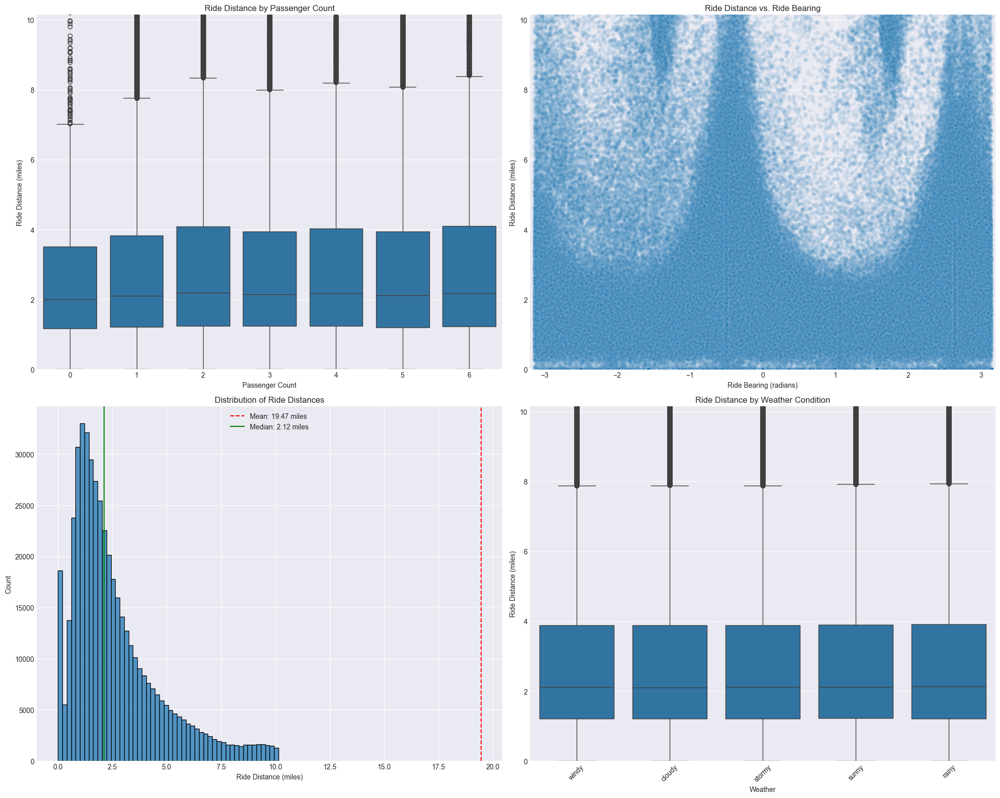

In [16]:
fig, axes = plt.subplots(2, 2, figsize=(20, 16))
plt.style.use('seaborn-v0_8-darkgrid')

# 1. Ride distance distribution with passenger count
sns.boxplot(data=df, x='passengers', y='ride_distance', ax=axes[0,0])
axes[0,0].set_title('Ride Distance by Passenger Count')
axes[0,0].set_xlabel('Passenger Count')
axes[0,0].set_ylabel('Ride Distance (miles)')
# Set y-axis limit to show 95% of the data (excluding extreme outliers)
axes[0,0].set_ylim(0, df['ride_distance'].quantile(0.95))

# 2. Ride distance distribution with ride bearing
sns.scatterplot(data=df, x='ride_bearing', y='ride_distance', 
                alpha=0.1, ax=axes[0,1])
axes[0,1].set_title('Ride Distance vs. Ride Bearing')
axes[0,1].set_xlabel('Ride Bearing (radians)')
axes[0,1].set_ylabel('Ride Distance (miles)')
axes[0,1].set_ylim(0, df['ride_distance'].quantile(0.95))
axes[0,1].set_xlim(-3.2, 3.2)  # Range of bearing in radians

# 3. Histogram of ride distances
sns.histplot(data=df[df['ride_distance'] <= df['ride_distance'].quantile(0.95)],
             x='ride_distance', bins=50, ax=axes[1,0])
axes[1,0].set_title('Distribution of Ride Distances')
axes[1,0].set_xlabel('Ride Distance (miles)')
axes[1,0].set_ylabel('Count')

# Add mean and median lines
mean_distance = df['ride_distance'].mean()
median_distance = df['ride_distance'].median()
axes[1,0].axvline(mean_distance, color='red', linestyle='--', 
                  label=f'Mean: {mean_distance:.2f} miles')
axes[1,0].axvline(median_distance, color='green', linestyle='-', 
                  label=f'Median: {median_distance:.2f} miles')
axes[1,0].legend()

# 4. Box plot of ride distances by weather
sns.boxplot(data=df, x='weather', y='ride_distance', ax=axes[1,1])
axes[1,1].set_title('Ride Distance by Weather Condition')
axes[1,1].set_xlabel('Weather')
axes[1,1].set_ylabel('Ride Distance (miles)')
axes[1,1].set_ylim(0, df['ride_distance'].quantile(0.95))
axes[1,1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


- Categorical columns

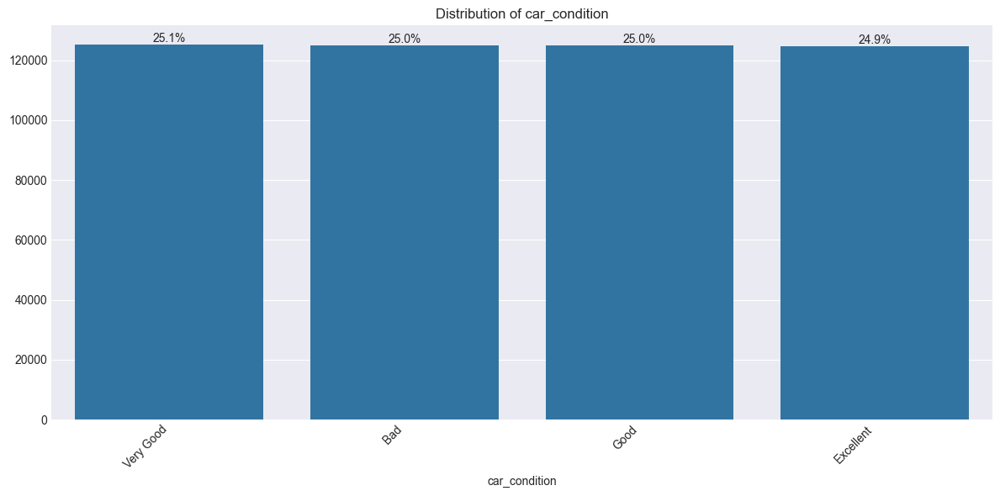


Value counts for car_condition:


,Count,Percentage
car_condition,,
Very Good,125310,25.06
Bad,124977,25.00
Good,124967,24.99
Excellent,124741,24.95


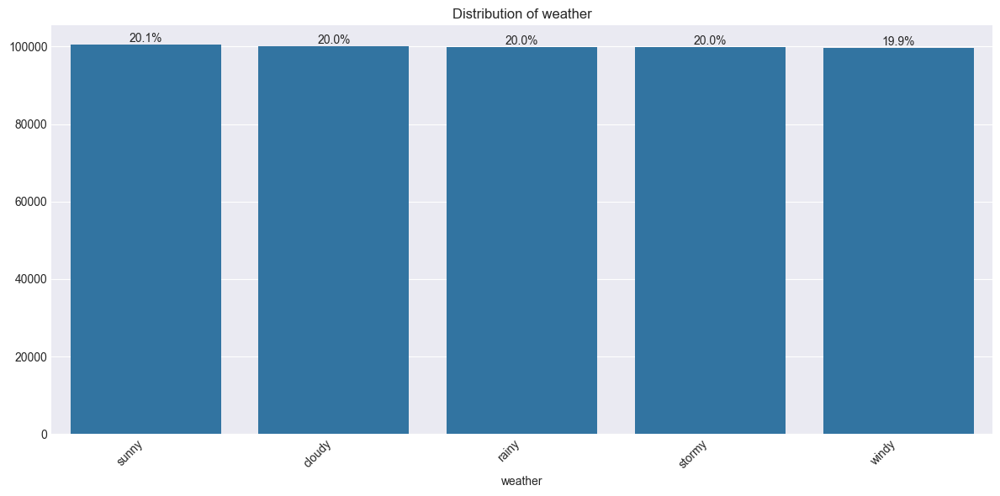


Value counts for weather:


,Count,Percentage
weather,,
sunny,100433,20.09
cloudy,100060,20.01
rainy,99971,19.99
stormy,99955,19.99
windy,99576,19.92


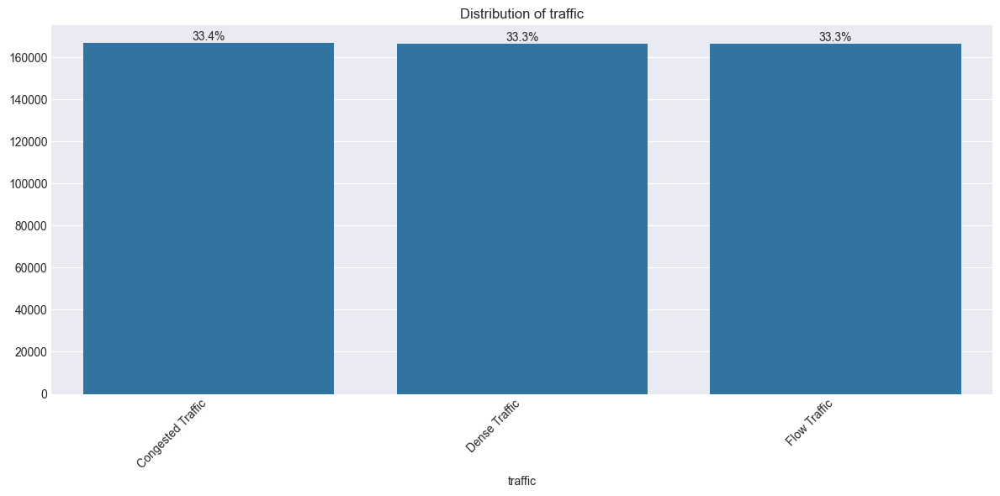


Value counts for traffic:


,Count,Percentage
traffic,,
Congested Traffic,166846,33.37
Dense Traffic,166581,33.32
Flow Traffic,166568,33.31


In [17]:
# Select categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
categorical_cols = [col for col in categorical_cols if df[col].nunique() < 30]  # Filter out high cardinality

for col in categorical_cols:
    plt.figure(figsize=(12, 6))
    value_counts = df[col].value_counts().sort_values(ascending=False)
    
    # Bar plot
    ax = sns.barplot(x=value_counts.index, y=value_counts.values)
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45, ha='right')
    
    # Add percentage labels
    total = len(df)
    for i, p in enumerate(ax.patches):
        percentage = 100 * p.get_height() / total
        ax.annotate(f'{percentage:.1f}%', 
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'bottom', rotation=0)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed breakdown
    print(f"\nValue counts for {col}:")
    count_df = pd.DataFrame({
        'Count': df[col].value_counts(),
        'Percentage': df[col].value_counts(normalize=True).mul(100).round(2)
    })
    display(count_df)

#### Temporal Analysis

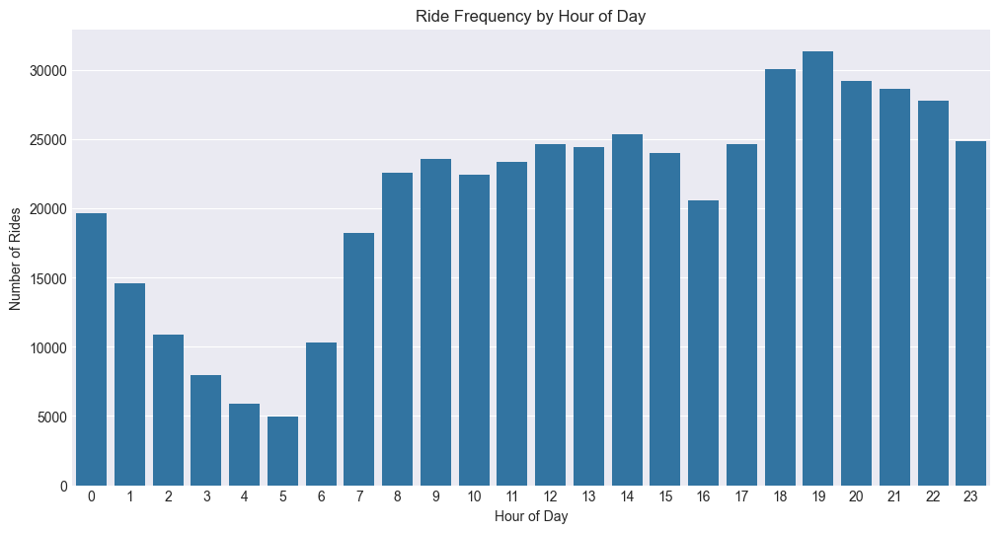

Hourly distribution of rides:
Hour 0: 3.93% of rides
Hour 1: 2.91% of rides
Hour 2: 2.18% of rides
Hour 3: 1.59% of rides
Hour 4: 1.17% of rides
Hour 5: 1.0% of rides
Hour 6: 2.07% of rides
Hour 7: 3.65% of rides
Hour 8: 4.52% of rides
Hour 9: 4.71% of rides
Hour 10: 4.49% of rides
Hour 11: 4.67% of rides
Hour 12: 4.93% of rides
Hour 13: 4.88% of rides
Hour 14: 5.08% of rides
Hour 15: 4.81% of rides
Hour 16: 4.11% of rides
Hour 17: 4.93% of rides
Hour 18: 6.01% of rides
Hour 19: 6.28% of rides
Hour 20: 5.84% of rides
Hour 21: 5.73% of rides
Hour 22: 5.56% of rides
Hour 23: 4.97% of rides


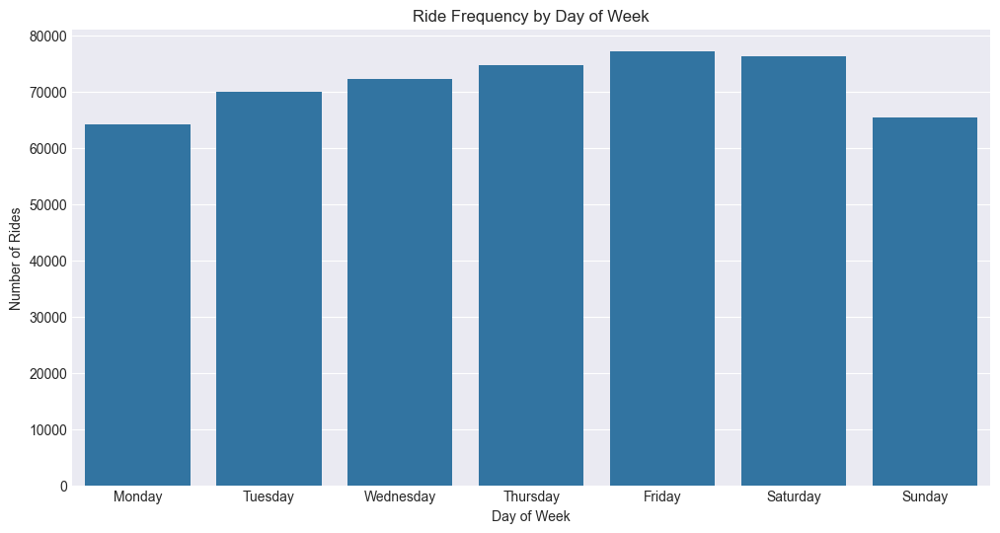

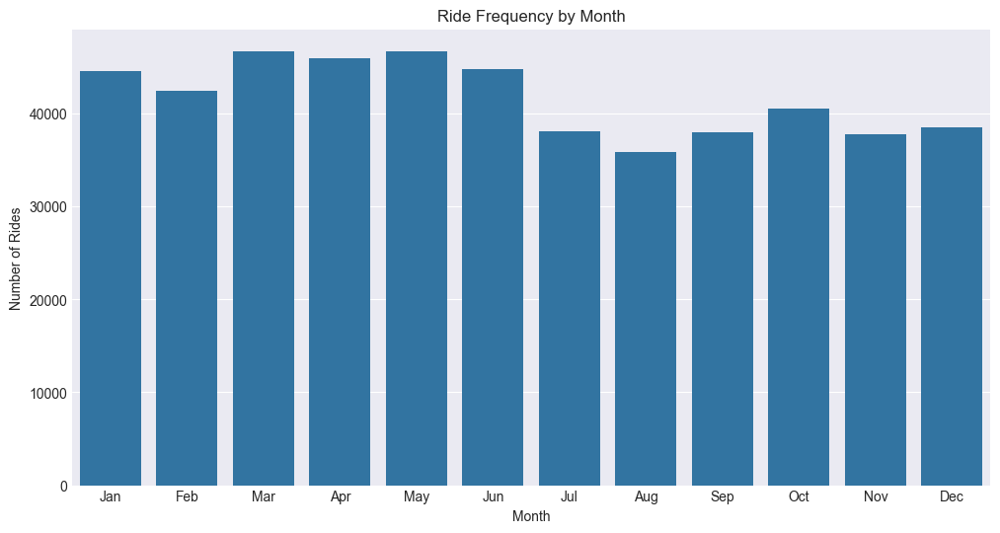

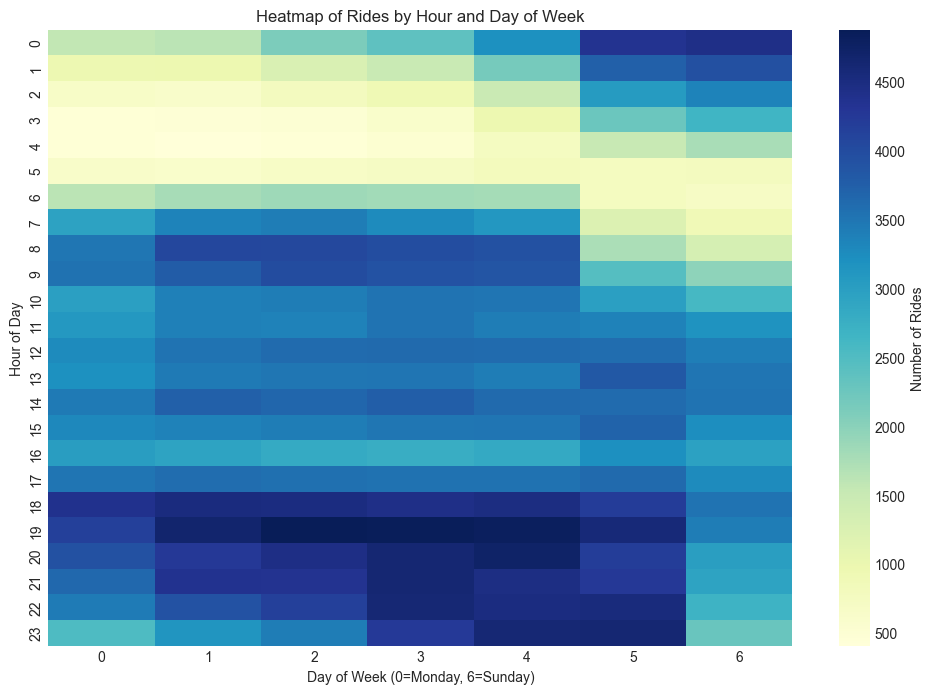

In [18]:
# Hour of day patterns
plt.figure(figsize=(12, 6))
hourly_counts = df.groupby('request_hour').size()
sns.barplot(x=hourly_counts.index, y=hourly_counts.values)
plt.title('Ride Frequency by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Rides')
plt.xticks(range(24))
plt.show()

# Add percentage labels
total_rides = len(df)
hourly_percentages = (hourly_counts / total_rides * 100).round(2)
print("Hourly distribution of rides:")
for hour, percentage in hourly_percentages.items():
    print(f"Hour {hour}: {percentage}% of rides")

# Day of week patterns
weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_counts = df.groupby('request_weekday').size()
plt.figure(figsize=(12, 6))
sns.barplot(x=[weekday_names[i] for i in range(7)], y=[weekday_counts.get(i, 0) for i in range(7)])
plt.title('Ride Frequency by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Rides')
plt.show()

# Monthly patterns
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
monthly_counts = df.groupby('request_month').size()
plt.figure(figsize=(12, 6))
sns.barplot(x=[month_names[i-1] for i in range(1, 13)], y=[monthly_counts.get(i, 0) for i in range(1, 13)])
plt.title('Ride Frequency by Month')
plt.xlabel('Month')
plt.ylabel('Number of Rides')
plt.show()

# Temporal heatmap: Hour by Weekday
hour_day_heatmap = pd.crosstab(df['request_hour'], df['request_weekday'])
plt.figure(figsize=(12, 8))
sns.heatmap(hour_day_heatmap, cmap='YlGnBu', annot=False, fmt='d', cbar_kws={'label': 'Number of Rides'})
plt.title('Heatmap of Rides by Hour and Day of Week')
plt.xlabel('Day of Week (0=Monday, 6=Sunday)')
plt.ylabel('Hour of Day')
plt.show()

#### Geospatial Analysis

Pickup heatmap saved to 'pickup_heatmap.html'
Dropoff heatmap saved to 'dropoff_heatmap.html'


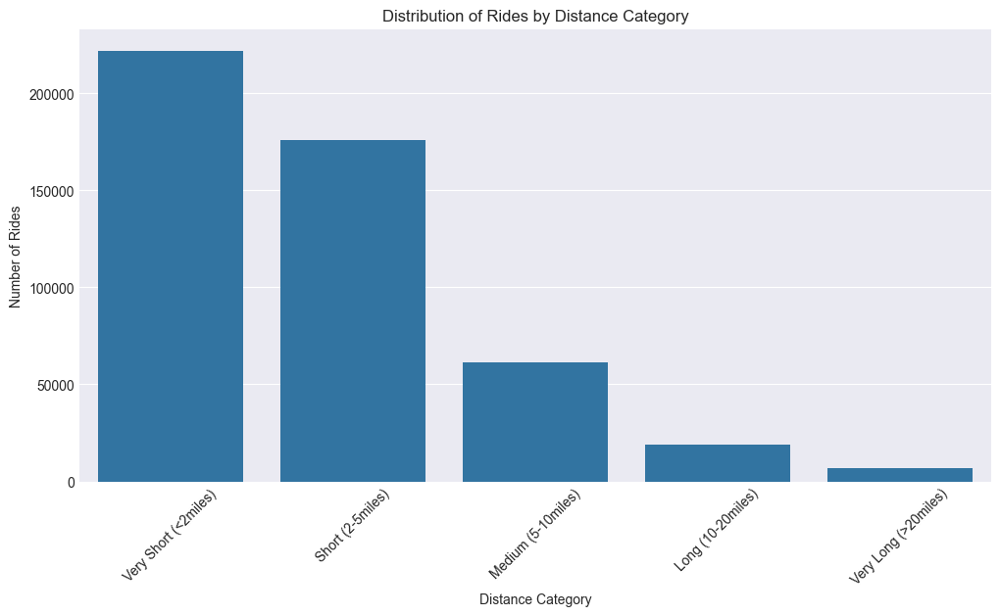

In [19]:
# Create base map centered on average coordinates
base_map = folium.Map(
    location=[df['pickup_lat'].mean(), df['pickup_lon'].mean()],
    zoom_start=12
)

# Add pickup heatmap using all data points
pickup_points = df[['pickup_lat', 'pickup_lon']].values.tolist()
HeatMap(pickup_points, radius=15).add_to(base_map)

# Save to HTML file
base_map.save('pickup_heatmap.html')
print("Pickup heatmap saved to 'pickup_heatmap.html'")

# Create dropoff heatmap
dropoff_map = folium.Map(
    location=[df['dropoff_lat'].mean(), df['dropoff_lon'].mean()],
    zoom_start=12
)
dropoff_points = df[['dropoff_lat', 'dropoff_lon']].values.tolist()
HeatMap(dropoff_points, radius=15).add_to(dropoff_map)
dropoff_map.save('dropoff_heatmap.html')
print("Dropoff heatmap saved to 'dropoff_heatmap.html'")

# Analyze ride distances by zone
# Create distance bins for analysis
df['distance_category'] = pd.cut(
    df['ride_distance'], 
    bins=[0, 2, 5, 10, 20, np.inf], 
    labels=['Very Short (<2miles)', 'Short (2-5miles)', 'Medium (5-10miles)', 'Long (10-20miles)', 'Very Long (>20miles)']
)

plt.figure(figsize=(12, 6))
distance_counts = df['distance_category'].value_counts().sort_index()
sns.barplot(x=distance_counts.index, y=distance_counts.values)
plt.title('Distribution of Rides by Distance Category')
plt.xlabel('Distance Category')
plt.ylabel('Number of Rides')
plt.xticks(rotation=45)
plt.show()


#### Outliers


Outlier Detection Summary:

Column Details:

fare:
Z-score outliers: 13325 (2.67%)
IQR outliers: 43329 (8.67%)

pickup_lon:
Z-score outliers: 9776 (1.96%)
IQR outliers: 33965 (6.79%)

pickup_lat:
Z-score outliers: 9720 (1.94%)
IQR outliers: 23701 (4.74%)

dropoff_lon:
Z-score outliers: 9790 (1.96%)
IQR outliers: 35805 (7.16%)

dropoff_lat:
Z-score outliers: 9736 (1.95%)
IQR outliers: 30748 (6.15%)

passengers:
Z-score outliers: 10590 (2.12%)
IQR outliers: 56526 (11.31%)

request_hour:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

request_day:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

request_month:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

request_weekday:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

request_year:
Z-score outliers: 0 (0.00%)
IQR outliers: 0 (0.00%)

distance_jfk:
Z-score outliers: 10148 (2.03%)
IQR outliers: 59285 (11.86%)

distance_ewr:
Z-score outliers: 10148 (2.03%)
IQR outliers: 28380 (5.68%)

distance_lga:
Z-score outliers: 10

<Figure size 2000x1500 with 0 Axes>

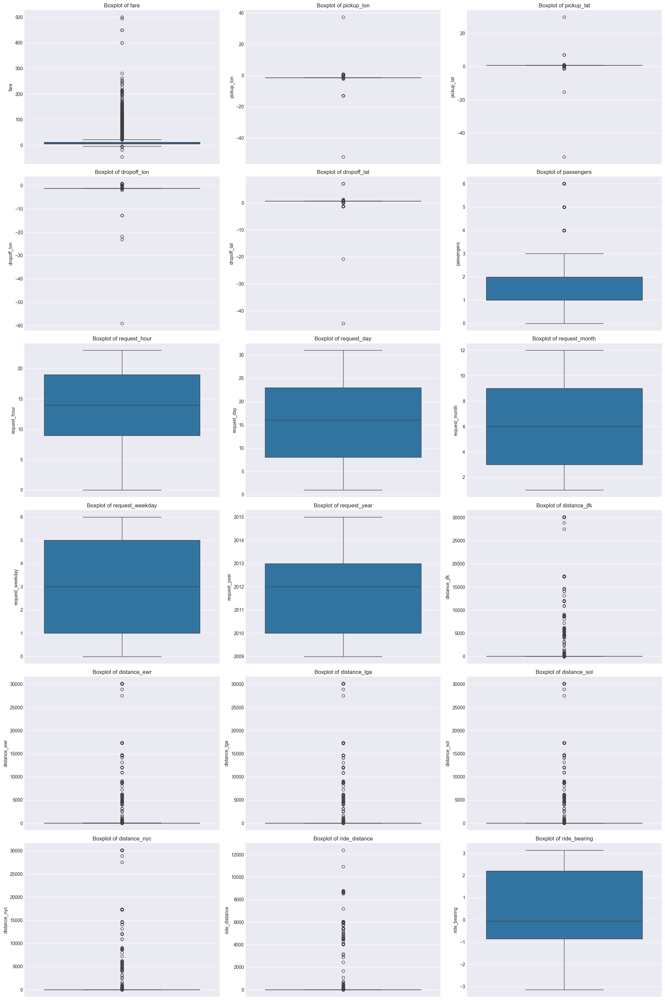

In [20]:
# Function to calculate z-score outliers
def detect_zscore_outliers(data, threshold=3):
    z_scores = (data - data.mean()) / data.std()
    return data[abs(z_scores) > threshold]

# Function to calculate IQR outliers
def detect_iqr_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data < lower_bound) | (data > upper_bound)]

# Create figure with subplots
plt.figure(figsize=(20, 15))

# List of numerical columns
numerical_columns = ['fare', 'pickup_lon', 'pickup_lat', 'dropoff_lon', 'dropoff_lat', 
                    'passengers', 'request_hour', 'request_day', 'request_month', 'request_weekday',
                    'request_year', 'distance_jfk', 'distance_ewr', 'distance_lga', 
                    'distance_sol', 'distance_nyc', 'ride_distance', 'ride_bearing']

# Create boxplots and calculate outliers
outlier_summary = {}
for i, column in enumerate(numerical_columns):
    # Skip any columns with missing values
    if df[column].isnull().any():
        continue
        
    # Calculate outliers using both methods
    zscore_outliers = detect_zscore_outliers(df[column])
    iqr_outliers = detect_iqr_outliers(df[column])
    
    # Store results
    outlier_summary[column] = {
        'zscore_count': len(zscore_outliers),
        'zscore_percent': (len(zscore_outliers) / len(df)) * 100,
        'iqr_count': len(iqr_outliers),
        'iqr_percent': (len(iqr_outliers) / len(df)) * 100,
        'total_records': len(df)
    }

# Create a summary DataFrame
summary_df = pd.DataFrame.from_dict(outlier_summary, orient='index')
summary_df = summary_df.round(2)

# Print the summary
print("\nOutlier Detection Summary:")
print("\nColumn Details:")
for column in numerical_columns:
    if column in outlier_summary:
        print(f"\n{column}:")
        print(f"Z-score outliers: {outlier_summary[column]['zscore_count']} "
              f"({outlier_summary[column]['zscore_percent']:.2f}%)")
        print(f"IQR outliers: {outlier_summary[column]['iqr_count']} "
              f"({outlier_summary[column]['iqr_percent']:.2f}%)")

# Create boxplots for visualization
fig, axes = plt.subplots(6, 3, figsize=(20, 30))
axes = axes.ravel()

for idx, column in enumerate(numerical_columns):
    if idx < len(axes):  # Ensure we don't exceed the number of subplots
        sns.boxplot(data=df, y=column, ax=axes[idx])
        axes[idx].set_title(f'Boxplot of {column}')
        axes[idx].tick_params(axis='x', rotation=45)

# Remove empty subplots if any
for idx in range(len(numerical_columns), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()


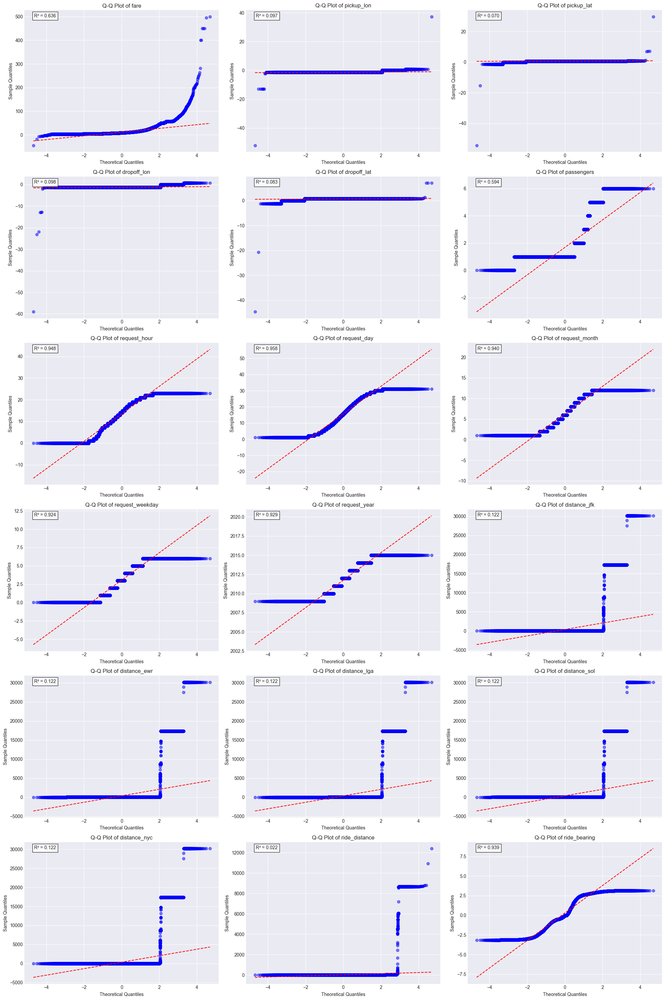


Normality test for fare:
p-value: 0.0000000000
Skewness: 4.898
Kurtosis: 83.178

Normality test for pickup_lon:
p-value: 0.0000000000
Skewness: -14.008
Kurtosis: 9868.853

Normality test for pickup_lat:
p-value: 0.0000000000
Skewness: -108.101
Kurtosis: 50711.452

Normality test for dropoff_lon:
p-value: 0.0000000000
Skewness: -44.819
Kurtosis: 12950.743

Normality test for dropoff_lat:
p-value: 0.0000000000
Skewness: -100.307
Kurtosis: 32220.109

Normality test for passengers:
p-value: 0.0000000000
Skewness: 1.974
Kurtosis: 2.758

Normality test for request_hour:
p-value: 0.0000000000
Skewness: -0.435
Kurtosis: -0.767

Normality test for request_day:
p-value: 0.0000000000
Skewness: 0.020
Kurtosis: -1.159

Normality test for request_month:
p-value: 0.0000000000
Skewness: 0.110
Kurtosis: -1.198

Normality test for request_weekday:
p-value: 0.0000000000
Skewness: -0.041
Kurtosis: -1.200

Normality test for request_year:
p-value: 0.0000000000
Skewness: 0.066
Kurtosis: -1.143

Normality t

In [21]:
# Create figure with subplots
fig, axes = plt.subplots(6, 3, figsize=(20, 30))
axes = axes.ravel()

# List of numerical columns
numerical_columns = ['fare', 'pickup_lon', 'pickup_lat', 'dropoff_lon', 'dropoff_lat', 
                    'passengers', 'request_hour', 'request_day', 'request_month', 'request_weekday',
                    'request_year', 'distance_jfk', 'distance_ewr', 'distance_lga', 
                    'distance_sol', 'distance_nyc', 'ride_distance', 'ride_bearing']

# Create Q-Q plots for each numerical column
for idx, column in enumerate(numerical_columns):
    if idx < len(axes):  # Ensure we don't exceed the number of subplots
        # Calculate theoretical quantiles
        data = df[column].dropna()
        (quantiles, values), (slope, intercept, r) = stats.probplot(data, dist="norm")
        
        # Create Q-Q plot
        axes[idx].scatter(quantiles, values, color='blue', alpha=0.5)
        axes[idx].plot(quantiles, slope * quantiles + intercept, color='red', linestyle='--')
        
        # Add labels and title
        axes[idx].set_title(f'Q-Q Plot of {column}')
        axes[idx].set_xlabel('Theoretical Quantiles')
        axes[idx].set_ylabel('Sample Quantiles')
        
        # Calculate and display R-squared value
        r_squared = r ** 2
        axes[idx].text(0.05, 0.95, f'R² = {r_squared:.3f}', 
                      transform=axes[idx].transAxes, 
                      bbox=dict(facecolor='white', alpha=0.8))

# Remove empty subplots if any
for idx in range(len(numerical_columns), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()

# Print detailed statistics for each column
for column in numerical_columns:
    if not df[column].isnull().any():
        print(f"\nNormality test for {column}:")
        stat, p_value = stats.normaltest(df[column])
        print(f"p-value: {p_value:.10f}")
        print(f"Skewness: {stats.skew(df[column]):.3f}")
        print(f"Kurtosis: {stats.kurtosis(df[column]):.3f}")

#### Bivariate and Multivariate Analysis

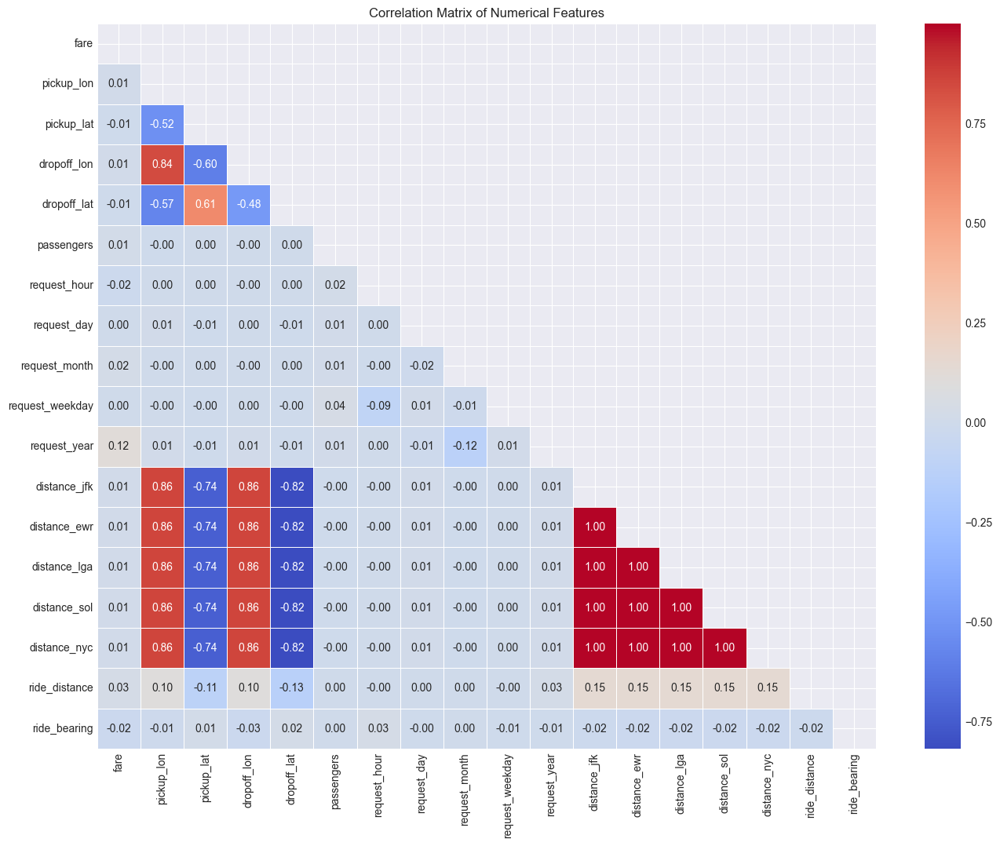

Top correlations with fare:


fare               1.000000
request_year       0.115774
ride_distance      0.026486
request_month      0.024429
passengers         0.013823
distance_nyc       0.009764
distance_ewr       0.009654
distance_sol       0.009609
dropoff_lon        0.009233
distance_lga       0.009006
pickup_lon         0.008822
distance_jfk       0.008002
request_weekday    0.003152
request_day        0.001900
pickup_lat        -0.007779
dropoff_lat       -0.007865
request_hour      -0.019272
ride_bearing      -0.024303
Name: fare, dtype: float64

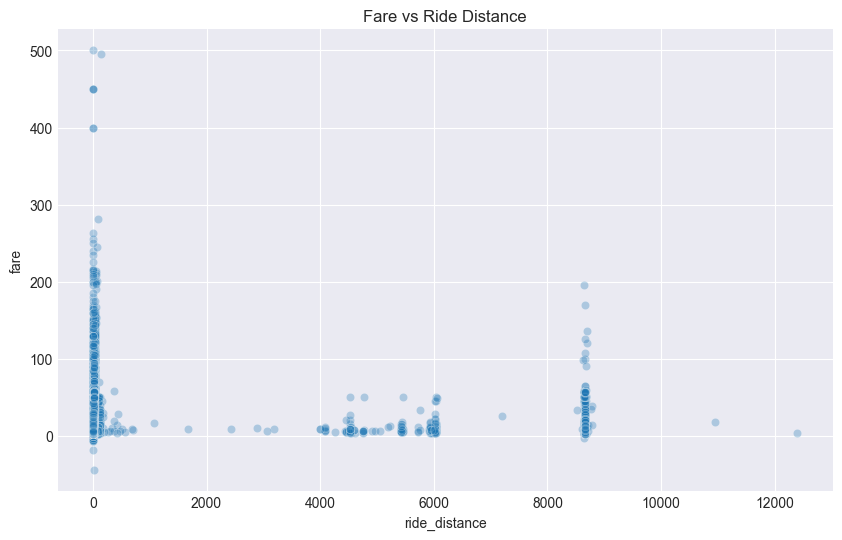

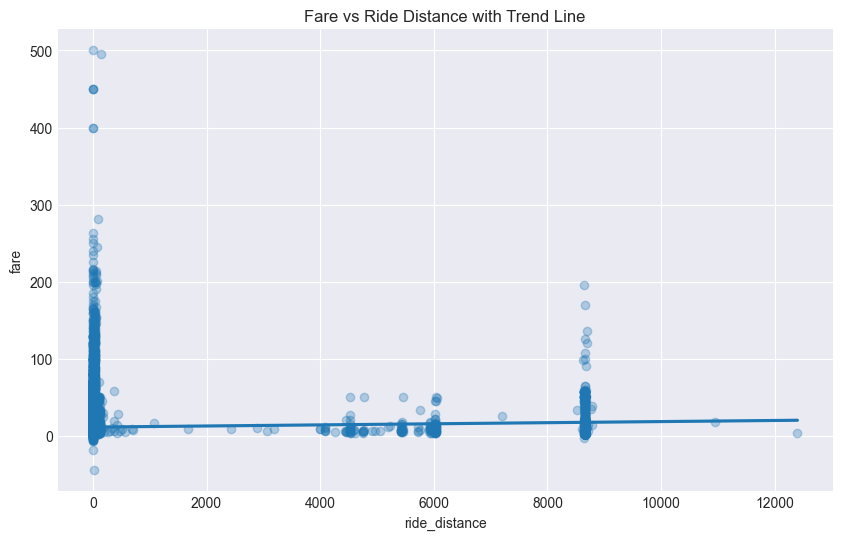

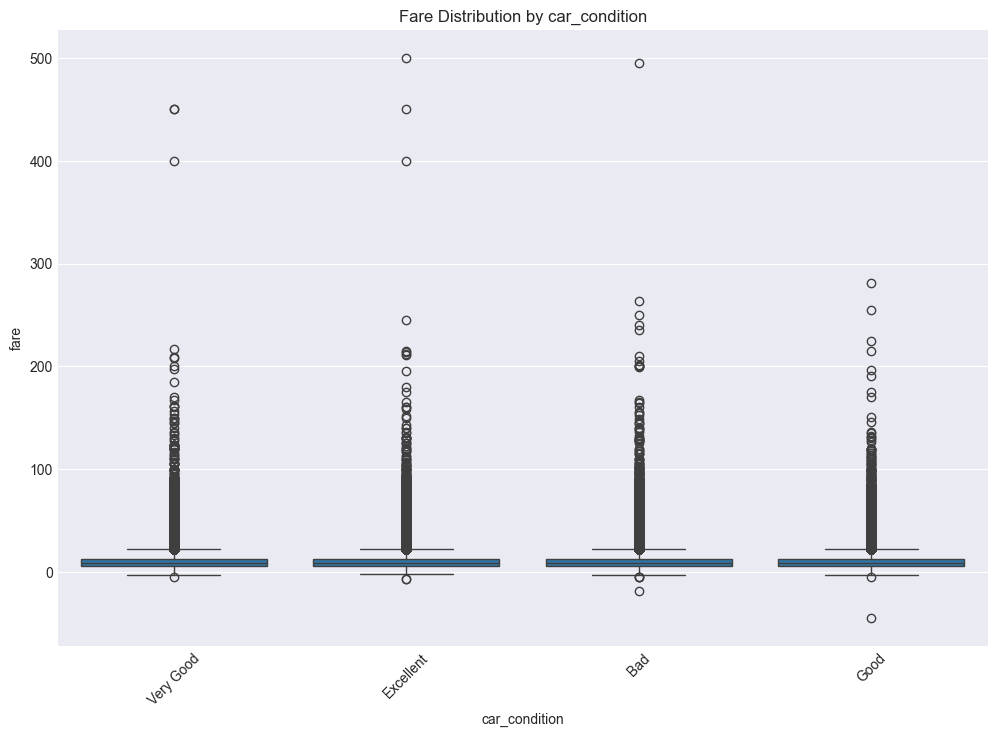


Mean fare by car_condition:
Very Good: $11.42
Excellent: $11.36
Good: $11.34
Bad: $11.33


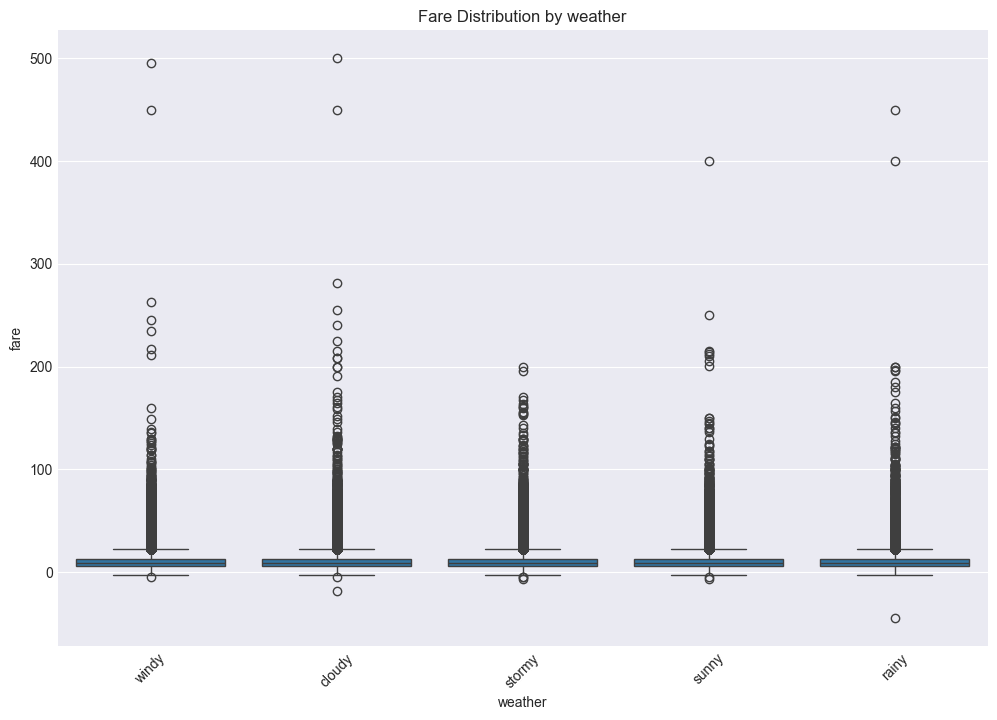


Mean fare by weather:
cloudy: $11.38
sunny: $11.36
rainy: $11.36
windy: $11.35
stormy: $11.35


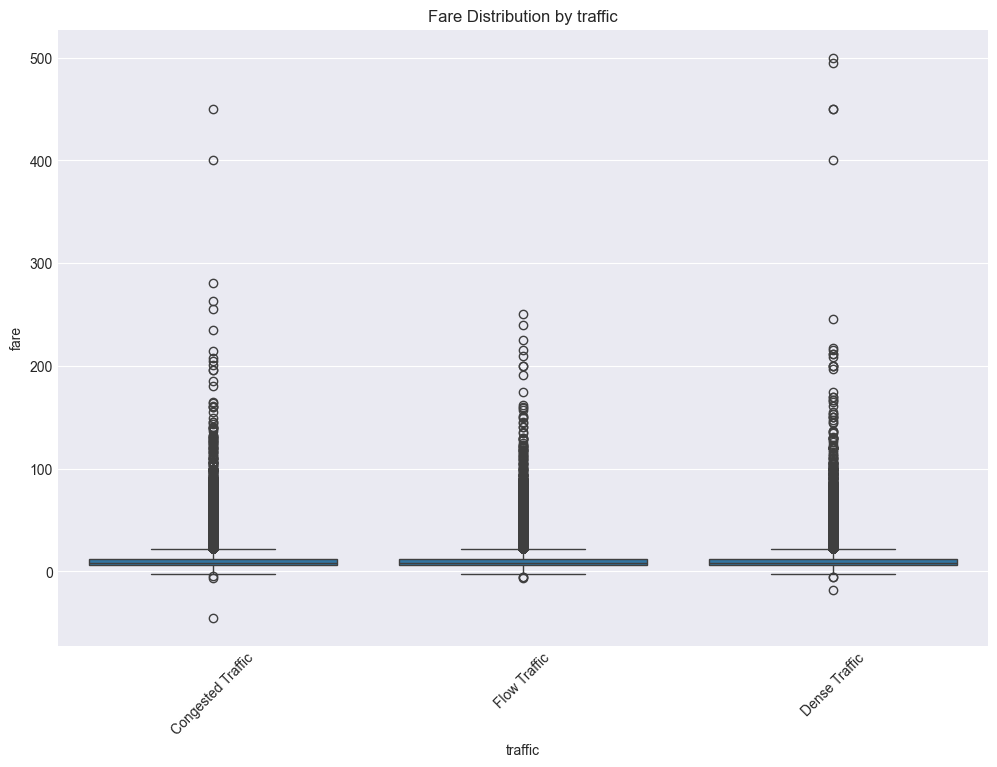


Mean fare by traffic:
Congested Traffic: $11.39
Dense Traffic: $11.37
Flow Traffic: $11.32


In [22]:
# Correlation matrix for numerical features
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
correlation_matrix = df[numerical_columns].corr()

plt.figure(figsize=(16, 12))
mask = np.triu(correlation_matrix)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, mask=mask)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# Top correlations with fare (assuming fare is the target variable)
fare_correlations = correlation_matrix['fare'].sort_values(ascending=False)
print("Top correlations with fare:")
display(fare_correlations)

# Scatter plots for key relationships
plt.figure(figsize=(10, 6))
sns.scatterplot(x='ride_distance', y='fare', data=df, alpha=0.3)
plt.title('Fare vs Ride Distance')
plt.show()

# Add regression line to see trend
plt.figure(figsize=(10, 6))
sns.regplot(x='ride_distance', y='fare', data=df, scatter_kws={'alpha':0.3})
plt.title('Fare vs Ride Distance with Trend Line')
plt.show()

# Key categorical variable effects on fare
for cat_var in ['car_condition', 'weather', 'traffic']:
    plt.figure(figsize=(12, 8))
    sns.boxplot(x=cat_var, y='fare', data=df)
    plt.title(f'Fare Distribution by {cat_var}')
    plt.xticks(rotation=45)
    plt.show()
    
    # Calculate mean fare by category
    category_means = df.groupby(cat_var)['fare'].mean().sort_values(ascending=False)
    print(f"\nMean fare by {cat_var}:")
    for category, mean_fare in category_means.items():
        print(f"{category}: ${mean_fare:.2f}")

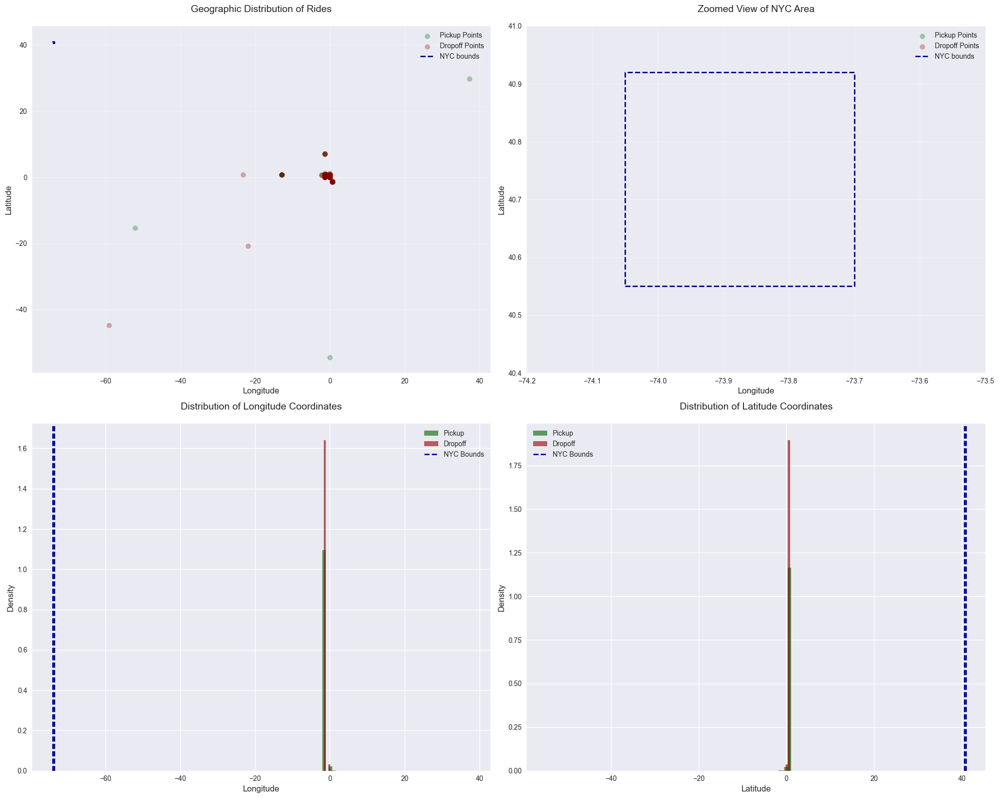


=== Geographic Distribution Analysis ===

Total rides analyzed: 499,995
Rides outside NYC bounds: 499,995 (100.0%)

Coordinate Ranges:

Pickup Points:
Longitude: [-52.1198 to 37.3605]
Latitude: [-54.3894 to 29.7246]

Dropoff Points:
Longitude: [-59.0497 to 0.7130]
Latitude: [-44.6760 to 7.0619]


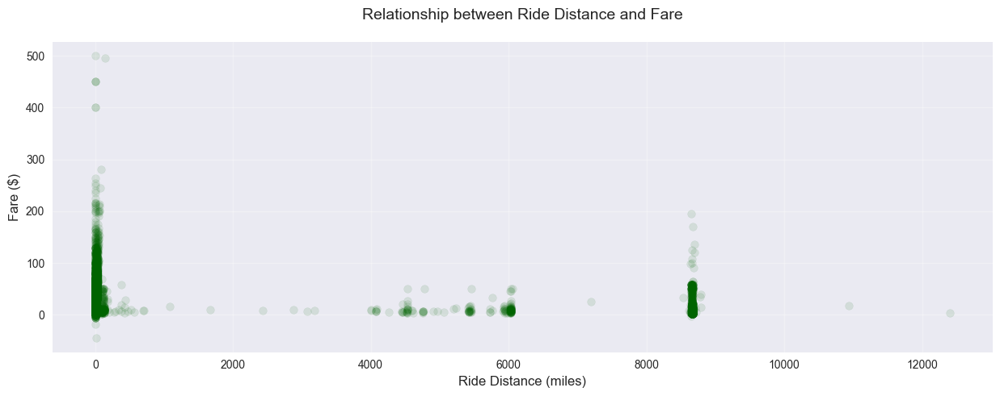

In [23]:
# Create a figure with 2x2 subplots
plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(2, 2, figsize=(20, 16))

# Define a darker color palette
colors = {
    'pickup': '#006400',    # dark green
    'dropoff': '#8B0000',   # dark red
    'bounds': '#00008B',    # dark blue
    'background': '#ffffff'  # white
}

# 1. Overall Distribution (Top Left)
scatter1 = axes[0,0].scatter(df['pickup_lon'], df['pickup_lat'], 
                            alpha=0.3, c=colors['pickup'], label='Pickup Points')
scatter2 = axes[0,0].scatter(df['dropoff_lon'], df['dropoff_lat'], 
                            alpha=0.3, c=colors['dropoff'], label='Dropoff Points')
axes[0,0].plot([-74.05, -73.70, -73.70, -74.05, -74.05],
               [40.55, 40.55, 40.92, 40.92, 40.55],
               c=colors['bounds'], linestyle='--', linewidth=2, label='NYC bounds')
axes[0,0].set_title('Geographic Distribution of Rides', fontsize=14, pad=20)
axes[0,0].set_xlabel('Longitude', fontsize=12)
axes[0,0].set_ylabel('Latitude', fontsize=12)
axes[0,0].legend(fontsize=10)
axes[0,0].grid(True, alpha=0.3)

# 2. Zoomed Distribution (Top Right)
scatter3 = axes[0,1].scatter(df['pickup_lon'], df['pickup_lat'], 
                            alpha=0.3, c=colors['pickup'], label='Pickup Points')
scatter4 = axes[0,1].scatter(df['dropoff_lon'], df['dropoff_lat'], 
                            alpha=0.3, c=colors['dropoff'], label='Dropoff Points')
axes[0,1].plot([-74.05, -73.70, -73.70, -74.05, -74.05],
               [40.55, 40.55, 40.92, 40.92, 40.55],
               c=colors['bounds'], linestyle='--', linewidth=2, label='NYC bounds')
axes[0,1].set_title('Zoomed View of NYC Area', fontsize=14, pad=20)
axes[0,1].set_xlabel('Longitude', fontsize=12)
axes[0,1].set_ylabel('Latitude', fontsize=12)
axes[0,1].set_xlim(-74.2, -73.5)
axes[0,1].set_ylim(40.4, 41.0)
axes[0,1].legend(fontsize=10)
axes[0,1].grid(True, alpha=0.3)

# 3. Longitude Distribution (Bottom Left)
axes[1,0].hist(df['pickup_lon'], bins=100, alpha=0.6, color=colors['pickup'], 
               label='Pickup', density=True)
axes[1,0].hist(df['dropoff_lon'], bins=100, alpha=0.6, color=colors['dropoff'], 
               label='Dropoff', density=True)
axes[1,0].axvline(-74.05, color=colors['bounds'], linestyle='--', 
                  linewidth=2, label='NYC Bounds')
axes[1,0].axvline(-73.70, color=colors['bounds'], linestyle='--', linewidth=2)
axes[1,0].set_title('Distribution of Longitude Coordinates', fontsize=14, pad=20)
axes[1,0].set_xlabel('Longitude', fontsize=12)
axes[1,0].set_ylabel('Density', fontsize=12)
axes[1,0].legend(fontsize=10)

# 4. Latitude Distribution (Bottom Right)
axes[1,1].hist(df['pickup_lat'], bins=100, alpha=0.6, color=colors['pickup'], 
               label='Pickup', density=True)
axes[1,1].hist(df['dropoff_lat'], bins=100, alpha=0.6, color=colors['dropoff'], 
               label='Dropoff', density=True)
axes[1,1].axvline(40.55, color=colors['bounds'], linestyle='--', 
                  linewidth=2, label='NYC Bounds')
axes[1,1].axvline(40.92, color=colors['bounds'], linestyle='--', linewidth=2)
axes[1,1].set_title('Distribution of Latitude Coordinates', fontsize=14, pad=20)
axes[1,1].set_xlabel('Latitude', fontsize=12)
axes[1,1].set_ylabel('Density', fontsize=12)
axes[1,1].legend(fontsize=10)

# Adjust layout and display
plt.tight_layout()
plt.show()

# Print statistics about points outside bounds
nyc_bounds = {
    'lon_min': -74.05, 'lon_max': -73.70,
    'lat_min': 40.55, 'lat_max': 40.92
}

outside_bounds = df[
    (df['pickup_lon'] < nyc_bounds['lon_min']) | (df['pickup_lon'] > nyc_bounds['lon_max']) |
    (df['pickup_lat'] < nyc_bounds['lat_min']) | (df['pickup_lat'] > nyc_bounds['lat_max']) |
    (df['dropoff_lon'] < nyc_bounds['lon_min']) | (df['dropoff_lon'] > nyc_bounds['lon_max']) |
    (df['dropoff_lat'] < nyc_bounds['lat_min']) | (df['dropoff_lat'] > nyc_bounds['lat_max'])
]

# Print detailed analysis
print("\n=== Geographic Distribution Analysis ===")
print(f"\nTotal rides analyzed: {len(df):,}")
print(f"Rides outside NYC bounds: {len(outside_bounds):,} ({len(outside_bounds)/len(df)*100:.1f}%)")

print("\nCoordinate Ranges:")
print("\nPickup Points:")
print(f"Longitude: [{df['pickup_lon'].min():.4f} to {df['pickup_lon'].max():.4f}]")
print(f"Latitude: [{df['pickup_lat'].min():.4f} to {df['pickup_lat'].max():.4f}]")

print("\nDropoff Points:")
print(f"Longitude: [{df['dropoff_lon'].min():.4f} to {df['dropoff_lon'].max():.4f}]")
print(f"Latitude: [{df['dropoff_lat'].min():.4f} to {df['dropoff_lat'].max():.4f}]")

# Additional visualizations
plt.figure(figsize=(15, 5))
plt.scatter(df['ride_distance'], df['fare'], alpha=0.1, c='#006400')  # Using darker green
plt.title('Relationship between Ride Distance and Fare', fontsize=14, pad=20)
plt.xlabel('Ride Distance (miles)', fontsize=12)
plt.ylabel('Fare ($)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

---


#### Split before processing to prevent leakage

To prevent data leakage during model development and validation, it's important to split the data into training and test sets before any preprocessing. This ensures that:

1. Test data remains completely unseen during preprocessing steps
2. Scaling and normalization parameters are learned only from training data
3. Outlier detection and removal strategies are developed using training data only
4. Any feature engineering is done independently on train and test sets
5. Model selection and hyperparameter tuning can be performed without test data influence
This approach maintains the integrity of the final model evaluation on truly unseen data.

> NOTE 
>
>⚠️The modeling tasks are currently pending. We need to complete the Exploratory Data Analysis (EDA) phase first to gain comprehensive insights from the complete dataset before proceeding with any data splitting or model development.

*Status: Data splitting implementation is not active yet since we're conducting Exploratory Data Analysis (EDA) which requires the full dataset for comprehensive insights* 📊 🔍

In [24]:
# Split the data into training and testing sets to avoid data leakage
# Ration for 500k rows: 85% training, 15% testing

# Define features and target variable
# Target variable (label): 'fare'
# Features: All columns except 'fare'

X = df.drop(columns=['fare'])
y = df['fare']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

# Check the shapes of the resulting datasets
X_train.shape, X_test.shape, y_train.shape, y_test.shape


((424995, 26), (75000, 26), (424995,), (75000,))

In [25]:
# Merge the training features and target variable
train_data = pd.concat([X_train, y_train], axis=1)
train_data.head()

,user_id,user_name,driver_name,car_condition,weather,traffic,ride_id,pickup_time,pickup_lon,pickup_lat,...,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,distance_category,fare
277824,GBNDLz5j,Lance Clark,Nicole Edwards,Bad,cloudy,Congested Traffic,2009-10-27 18:31:00.000000138,2009-10-27 18:31:00,-1.291702,0.710692,...,2009,42.215878,31.407198,22.224380,13.732536,5.745925,4.709353,-0.642199,Short (2-5miles),14.1
331985,fvUwdu59,Thomas Barker,Paul Chandler,Bad,rainy,Dense Traffic,2015-01-19 12:55:45.0000003,2015-01-19 12:55:45,-1.291262,0.711489,...,2015,45.400157,35.440644,19.100641,20.682024,13.059696,1.222237,0.223132,Very Short (<2miles),5.5
152744,kxkCUl7t,Tracy Jimenez,Tammy Ruiz,Very Good,sunny,Congested Traffic,2015-04-21 20:14:36.00000011,2015-04-21 20:14:36,-1.291661,0.710852,...,2015,43.280201,27.424541,26.316899,9.316600,2.405804,1.580179,2.668377,Very Short (<2miles),6.5
260253,nbZCnkMA,Terri Mcgrath,Norman Mayer,Bad,rainy,Dense Traffic,2009-01-17 03:04:00.00000094,2009-01-17 03:04:00,-1.291272,0.710926,...,2009,35.081435,35.150507,22.223180,15.544722,8.854023,6.096014,-2.540644,Medium (5-10miles),15.3
484522,5bC7JDla,Robin Hart,Paul Cardenas,Bad,stormy,Congested Traffic,2013-05-19 12:25:00.000000208,2013-05-19 12:25:00,-1.290829,0.711660,...,2013,44.196215,38.668537,16.114556,23.445701,15.485430,1.618969,1.288594,Very Short (<2miles),7.0


---

### Feature Engineering
#### Step 1: Handling Outliers

In [26]:
# Make a copy of the original dataframe before any modifications
df_clean = df.copy()
print(f"Original dataset shape: {df_clean.shape}")

Original dataset shape: (499995, 27)


##### Remove invalid columns

In [27]:
# 1. Drop cloumns: pickup_lon,pickup_lat,dropoff_lon,dropoff_lat
df_clean.drop(columns=['pickup_lon', 'pickup_lat', 'dropoff_lon', 'dropoff_lat'], inplace=True)

print(f"New dataset shape: {df_clean.shape}")

New dataset shape: (499995, 23)


In [28]:
df_clean.dtypes

user_id                object
user_name              object
driver_name            object
car_condition          object
weather                object
traffic                object
ride_id                object
fare                  float64
pickup_time            object
passengers              int64
request_hour            int64
request_day             int64
request_month           int64
request_weekday         int64
request_year            int64
distance_jfk          float64
distance_ewr          float64
distance_lga          float64
distance_sol          float64
distance_nyc          float64
ride_distance         float64
ride_bearing          float64
distance_category    category
dtype: object

In [29]:
# define usa limits and location of airports 
usa_bounds = {
    'lon_min': -125.0, 'lon_max': -67.0,
    'lat_min': 24.6, 'lat_max': 49.384358
}

airport_locations = {
    'jfk': {'name': 'JFK Airport', 'coordinates': (40.6413, -73.7781)},
    'ewr': {'name': 'Newark Airport', 'coordinates': (40.6895, -74.1745)},
    'lga': {'name': 'LaGuardia Airport', 'coordinates': (40.7769, -73.8740)},
    'sol': {'name': 'Statue of Liberty', 'coordinates': (40.6892, -74.0445)},
    'nyc': {'name': 'New York City Center', 'coordinates': (40.7128, -74.0060)}
}


max_distance_miles = 3000
min_distance_miles = 0.1

##### Remove extreme values for locations and airports distances

##### The dataset contains distance measurements to various key locations:
- Distances to airports (JFK, EWR, LGA)
- Distance to landmarks (Statue of Liberty) 
- Distance to city center (NYC)

##### Criteria for removal:
- Distances exceeding reasonable US continental limits (3000 miles)
- Zero or negative distances


In [30]:
def detect_distance_anomalies(df, max_distance_miles=3000):
    """
    Detect anomalous distance measurements in the dataset.
    
    Args:
        df: DataFrame containing distance measurements
        max_distance_miles: Maximum reasonable distance in miles
        
    Returns:
        DataFrame containing rows with anomalous distance measurements
    """
    # Define distance columns to check
    distance_columns = ['distance_jfk', 'distance_ewr', 'distance_lga', 
                       'distance_sol', 'distance_nyc']
    
    # Create mask for each distance column
    anomaly_masks = [(df[col] > max_distance_miles) for col in distance_columns]
    
    # Combine masks with OR operation
    combined_mask = anomaly_masks[0]
    for mask in anomaly_masks[1:]:
        combined_mask = combined_mask | mask
    
    # Get rows with anomalous distances
    anomalous_rows = df[combined_mask]
    
    # Print summary
    print("Distance Anomaly Detection Summary:")
    print("-" * 40)
    print(f"Total records analyzed: {len(df):,}")
    for col in distance_columns:
        anomaly_count = len(df[df[col] > max_distance_miles])
        print(f"{col}: {anomaly_count:,} anomalies "
              f"({anomaly_count/len(df)*100:.2f}%)")
    print(f"\nTotal unique anomalous rows: {len(anomalous_rows):,} "
          f"({len(anomalous_rows)/len(df)*100:.2f}%)")
    
    return anomalous_rows

# Example usage:
# Assuming df_clean is your DataFrame and 'ride_distance' is the column with ride distances in miles
anomalous_rows = detect_distance_anomalies(df_clean)
df_clean = df_clean.drop(index=anomalous_rows.index)

# Verify results
print("\nDataset sizes:")
print(f"Original: {len(df):,} rows")
print(f"Cleaned: {len(df_clean):,} rows")
print(f"Removed: {len(df) - len(df_clean):,} rows")

Distance Anomaly Detection Summary:
----------------------------------------
Total records analyzed: 499,995
distance_jfk: 10,280 anomalies (2.06%)
distance_ewr: 10,280 anomalies (2.06%)
distance_lga: 10,280 anomalies (2.06%)
distance_sol: 10,280 anomalies (2.06%)
distance_nyc: 10,280 anomalies (2.06%)

Total unique anomalous rows: 10,280 (2.06%)

Dataset sizes:
Original: 499,995 rows
Cleaned: 489,715 rows
Removed: 10,280 rows


In [31]:
df_clean.dtypes

user_id                object
user_name              object
driver_name            object
car_condition          object
weather                object
traffic                object
ride_id                object
fare                  float64
pickup_time            object
passengers              int64
request_hour            int64
request_day             int64
request_month           int64
request_weekday         int64
request_year            int64
distance_jfk          float64
distance_ewr          float64
distance_lga          float64
distance_sol          float64
distance_nyc          float64
ride_distance         float64
ride_bearing          float64
distance_category    category
dtype: object

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1201141560.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set_xticklabels(distance_names, rotation=45)
C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1201141560.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,1].set_xticklabels(distance_names, rotation=45)


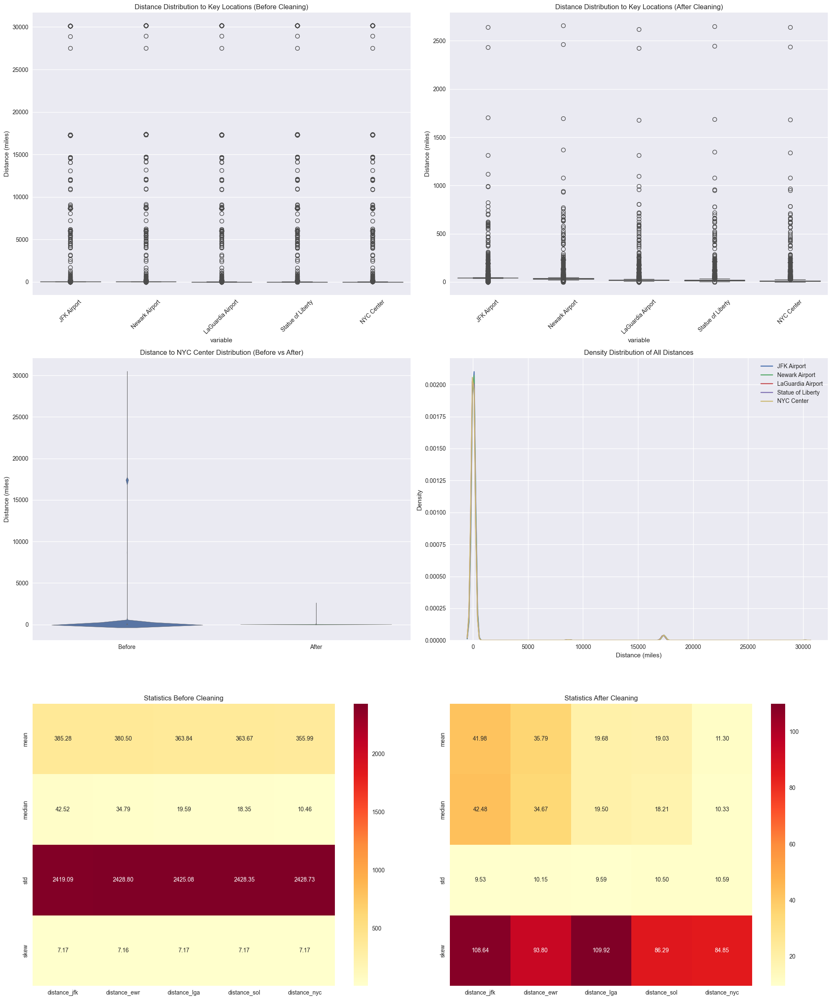


Summary of Changes in Dataset:
Records before cleaning: 499,995
Records after cleaning: 489,715
Records removed: 10,280


In [32]:
# Set style and create figure
plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(3, 2, figsize=(20, 24))

# Prepare data for all distances at once
distance_cols = ['distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol', 'distance_nyc']
distance_names = ['JFK Airport', 'Newark Airport', 'LaGuardia Airport', 'Statue of Liberty', 'NYC Center']

# Create a single boxplot for all distances
boxplot_data = pd.melt(df[distance_cols])
sns.boxplot(data=boxplot_data, x='variable', y='value', ax=axes[0,0])
axes[0,0].set_title('Distance Distribution to Key Locations (Before Cleaning)')
axes[0,0].set_xticklabels(distance_names, rotation=45)
axes[0,0].set_ylabel('Distance (miles)')

# Same boxplot for cleaned data
boxplot_df_clean = pd.melt(df_clean[distance_cols])
sns.boxplot(data=boxplot_df_clean, x='variable', y='value', ax=axes[0,1])
axes[0,1].set_title('Distance Distribution to Key Locations (After Cleaning)')
axes[0,1].set_xticklabels(distance_names, rotation=45)
axes[0,1].set_ylabel('Distance (miles)')

# Create violin plots for before/after comparison
combined_data = pd.DataFrame({
    'Before': df['distance_nyc'],
    'After': df_clean['distance_nyc']
})
sns.violinplot(data=combined_data, ax=axes[1,0])
axes[1,0].set_title('Distance to NYC Center Distribution (Before vs After)')
axes[1,0].set_ylabel('Distance (miles)')

# Create density plot for all distances
for col, name in zip(distance_cols, distance_names):
    sns.kdeplot(data=df[col], ax=axes[1,1], label=name)
axes[1,1].set_title('Density Distribution of All Distances')
axes[1,1].set_xlabel('Distance (miles)')
axes[1,1].legend()

# Summary statistics
summary_before = df[distance_cols].agg(['mean', 'median', 'std', 'skew']).round(2)
summary_after = df_clean[distance_cols].agg(['mean', 'median', 'std', 'skew']).round(2)

# Plot statistics as heatmaps
sns.heatmap(summary_before, annot=True, fmt='.2f', cmap='YlOrRd', ax=axes[2,0])
axes[2,0].set_title('Statistics Before Cleaning')

sns.heatmap(summary_after, annot=True, fmt='.2f', cmap='YlOrRd', ax=axes[2,1])
axes[2,1].set_title('Statistics After Cleaning')

plt.tight_layout()
plt.show()

# Print summary of changes
print("\nSummary of Changes in Dataset:")
print(f"Records before cleaning: {len(df):,}")
print(f"Records after cleaning: {len(df_clean):,}")
print(f"Records removed: {len(df) - len(df_clean):,}")


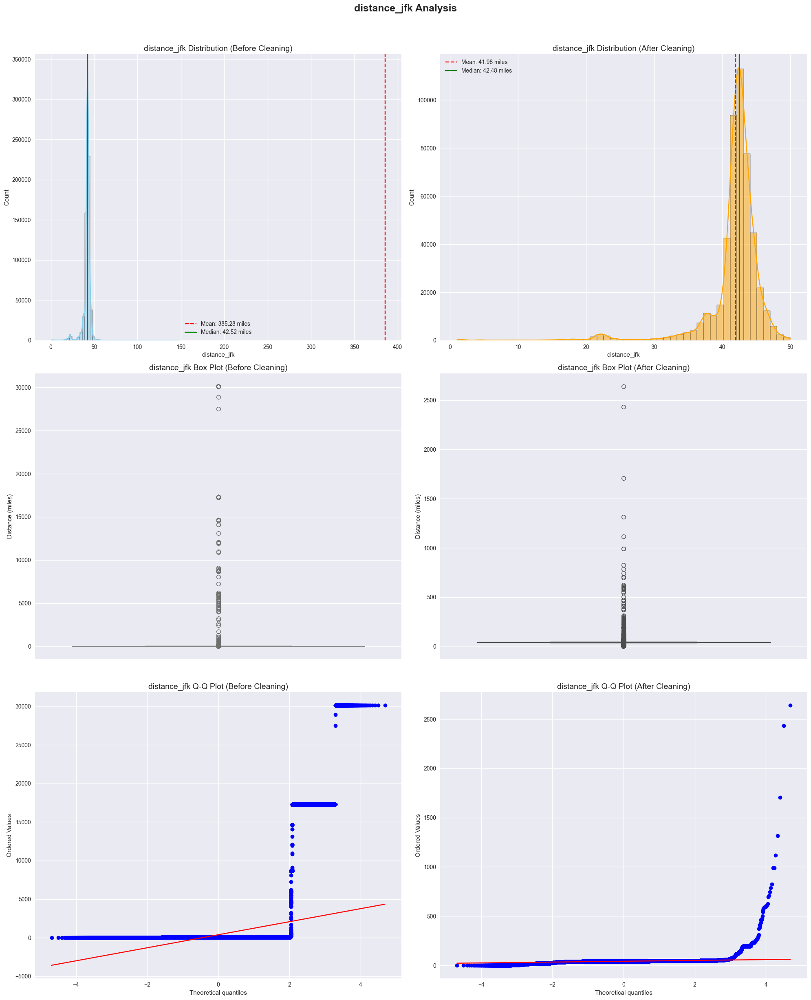

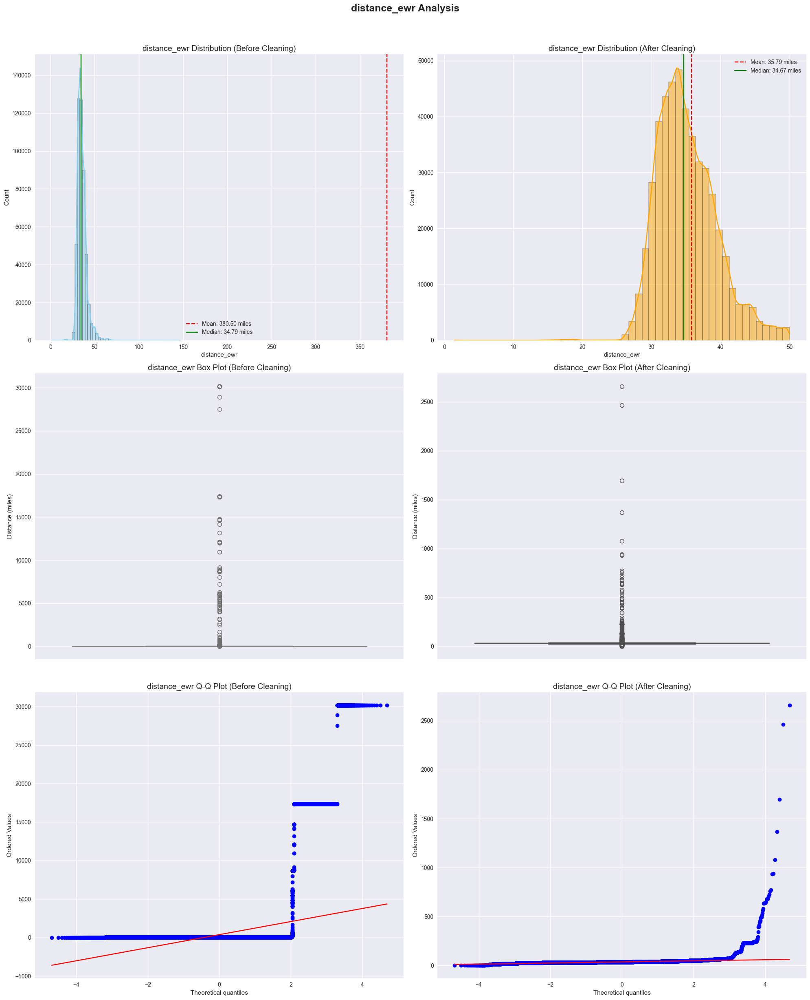

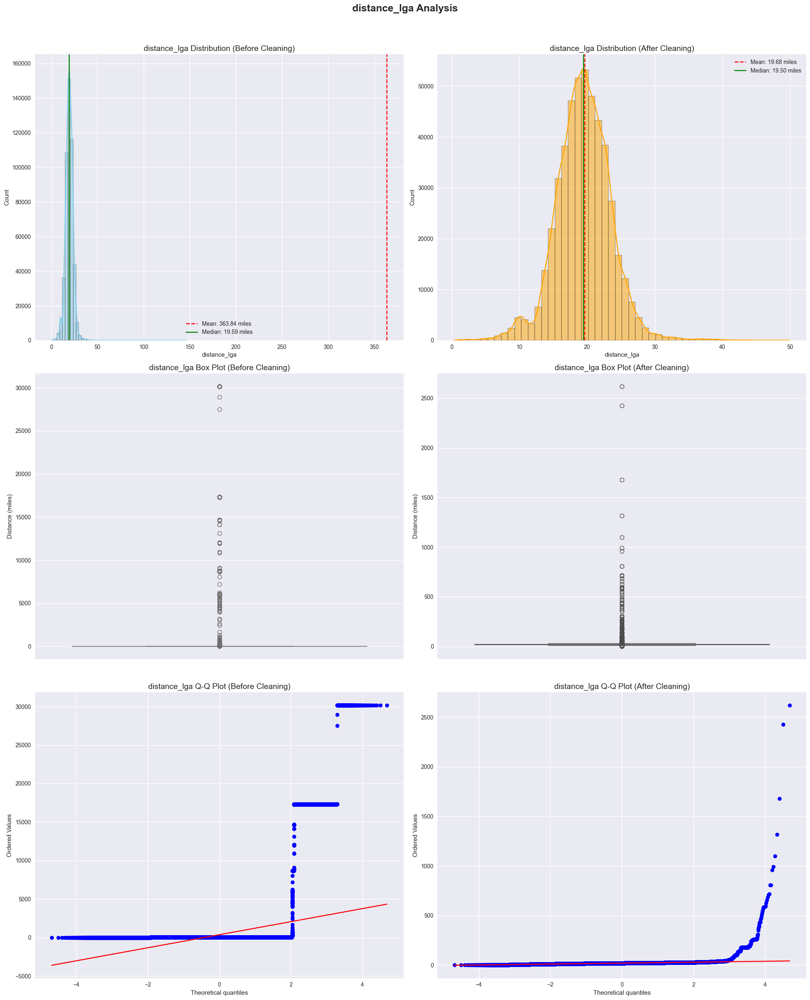

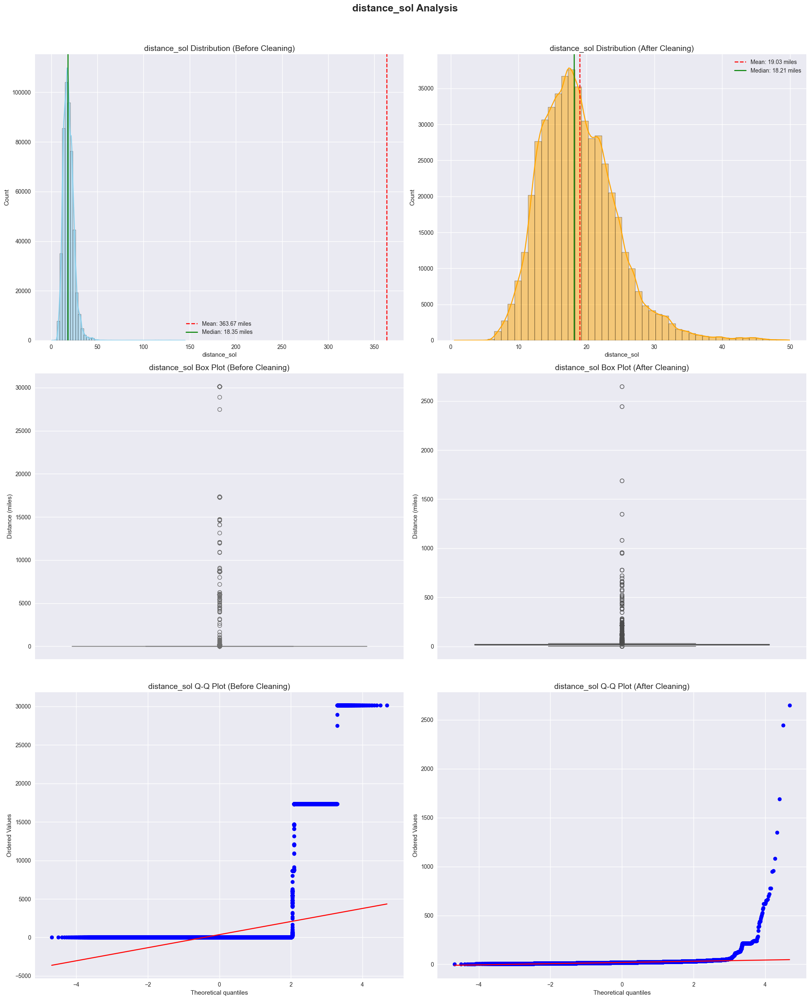

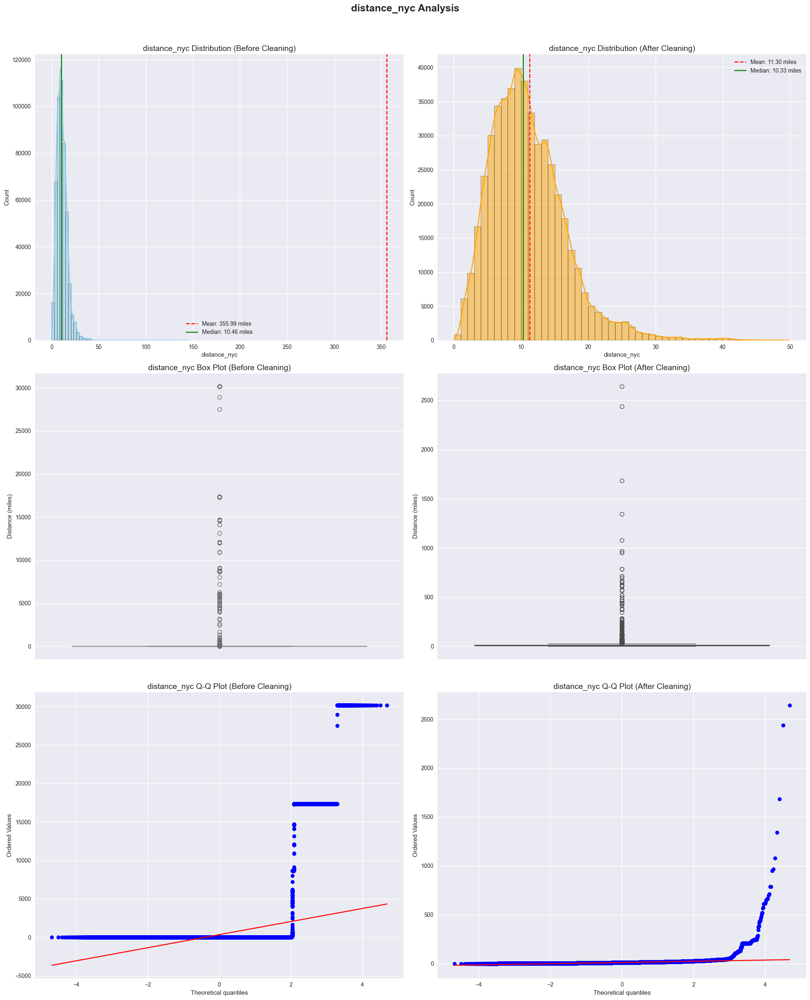


Summary Statistics:

distance_jfk Before Cleaning:
count    499995.000000
mean        385.279367
std        2419.087483
min           1.017646
25%          41.341514
50%          42.523163
75%          43.785649
max       30133.067880
Name: distance_jfk, dtype: float64

distance_jfk After Cleaning:
count    489715.000000
mean         41.977548
std           9.533108
min           1.017646
25%          41.307955
50%          42.480375
75%          43.681695
max        2640.972812
Name: distance_jfk, dtype: float64

distance_ewr Before Cleaning:
count    499995.000000
mean        380.503657
std        2428.804740
min           1.460945
25%          32.173712
50%          34.787507
75%          38.304502
max       30167.595967
Name: distance_ewr, dtype: float64

distance_ewr After Cleaning:
count    489715.000000
mean         35.789575
std          10.148148
min           1.460945
25%          32.119320
50%          34.670995
75%          38.055398
max        2658.006331
Name: distance_e

In [33]:
plt.style.use('seaborn-v0_8')
columns = ['distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol', 'distance_nyc']

for col in columns:
    # Create a 3x2 subplot layout
    fig, axes = plt.subplots(3, 2, figsize=(20, 24))
    fig.suptitle(f'{col} Analysis', fontsize=18, fontweight='bold', y=1.02)

    # Histogram before cleaning
    sns.histplot(df[df[col] <= 150], x=col, bins=50, kde=True, ax=axes[0, 0], color='skyblue')
    axes[0, 0].set_title(f'{col} Distribution (Before Cleaning)', fontsize=14)
    axes[0, 0].axvline(df[col].mean(), color='red', linestyle='--', label=f'Mean: {df[col].mean():.2f} miles')
    axes[0, 0].axvline(df[col].median(), color='green', linestyle='-', label=f'Median: {df[col].median():.2f} miles')
    axes[0, 0].legend()

    # Histogram after cleaning
    sns.histplot(df_clean[df_clean[col] <= 50], x=col, bins=50, kde=True, ax=axes[0, 1], color='orange')
    axes[0, 1].set_title(f'{col} Distribution (After Cleaning)', fontsize=14)
    axes[0, 1].axvline(df_clean[col].mean(), color='red', linestyle='--', label=f'Mean: {df_clean[col].mean():.2f} miles')
    axes[0, 1].axvline(df_clean[col].median(), color='green', linestyle='-', label=f'Median: {df_clean[col].median():.2f} miles')
    axes[0, 1].legend()

    # Box plot before cleaning
    sns.boxplot(y=df[col], ax=axes[1, 0], color='skyblue')
    axes[1, 0].set_title(f'{col} Box Plot (Before Cleaning)', fontsize=14)
    axes[1, 0].set_ylabel('Distance (miles)')

    # Box plot after cleaning
    sns.boxplot(y=df_clean[col], ax=axes[1, 1], color='orange')
    axes[1, 1].set_title(f'{col} Box Plot (After Cleaning)', fontsize=14)
    axes[1, 1].set_ylabel('Distance (miles)')

    # Q-Q plot before cleaning
    stats.probplot(df[col], dist="norm", plot=axes[2, 0])
    axes[2, 0].set_title(f'{col} Q-Q Plot (Before Cleaning)', fontsize=14)
    axes[2, 0].grid(True)

    # Q-Q plot after cleaning
    stats.probplot(df_clean[col], dist="norm", plot=axes[2, 1])
    axes[2, 1].set_title(f'{col} Q-Q Plot (After Cleaning)', fontsize=14)
    axes[2, 1].grid(True)

    plt.tight_layout()
    plt.show()

# Summary Statistics
print("\nSummary Statistics:")
for col in columns:
    print(f"\n{col} Before Cleaning:")
    print(df[col].describe())
    print(f"\n{col} After Cleaning:")
    print(df_clean[col].describe())

# Rows Removed
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")

##### Remove extreme values for the ride distance

Criteria for removal:
- Rides with zero or negative distances
- Distances exceeding reasonable NYC taxi trip limits
- Distances inconsistent with pickup/dropoff coordinates

In [34]:
def drop_out_of_range(df, column_name, min_value=0.1, max_value = 200):
    """
    Drops rows from the df where the values in the specified column are less than min_value or more than max_value.

    Parameters:
    df (pd.DataFrame): The input df.
    column_name (str): The name of the column to check.
    min_value (float): The minimum value threshold.
    max_value (float): The maximum value threshold.

    Returns:
    pd.DataFrame: The df with rows dropped where column values are out of the specified range.
    """
    # Drop rows where the column value is less than min_value or more than max_value
    filtered_df = df[(df[column_name] >= min_value) & (df[column_name] <= max_value)]
    return filtered_df

# Print summary of changes
print("\nSummary of Changes in Dataset:")
print(f"Records before cleaning: {len(df_clean):,}")

# Drop rows where column 'A' values are less than 3 or more than 7
df_clean = drop_out_of_range(df_clean, 'ride_distance')

print(f"Records after cleaning: {len(df_clean):,}")
print(f"Records removed: {len(df_clean) - len(df_clean):,}")


Summary of Changes in Dataset:
Records before cleaning: 489,715
Records after cleaning: 481,479
Records removed: 0


In [35]:
df_clean.describe()

,fare,passengers,request_hour,request_day,request_month,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing
count,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000
mean,11.306026,1.684761,13.518473,15.677722,6.269331,3.041258,2011.743090,41.931898,35.663644,19.590254,18.898694,11.154268,3.409405,0.308131
std,9.498259,1.307968,6.507787,8.681287,3.440223,1.948769,1.864116,7.038710,7.669427,7.060118,8.066608,8.138989,4.074970,1.830434
min,-44.900000,0.000000,0.000000,1.000000,1.000000,0.000000,2009.000000,1.017646,1.690427,0.382119,0.532545,0.211811,0.100018,-3.141593
25%,6.000000,1.000000,9.000000,8.000000,3.000000,1.000000,2010.000000,41.321427,32.119453,17.051545,14.805543,7.068044,1.293889,-0.890922
50%,8.500000,1.000000,14.000000,16.000000,6.000000,3.000000,2012.000000,42.483015,34.656966,19.495889,18.188579,10.305609,2.192277,-0.125623
75%,12.500000,2.000000,19.000000,23.000000,9.000000,5.000000,2013.000000,43.676311,38.017723,22.010529,22.100960,14.131876,3.976233,2.259588
max,495.000000,6.000000,23.000000,31.000000,12.000000,6.000000,2015.000000,2640.972812,2658.006331,2619.751359,2649.728342,2641.976900,174.808107,3.141593


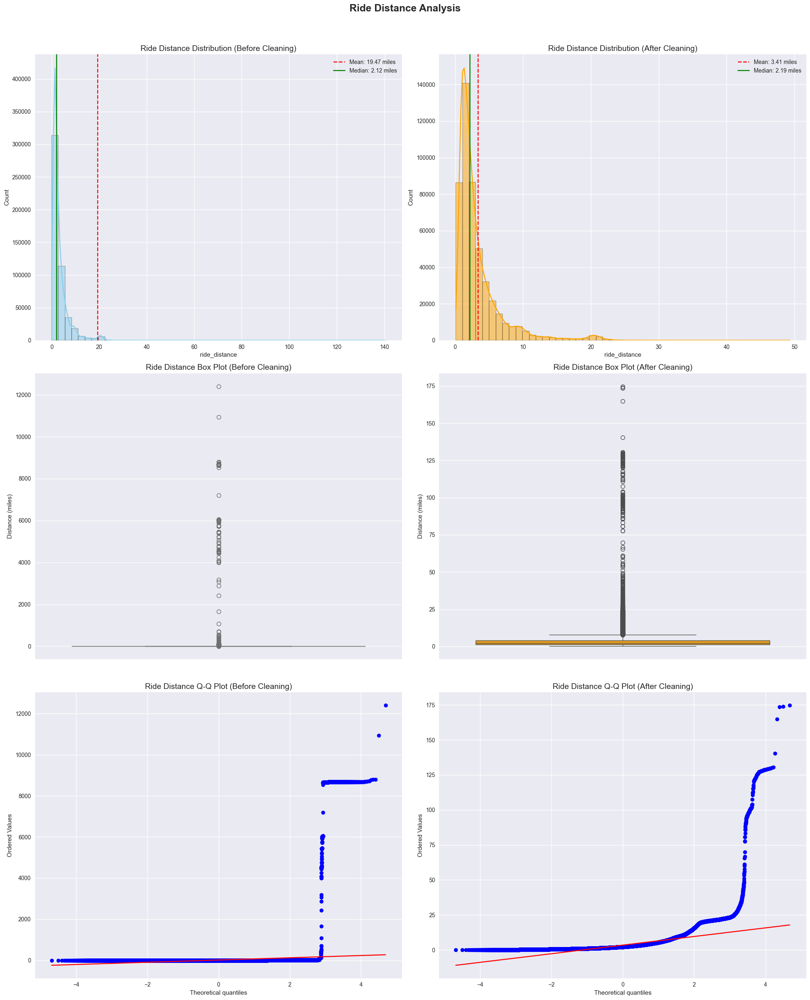


Summary Statistics:

Ride Distance Before Cleaning:
count    499995.000000
mean         19.468775
std         367.299601
min           0.000000
25%           1.214550
50%           2.116970
75%           3.890070
max       12399.956433
Name: ride_distance, dtype: float64

Ride Distance After Cleaning:
count    481479.000000
mean          3.409405
std           4.074970
min           0.100018
25%           1.293889
50%           2.192277
75%           3.976233
max         174.808107
Name: ride_distance, dtype: float64

Rows removed: 18516 (3.70%)


In [36]:
# Create figure with 3x2 subplots
plt.style.use('seaborn-v0_8')
fig, axes = plt.subplots(3, 2, figsize=(20, 24))
fig.suptitle('Ride Distance Analysis', fontsize=18, fontweight='bold', y=1.02)

# Histogram before cleaning
sns.histplot(df[df['ride_distance'] <= 150], x='ride_distance', bins=50, kde=True, 
             ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Ride Distance Distribution (Before Cleaning)', fontsize=14)
axes[0, 0].axvline(df['ride_distance'].mean(), color='red', linestyle='--', 
                   label=f'Mean: {df["ride_distance"].mean():.2f} miles')
axes[0, 0].axvline(df['ride_distance'].median(), color='green', linestyle='-', 
                   label=f'Median: {df["ride_distance"].median():.2f} miles')
axes[0, 0].legend()

# Histogram after cleaning
sns.histplot(df_clean[df_clean['ride_distance'] <= 50], x='ride_distance', bins=50, 
             kde=True, ax=axes[0, 1], color='orange')
axes[0, 1].set_title('Ride Distance Distribution (After Cleaning)', fontsize=14)
axes[0, 1].axvline(df_clean['ride_distance'].mean(), color='red', linestyle='--', 
                   label=f'Mean: {df_clean["ride_distance"].mean():.2f} miles')
axes[0, 1].axvline(df_clean['ride_distance'].median(), color='green', linestyle='-', 
                   label=f'Median: {df_clean["ride_distance"].median():.2f} miles')
axes[0, 1].legend()

# Box plot before cleaning
sns.boxplot(y=df['ride_distance'], ax=axes[1, 0], color='skyblue')
axes[1, 0].set_title('Ride Distance Box Plot (Before Cleaning)', fontsize=14)
axes[1, 0].set_ylabel('Distance (miles)')

# Box plot after cleaning
sns.boxplot(y=df_clean['ride_distance'], ax=axes[1, 1], color='orange')
axes[1, 1].set_title('Ride Distance Box Plot (After Cleaning)', fontsize=14)
axes[1, 1].set_ylabel('Distance (miles)')

# Q-Q plot before cleaning
stats.probplot(df['ride_distance'], dist="norm", plot=axes[2, 0])
axes[2, 0].set_title('Ride Distance Q-Q Plot (Before Cleaning)', fontsize=14)
axes[2, 0].grid(True)

# Q-Q plot after cleaning
stats.probplot(df_clean['ride_distance'], dist="norm", plot=axes[2, 1])
axes[2, 1].set_title('Ride Distance Q-Q Plot (After Cleaning)', fontsize=14)
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print("\nRide Distance Before Cleaning:")
print(df['ride_distance'].describe())
print("\nRide Distance After Cleaning:")
print(df_clean['ride_distance'].describe())

# Print removed rows
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")

In [37]:
# List of distance columns to handle
distance_cols = ['distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol', 'distance_nyc', 'ride_distance']

# Function to fill distance outliers with more sophisticated handling
def fill_distance_outliers(df, distance_cols):
    # Define realistic caps for distances from pickup points to landmarks (in miles)
    # Based on actual geographic distances in the tri-state area
    distance_caps = {
        'distance_jfk': 120,    # Pickups can be from upstate NY, CT, NJ
        'distance_ewr': 150,    # Newark can serve wider NJ area and beyond
        'distance_lga': 150,    # Similar to JFK
        'distance_sol': 150,    # Statue of Liberty/Liberty Island
        'distance_nyc': 150,    # Distance to NYC center from surrounding areas
        'ride_distance': 120    # Long rides can occur between states
    }
    
    # Define minimum reasonable distances
    min_distance = 0
    
    for col in distance_cols:
        # Calculate IQR
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = max(min_distance, Q1 - 1.5 * IQR)  # Don't go below minimum distance
        upper_bound = min(distance_caps.get(col, 150), Q3 + 1.5 * IQR)  # Don't go above cap
        
        # Identify outliers
        outliers = (df[col] < lower_bound) | (df[col] > upper_bound)
        
        # Add meaningful grouping conditions
        group_cols = [
            'request_hour',          # Time of day affects distance patterns
            'request_weekday',       # Day of week
            'request_weekday',         # Seasonal variations
            'distance_category',    # Your existing category
            'weather',              # Weather affects ride patterns
            'traffic',              # Traffic conditions
            'passengers'            # Number of passengers might correlate with distance
        ]
        
        # Only use groups that exist in the dataframe
        valid_group_cols = [col for col in group_cols if col in df.columns]
        
        # Fill outliers with median based on grouping conditions
        if outliers.sum() > 0:
            try:
                median_values = df.groupby(valid_group_cols)[col].transform('median')
                df.loc[outliers, col] = median_values[outliers]
                
                # Handle any remaining NaNs after group median (could happen with rare combinations)
                still_na = outliers & df[col].isna()
                if still_na.sum() > 0:
                    # Try with fewer grouping variables for rare combinations
                    simpler_groups = valid_group_cols[:min(3, len(valid_group_cols))]
                    if simpler_groups:
                        simpler_medians = df.groupby(simpler_groups)[col].transform('median')
                        df.loc[still_na, col] = simpler_medians[still_na]
            except:
                # Fallback if groupby fails
                df.loc[outliers, col] = df[col].median()
        
        # Fill any remaining NaNs with global median
        df[col] = df[col].fillna(df[col].median())
        
        # Apply final cap to ensure no unrealistic values remain
        df[col] = df[col].clip(lower=min_distance, upper=distance_caps.get(col, 150))
        
        # Print summary of changes
        print(f"Fixed {outliers.sum()} outliers in {col}")
    
    return df

# Apply the function
df_clean = fill_distance_outliers(df_clean, distance_cols)

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 49577 outliers in distance_jfk


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 18406 outliers in distance_ewr


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 12273 outliers in distance_lga


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 8259 outliers in distance_sol


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 12263 outliers in distance_nyc


C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1240876796.py:48: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_values = df.groupby(valid_group_cols)[col].transform('median')


Fixed 40124 outliers in ride_distance


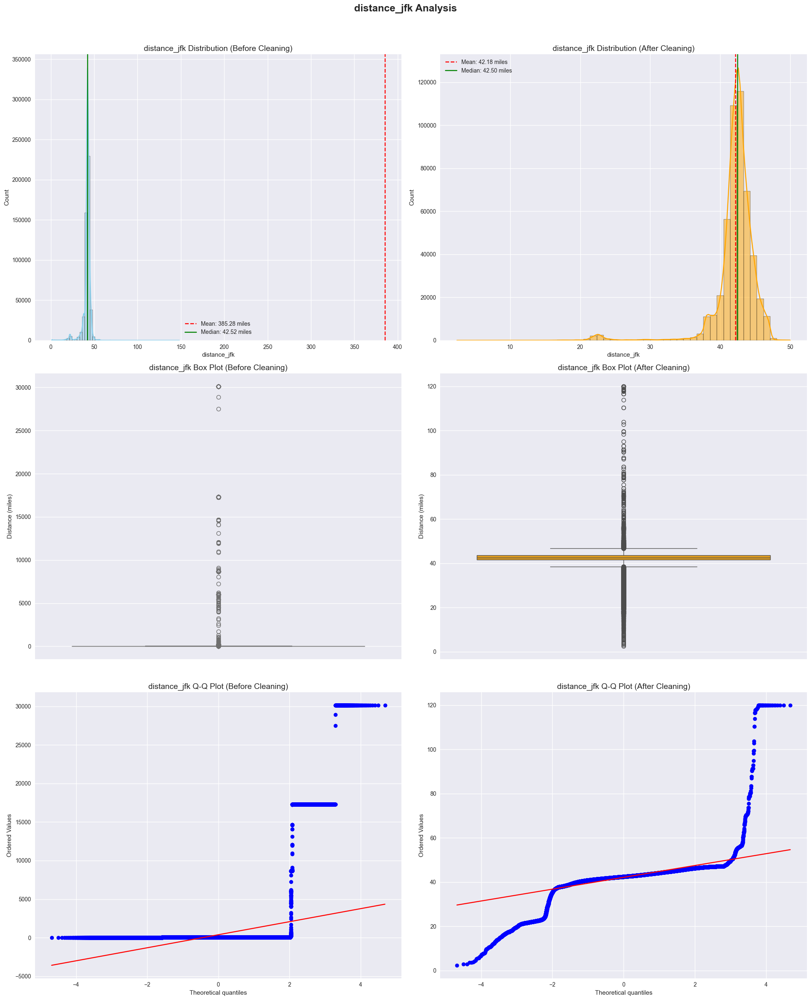

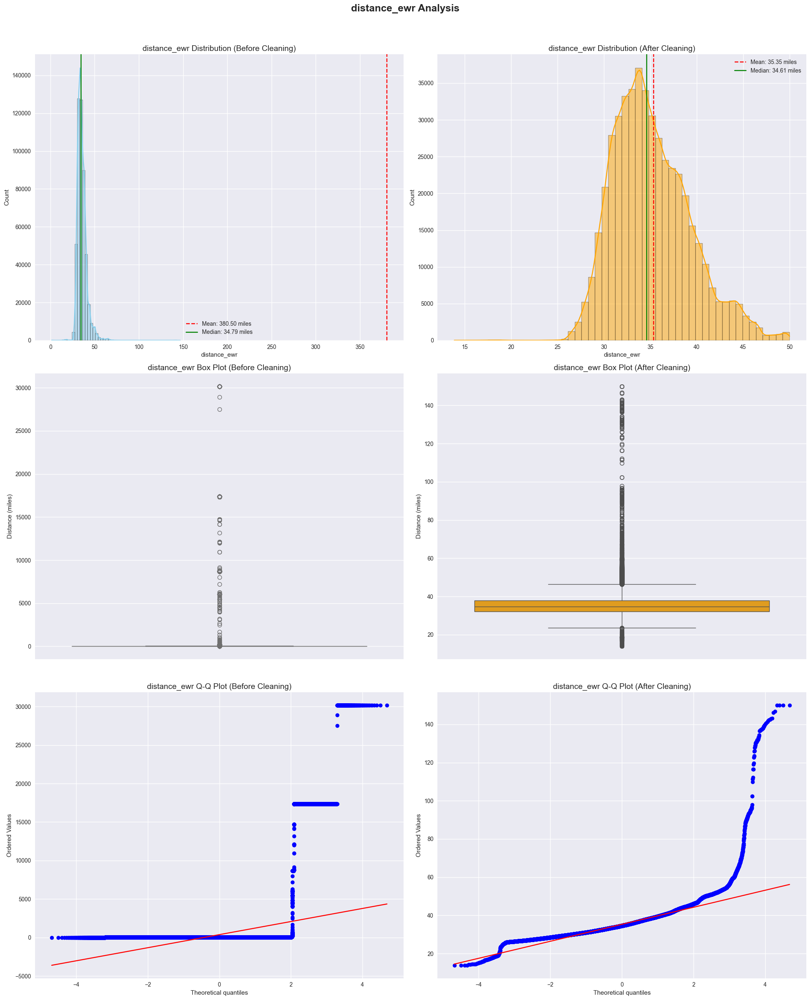

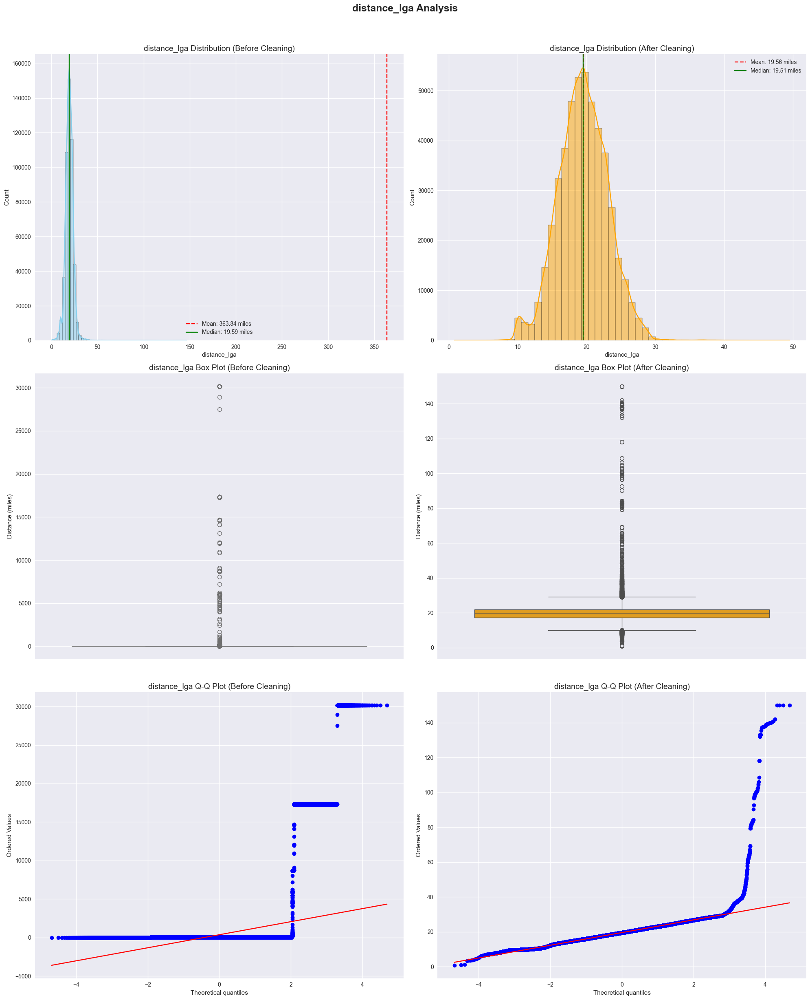

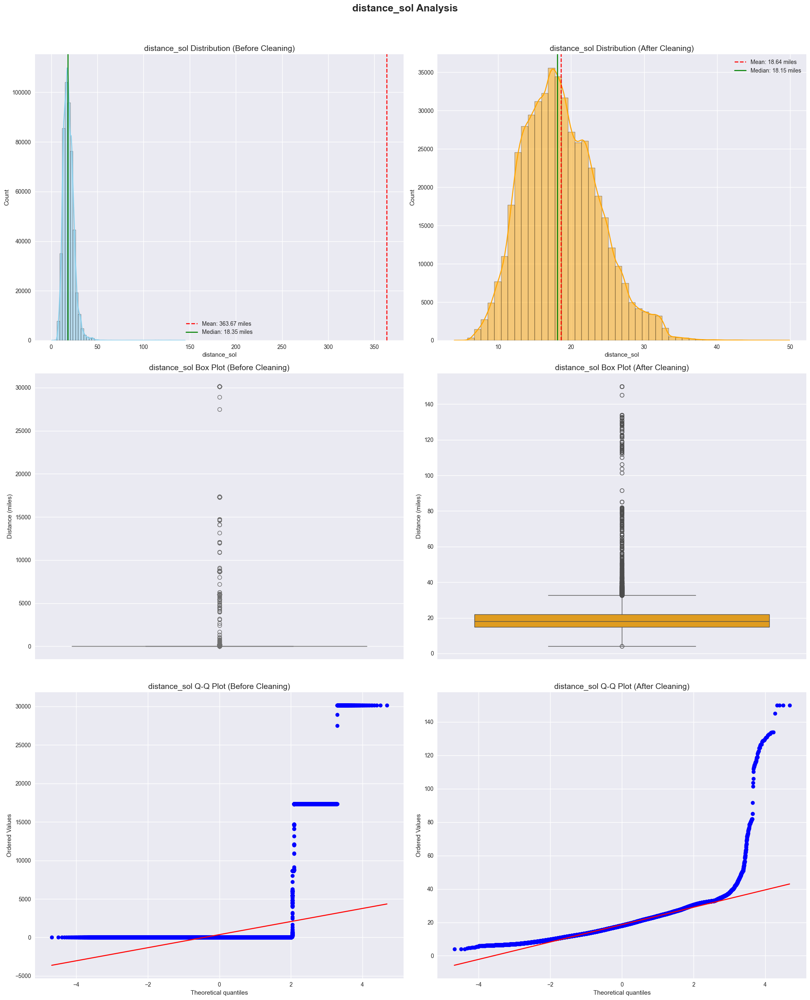

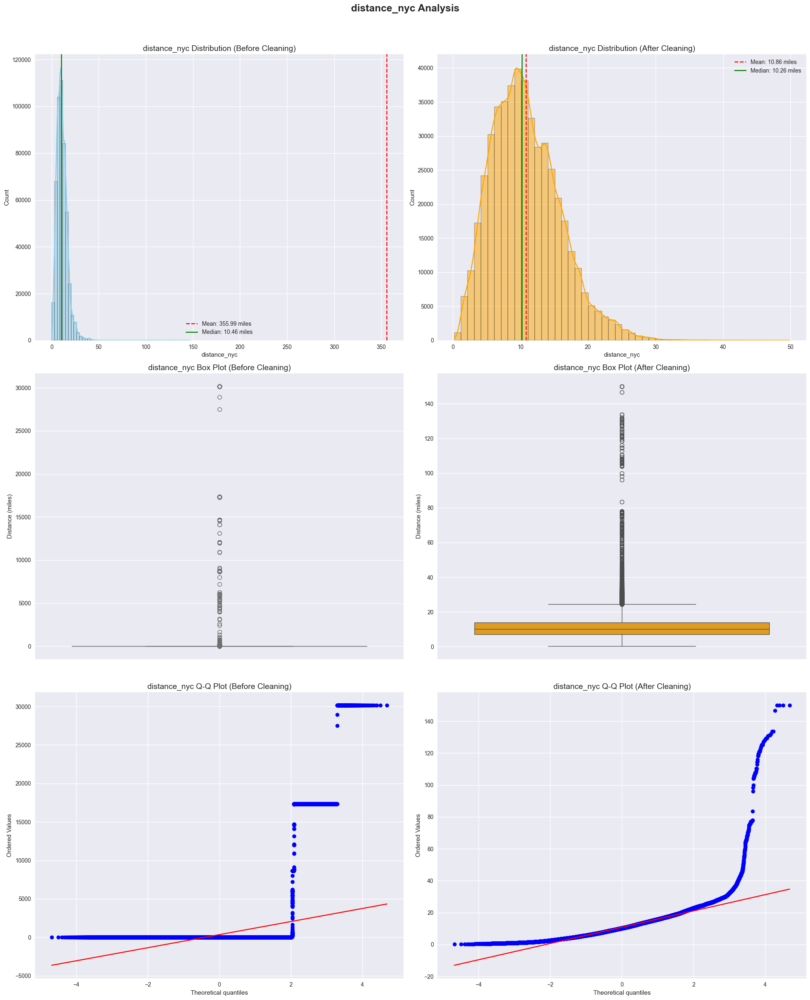

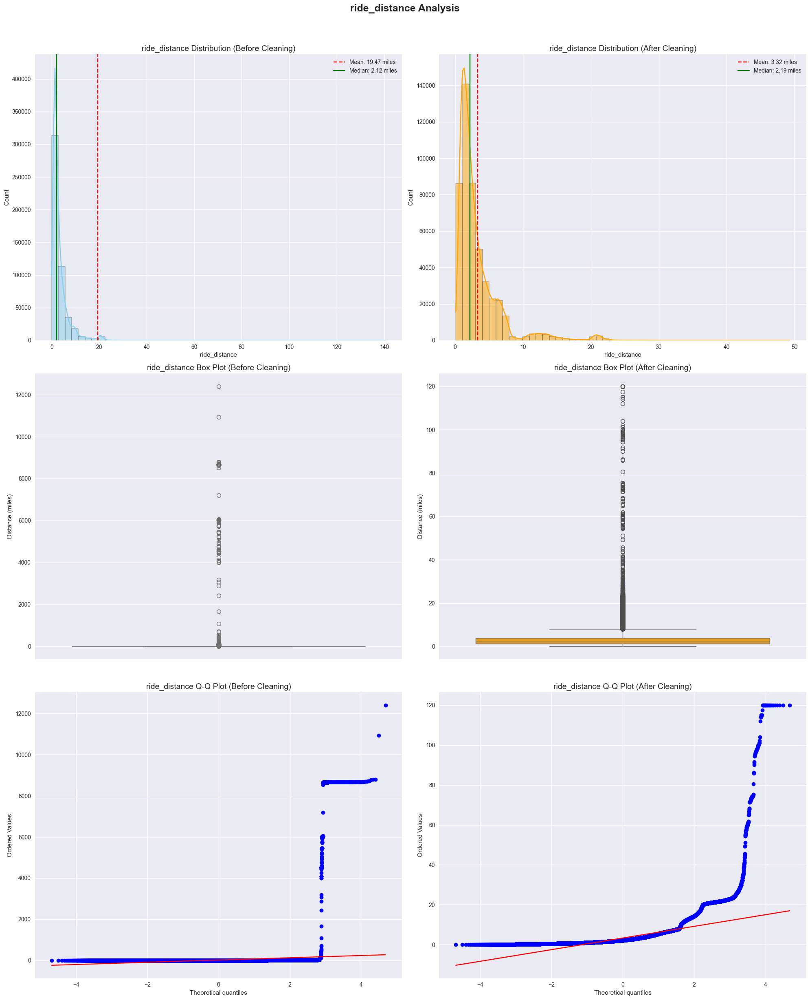


Rows removed: 18516 (3.70%)


In [38]:
plt.style.use('seaborn-v0_8')
columns = ['distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol', 'distance_nyc', 'ride_distance']

for col in columns:
    # Create a 3x2 subplot layout
    fig, axes = plt.subplots(3, 2, figsize=(20, 24))
    fig.suptitle(f'{col} Analysis', fontsize=18, fontweight='bold', y=1.02)

    # Histogram before cleaning
    sns.histplot(df[df[col] <= 150], x=col, bins=50, kde=True, ax=axes[0, 0], color='skyblue')
    axes[0, 0].set_title(f'{col} Distribution (Before Cleaning)', fontsize=14)
    axes[0, 0].axvline(df[col].mean(), color='red', linestyle='--', label=f'Mean: {df[col].mean():.2f} miles')
    axes[0, 0].axvline(df[col].median(), color='green', linestyle='-', label=f'Median: {df[col].median():.2f} miles')
    axes[0, 0].legend()

    # Histogram after cleaning
    sns.histplot(df_clean[df_clean[col] <= 50], x=col, bins=50, kde=True, ax=axes[0, 1], color='orange')
    axes[0, 1].set_title(f'{col} Distribution (After Cleaning)', fontsize=14)
    axes[0, 1].axvline(df_clean[col].mean(), color='red', linestyle='--', label=f'Mean: {df_clean[col].mean():.2f} miles')
    axes[0, 1].axvline(df_clean[col].median(), color='green', linestyle='-', label=f'Median: {df_clean[col].median():.2f} miles')
    axes[0, 1].legend()

    # Box plot before cleaning
    sns.boxplot(y=df[col], ax=axes[1, 0], color='skyblue')
    axes[1, 0].set_title(f'{col} Box Plot (Before Cleaning)', fontsize=14)
    axes[1, 0].set_ylabel('Distance (miles)')

    # Box plot after cleaning
    sns.boxplot(y=df_clean[col], ax=axes[1, 1], color='orange')
    axes[1, 1].set_title(f'{col} Box Plot (After Cleaning)', fontsize=14)
    axes[1, 1].set_ylabel('Distance (miles)')

    # Q-Q plot before cleaning
    stats.probplot(df[col], dist="norm", plot=axes[2, 0])
    axes[2, 0].set_title(f'{col} Q-Q Plot (Before Cleaning)', fontsize=14)
    axes[2, 0].grid(True)

    # Q-Q plot after cleaning
    stats.probplot(df_clean[col], dist="norm", plot=axes[2, 1])
    axes[2, 1].set_title(f'{col} Q-Q Plot (After Cleaning)', fontsize=14)
    axes[2, 1].grid(True)

    plt.tight_layout()
    plt.show()

# Rows Removed
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")

In [39]:
df_clean.describe()

,fare,passengers,request_hour,request_day,request_month,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing
count,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000,481479.000000
mean,11.306026,1.684761,13.518473,15.677722,6.269331,3.041258,2011.743090,42.178641,35.349404,19.560723,18.638843,10.863304,3.324307,0.308131
std,9.498259,1.307968,6.507787,8.681287,3.440223,1.948769,1.864116,3.375165,4.707022,3.805845,5.357878,5.312941,3.720692,1.830434
min,-44.900000,0.000000,0.000000,1.000000,1.000000,0.000000,2009.000000,2.410163,13.879314,0.785890,3.991161,0.211811,0.100018,-3.141593
25%,6.000000,1.000000,9.000000,8.000000,3.000000,1.000000,2010.000000,41.486323,32.128079,17.169584,14.802775,7.065726,1.293889,-0.890922
50%,8.500000,1.000000,14.000000,16.000000,6.000000,3.000000,2012.000000,42.500815,34.614638,19.511112,18.148809,10.261122,2.192277,-0.125623
75%,12.500000,2.000000,19.000000,23.000000,9.000000,5.000000,2013.000000,43.574026,37.865994,21.945831,21.985312,14.006779,3.976233,2.259588
max,495.000000,6.000000,23.000000,31.000000,12.000000,6.000000,2015.000000,120.000000,150.000000,150.000000,150.000000,150.000000,120.000000,3.141593


##### Handle Fare outliers

In [40]:
# Function to get distance bin
def get_distance_bin(distance):
    if distance <= 2: return '0-2'
    elif distance <= 5: return '2-5'
    elif distance <= 10: return '5-10'
    elif distance <= 20: return '10-20'
    elif distance <= 40: return '20-40'
    elif distance <= 80: return '40-80'
    else: return '80+'

In [41]:
 # Function to get time of day
def get_time_of_day(hour):
    if hour < 6: return 'night'
    elif hour < 12: return 'morning'
    elif hour < 18: return 'afternoon'
    else: return 'evening'

In [42]:
# Function to check if weekend
def is_weekend(weekday):
    return 1 if weekday in [6, 7] else 0

In [43]:
def improved_fare_outlier_handling(df_clean):
    # Calculate initial outlier boundaries
    Q1 = df_clean['fare'].quantile(0.25)
    Q3 = df_clean['fare'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identify outliers
    outlier_mask = (df_clean['fare'] < lower_bound) | (df_clean['fare'] > upper_bound)
    outlier_indices = df_clean[outlier_mask].index
    
    # Create a dictionary to store median fares for each condition group
    group_medians = {}
    
    # Calculate medians for non-outlier trips
    non_outlier_df = df_clean[~outlier_mask]
    
    for row in non_outlier_df.itertuples():
        dist_bin = get_distance_bin(row.ride_distance)
        tod = get_time_of_day(row.request_hour)
        weekend = is_weekend(row.request_weekday)
        
        key = (dist_bin, tod, weekend)
        if key not in group_medians:
            group_medians[key] = {'fares': [], 'distances': []}
        
        group_medians[key]['fares'].append(row.fare)
        group_medians[key]['distances'].append(row.ride_distance)
    
    # Calculate median for each group
    for key in group_medians:
        fares = group_medians[key]['fares']
        distances = group_medians[key]['distances']
        group_medians[key] = {
            'median_fare': np.median(fares),
            'median_distance': np.median(distances)
        }
    
    # Calculate global fare per mile (fallback)
    total_fare = non_outlier_df['fare'].sum()
    total_distance = non_outlier_df['ride_distance'].sum()
    global_fare_per_mile = total_fare / total_distance if total_distance > 0 else 0
    
    # Apply corrections for outliers
    for idx in outlier_indices:
        row = df_clean.loc[idx]
        dist_bin = get_distance_bin(row['ride_distance'])
        tod = get_time_of_day(row['request_hour'])
        weekend = is_weekend(row['request_weekday'])
        
        key = (dist_bin, tod, weekend)
        
        if key in group_medians and group_medians[key]['median_distance'] > 0:
            # Calculate fare per mile for this group
            group_fare_per_mile = group_medians[key]['median_fare'] / group_medians[key]['median_distance']
            # Apply to this trip's distance
            df_clean.loc[idx, 'fare'] = group_fare_per_mile * row['ride_distance']
        else:
            # Fallback to global fare per mile
            df_clean.loc[idx, 'fare'] = global_fare_per_mile * row['ride_distance']
    
    print(f"Handled {len(outlier_indices)} fare outliers using similar trip conditions.")
    return df_clean

# Apply the improved function
df_clean = improved_fare_outlier_handling(df_clean)

Handled 41140 fare outliers using similar trip conditions.


In [44]:
# show the rows for fare above 200
df_clean[df_clean['fare'] > 200]

,user_id,user_name,driver_name,car_condition,weather,traffic,ride_id,fare,pickup_time,passengers,...,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,distance_category
104419,erTnkb6M,Monica Mills,Sharon Hood,Excellent,windy,Dense Traffic,2009-09-20 10:11:36.0000001,340.983254,2009-09-20 10:11:36,1,...,6,2009,98.295779,146.714757,106.045818,128.968910,122.495682,97.016475,2.537408,Very Long (>20miles)
321529,2YdAr1Ci,Kristine Jones,Robert Garza,Good,sunny,Congested Traffic,2011-02-27 16:49:45.0000001,393.986456,2011-02-27 16:49:45,1,...,6,2011,120.000000,112.160073,137.860291,112.797759,112.845140,112.096933,-1.502184,Very Long (>20miles)


In [45]:
# show the rows for fare less than 2.5$ (min fare)
df_clean[df_clean['fare'] < 2.5]

,user_id,user_name,driver_name,car_condition,weather,traffic,ride_id,fare,pickup_time,passengers,...,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,distance_category
2039,OzwKB5HX,Jeffrey Barton,Jacob Reynolds,Good,stormy,Congested Traffic,2010-03-09 23:37:10.0000005,-2.900000,2010-03-09 23:37:10,1,...,1,2010,42.252029,32.959176,20.782661,17.048137,9.233393,0.184225,-2.773833,Very Short (<2miles)
2129,64UvO2qA,Todd Barajas,Barbara Olson,Very Good,stormy,Congested Traffic,2012-11-21 17:35:00.00000045,0.642277,2012-11-21 17:35:00,2,...,2,2012,44.239771,33.797297,19.924902,18.232775,10.491111,0.128002,-0.284113,Very Short (<2miles)
2432,El2fH2YN,Cynthia Herrera,Anita Brown,Very Good,sunny,Congested Traffic,2012-11-02 01:08:00.00000070,1.156316,2012-11-02 01:08:00,1,...,4,2012,42.218852,33.409757,17.418374,15.439871,7.385001,0.257050,-2.131830,Very Short (<2miles)
2780,O7BvMBem,Omar Sims,Victoria Davis,Excellent,cloudy,Flow Traffic,2015-05-01 15:38:41.0000007,0.010000,2015-05-01 15:38:41,1,...,4,2015,42.863053,38.777384,18.119048,18.402818,11.130760,0.221878,1.553575,Very Short (<2miles)
5078,ipdJnMRe,David Moran,Melissa Garcia,Bad,cloudy,Flow Traffic,2013-01-22 13:59:00.00000054,2.133923,2013-01-22 13:59:00,5,...,1,2013,40.222263,38.711633,14.709871,21.593576,13.179830,0.425279,2.539913,Very Short (<2miles)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
484835,d1LOfNDr,Curtis Sampson,Steven Johnson,Excellent,cloudy,Congested Traffic,2012-08-09 13:20:10.0000004,1.037668,2012-08-09 13:20:10,1,...,3,2012,43.965419,32.344490,21.123259,16.399213,8.689499,0.206801,-0.473715,Very Short (<2miles)
484969,h9odj2rV,Shannon Gonzalez,Randall Anderson,Good,sunny,Dense Traffic,2012-02-24 08:26:00.00000023,1.636600,2012-02-24 08:26:00,1,...,4,2012,42.627131,30.568589,22.796676,13.268177,5.265695,0.330033,2.420860,Very Short (<2miles)
489460,JymzEP02,Kiara Mitchell,Stephen Alvarez,Bad,cloudy,Congested Traffic,2012-07-01 07:42:33.0000001,0.887054,2012-07-01 07:42:33,1,...,6,2012,42.129802,33.975693,19.851046,16.411556,8.290657,0.200960,0.254638,Very Short (<2miles)
492947,MKoEyxM7,Todd Silva,Michelle Johnson,Good,stormy,Flow Traffic,2011-07-31 10:23:26.0000001,2.028343,2011-07-31 10:23:26,1,...,6,2011,42.592890,35.077681,18.827903,18.577540,10.906459,0.459517,1.692298,Very Short (<2miles)


##### Drop Invalid Data

Dropping data points where:
- Fares are negative or unreasonably high (> $200)

This step ensures data quality by removing:
1. Logically impossible values (negative fares/distances)
2. Extreme outliers that likely represent data entry errors
3. Invalid measurements that could skew analysis

In [46]:
df_clean.drop(df_clean[((df_clean['fare'] > 200) | (df_clean['fare'] < 2.5))].index, inplace=True)

In [47]:
# make log transformation for fare
df_clean['log_fare'] = np.log1p(df_clean['fare'])

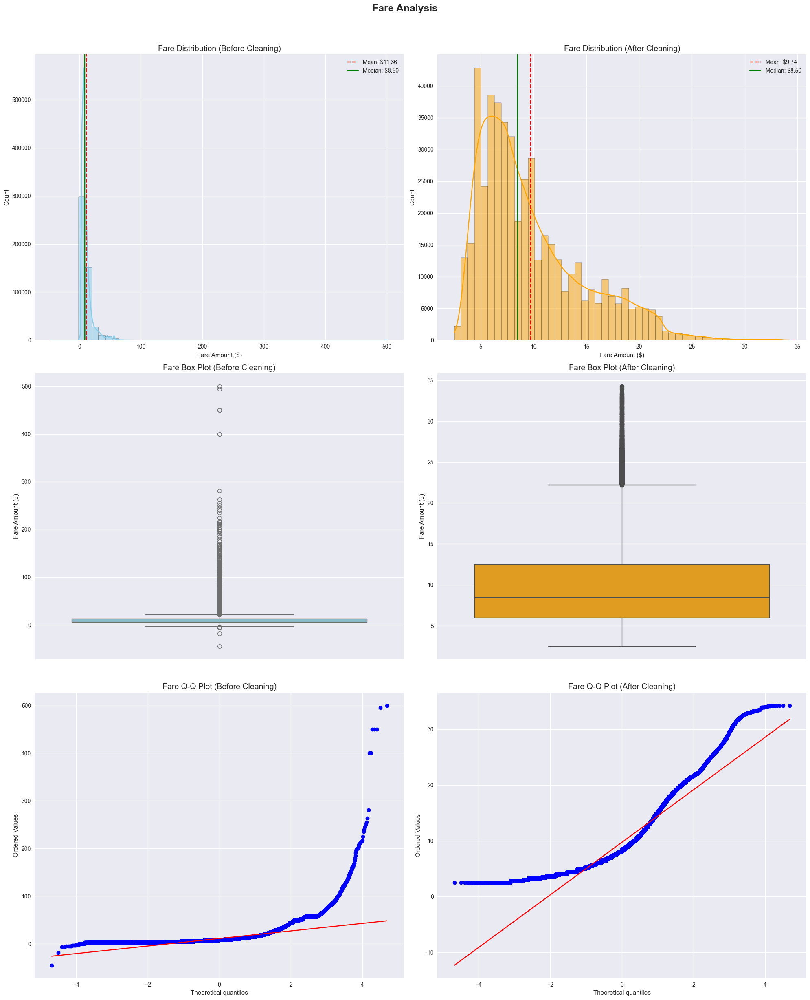


Rows removed: 18731 (3.75%)


In [48]:
plt.style.use('seaborn-v0_8')
# Create a 3x2 subplot layout
fig, axes = plt.subplots(3, 2, figsize=(20, 24))
fig.suptitle('Fare Analysis', fontsize=18, fontweight='bold', y=1.02)

# Histogram before cleaning
sns.histplot(df[df['fare'] <= 500], x='fare', bins=50, kde=True, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Fare Distribution (Before Cleaning)', fontsize=14)
axes[0, 0].axvline(df['fare'].mean(), color='red', linestyle='--', label=f'Mean: ${df["fare"].mean():.2f}')
axes[0, 0].axvline(df['fare'].median(), color='green', linestyle='-', label=f'Median: ${df["fare"].median():.2f}')
axes[0, 0].legend()
axes[0, 0].set_xlabel('Fare Amount ($)')

# Histogram after cleaning
sns.histplot(df_clean[df_clean['fare'] <= 200], x='fare', bins=50, kde=True, ax=axes[0, 1], color='orange')
axes[0, 1].set_title('Fare Distribution (After Cleaning)', fontsize=14)
axes[0, 1].axvline(df_clean['fare'].mean(), color='red', linestyle='--', label=f'Mean: ${df_clean["fare"].mean():.2f}')
axes[0, 1].axvline(df_clean['fare'].median(), color='green', linestyle='-', label=f'Median: ${df_clean["fare"].median():.2f}')
axes[0, 1].legend()
axes[0, 1].set_xlabel('Fare Amount ($)')

# Box plot before cleaning
sns.boxplot(y=df['fare'], ax=axes[1, 0], color='skyblue')
axes[1, 0].set_title('Fare Box Plot (Before Cleaning)', fontsize=14)
axes[1, 0].set_ylabel('Fare Amount ($)')

# Box plot after cleaning
sns.boxplot(y=df_clean['fare'], ax=axes[1, 1], color='orange')
axes[1, 1].set_title('Fare Box Plot (After Cleaning)', fontsize=14)
axes[1, 1].set_ylabel('Fare Amount ($)')

# Q-Q plot before cleaning
stats.probplot(df['fare'], dist="norm", plot=axes[2, 0])
axes[2, 0].set_title('Fare Q-Q Plot (Before Cleaning)', fontsize=14)
axes[2, 0].grid(True)

# Q-Q plot after cleaning
stats.probplot(df_clean['fare'], dist="norm", plot=axes[2, 1])
axes[2, 1].set_title('Fare Q-Q Plot (After Cleaning)', fontsize=14)
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

# Print removed rows
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")


In [49]:
df_clean.columns

Index(['user_id', 'user_name', 'driver_name', 'car_condition', 'weather',
       'traffic', 'ride_id', 'fare', 'pickup_time', 'passengers',
       'request_hour', 'request_day', 'request_month', 'request_weekday',
       'request_year', 'distance_jfk', 'distance_ewr', 'distance_lga',
       'distance_sol', 'distance_nyc', 'ride_distance', 'ride_bearing',
       'distance_category', 'log_fare'],
      dtype='object')

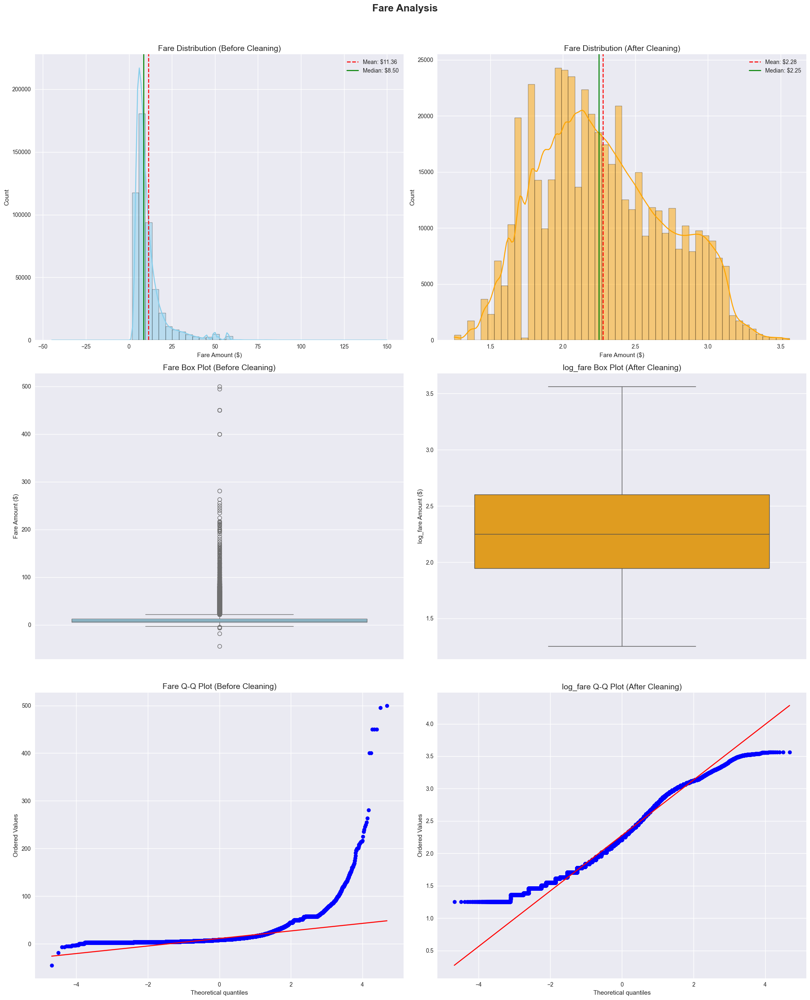


Rows removed: 18731 (3.75%)


In [50]:
plt.style.use('seaborn-v0_8')
# Create a 3x2 subplot layout
fig, axes = plt.subplots(3, 2, figsize=(20, 24))
fig.suptitle('Fare Analysis', fontsize=18, fontweight='bold', y=1.02)

# Histogram before cleaning
sns.histplot(df[df['fare'] <= 150], x='fare', bins=50, kde=True, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Fare Distribution (Before Cleaning)', fontsize=14)
axes[0, 0].axvline(df['fare'].mean(), color='red', linestyle='--', label=f'Mean: ${df["fare"].mean():.2f}')
axes[0, 0].axvline(df['fare'].median(), color='green', linestyle='-', label=f'Median: ${df["fare"].median():.2f}')
axes[0, 0].legend()
axes[0, 0].set_xlabel('Fare Amount ($)')

# Histogram after cleaning
sns.histplot(df_clean[df_clean['log_fare'] <= 50], x='log_fare', bins=50, kde=True, ax=axes[0, 1], color='orange')
axes[0, 1].set_title('Fare Distribution (After Cleaning)', fontsize=14)
axes[0, 1].axvline(df_clean['log_fare'].mean(), color='red', linestyle='--', label=f'Mean: ${df_clean["log_fare"].mean():.2f}')
axes[0, 1].axvline(df_clean['log_fare'].median(), color='green', linestyle='-', label=f'Median: ${df_clean["log_fare"].median():.2f}')
axes[0, 1].legend()
axes[0, 1].set_xlabel('Fare Amount ($)')

# Box plot before cleaning
sns.boxplot(y=df['fare'], ax=axes[1, 0], color='skyblue')
axes[1, 0].set_title('Fare Box Plot (Before Cleaning)', fontsize=14)
axes[1, 0].set_ylabel('Fare Amount ($)')

# Box plot after cleaning
sns.boxplot(y=df_clean['log_fare'], ax=axes[1, 1], color='orange')
axes[1, 1].set_title('log_fare Box Plot (After Cleaning)', fontsize=14)
axes[1, 1].set_ylabel('log_fare Amount ($)')

# Q-Q plot before cleaning
stats.probplot(df['fare'], dist="norm", plot=axes[2, 0])
axes[2, 0].set_title('Fare Q-Q Plot (Before Cleaning)', fontsize=14)
axes[2, 0].grid(True)

# Q-Q plot after cleaning
stats.probplot(df_clean['log_fare'], dist="norm", plot=axes[2, 1])
axes[2, 1].set_title('log_fare Q-Q Plot (After Cleaning)', fontsize=14)
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

# Print removed rows
removed = len(df) - len(df_clean)
percentage_removed = (removed / len(df)) * 100
print(f"\nRows removed: {removed} ({percentage_removed:.2f}%)")


##### Drop Costing feature 

In [51]:
df_clean.nunique()

user_id              481264
user_name            216522
driver_name          216640
car_condition             4
weather                   5
traffic                   3
ride_id              481264
fare                  22753
pickup_time          445417
passengers                7
request_hour             24
request_day              31
request_month            12
request_weekday           7
request_year              7
distance_jfk         448442
distance_ewr         472016
distance_lga         474367
distance_sol         477574
distance_nyc         475700
ride_distance        455340
ride_bearing         481238
distance_category         5
log_fare              22751
dtype: int64

In [52]:
# Drop Costly Columns user_id and user_name , driver_name , ride_id
df_clean.drop(columns=['user_id', 'user_name', 'driver_name', 'ride_id'], inplace=True)

In [53]:
df_clean.columns

Index(['car_condition', 'weather', 'traffic', 'fare', 'pickup_time',
       'passengers', 'request_hour', 'request_day', 'request_month',
       'request_weekday', 'request_year', 'distance_jfk', 'distance_ewr',
       'distance_lga', 'distance_sol', 'distance_nyc', 'ride_distance',
       'ride_bearing', 'distance_category', 'log_fare'],
      dtype='object')

In [54]:
df_clean.head()

,car_condition,weather,traffic,fare,pickup_time,passengers,request_hour,request_day,request_month,request_weekday,request_year,distance_jfk,distance_ewr,distance_lga,distance_sol,distance_nyc,ride_distance,ride_bearing,distance_category,log_fare
0,Very Good,windy,Congested Traffic,4.5,2009-06-15 17:26:21,1,17,15,6,0,2009,42.897628,35.603244,14.342611,20.032660,12.273036,1.030764,-2.918897,Very Short (<2miles),1.704748
1,Excellent,cloudy,Flow Traffic,16.9,2010-01-05 16:52:16,1,16,5,1,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,7.764593,-0.375217,Medium (5-10miles),2.884801
2,Bad,stormy,Congested Traffic,5.7,2011-08-18 00:35:00,2,0,18,8,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961,Very Short (<2miles),1.902108
3,Very Good,stormy,Flow Traffic,7.7,2012-04-21 04:30:42,1,4,21,4,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.799270,0.133905,Short (2-5miles),2.163323
4,Bad,stormy,Congested Traffic,5.3,2010-03-09 07:51:00,1,7,9,3,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703,Very Short (<2miles),1.840550


In [55]:
# First, create helper columns
def create_helper_columns(df_clean):
    df_with_helpers = df_clean.copy()
    
    # Convert pickup_time to datetime if not already
    df_with_helpers['pickup_time'] = pd.to_datetime(df_with_helpers['pickup_time'], format='%Y-%m-%d %H:%M:%S')
    
    # Time-related helper columns from pickup_time
    df_with_helpers['pickup_hour'] = df_with_helpers['pickup_time'].dt.hour
    df_with_helpers['pickup_minute'] = df_with_helpers['pickup_time'].dt.minute
    df_with_helpers['pickup_dayofweek'] = df_with_helpers['pickup_time'].dt.dayofweek + 1  # Making it 1-7 instead of 0-6
    df_with_helpers['pickup_month'] = df_with_helpers['pickup_time'].dt.month
    df_with_helpers['pickup_year'] = df_with_helpers['pickup_time'].dt.year
    df_with_helpers['pickup_dayofyear'] = df_with_helpers['pickup_time'].dt.dayofyear
    df_with_helpers['pickup_quarter'] = df_with_helpers['pickup_time'].dt.quarter
    df_with_helpers['pickup_week'] = df_with_helpers['pickup_time'].dt.isocalendar().week
    
    # Time of day (categorical)
    df_with_helpers['time_of_day'] = pd.cut(
        df_with_helpers['request_hour'], 
        bins=[0, 6, 12, 18, 24], 
        labels=['night', 'morning', 'afternoon', 'evening'],
        include_lowest=True
    )
    
    # Is weekend flag
    df_with_helpers['is_weekend'] = df_with_helpers['request_weekday'].isin([6, 7]).astype(int)
    
    # Is rush hour flag (7-10 AM or 4-7 PM)
    df_with_helpers['is_rush_hour'] = (
        ((df_with_helpers['pickup_hour'] >= 7) & (df_with_helpers['pickup_hour'] <= 10)) |
        ((df_with_helpers['pickup_hour'] >= 16) & (df_with_helpers['pickup_hour'] <= 19))
    ).astype(int)
    
    # Distance bins
    if 'ride_distance' in df_with_helpers.columns:
        df_with_helpers['distance_bin'] = pd.cut(
            df_with_helpers['ride_distance'], 
            bins=[0, 2, 5, 10, 20, 40, 80, 150], 
            labels=['0-2', '2-5', '5-10', '10-20', '20-40', '40-80', '80+'],
            include_lowest=True
        )
        
        # Price per mile
        if 'fare' in df_with_helpers.columns:
            df_with_helpers['price_per_mile'] = df_with_helpers['fare'] / df_with_helpers['ride_distance'].replace(0, 0.1)
    
    # Direction categorical (N, NE, E, SE, S, SW, W, NW)
    if 'ride_bearing' in df_with_helpers.columns:
        directions = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
        df_with_helpers['direction'] = pd.cut(
            df_with_helpers['ride_bearing'] % (2 * np.pi), 
            bins=np.linspace(0, 2 * np.pi, 9), 
            labels=directions,
            include_lowest=True
        )
    
    return df_with_helpers

# Apply function to create helper columns
print("Creating helper columns...")
df_clean = create_helper_columns(df_clean)
print("\nNew columns added:")
print(df_clean.columns.difference(df.columns).tolist())

Creating helper columns...

New columns added:
['direction', 'distance_bin', 'is_rush_hour', 'is_weekend', 'log_fare', 'pickup_dayofweek', 'pickup_dayofyear', 'pickup_hour', 'pickup_minute', 'pickup_month', 'pickup_quarter', 'pickup_week', 'pickup_year', 'price_per_mile', 'time_of_day']


---

#### Feature Engineering - Categorical Encoding

##### Types of Encoding

1. **Ordinal Encoding**
    - For categories with clear order
    - Examples: car_condition, traffic, distance_bin
    ```python
    df['car_condition_encoded'] = df['car_condition'].map({
         'Bad': 0, 'Good': 1, 'Very Good': 2, 'Excellent': 3
    })
    ```

2. **One-Hot Encoding**
    - For nominal categories with no inherent order
    - Example: weather
    ```python
    pd.get_dummies(df['weather'], prefix='weather')
    ```

3. **Cyclical Encoding**
    - For features with circular relationships 
    - Examples: time_of_day, direction, request_weekday
    ```python
    # Convert to sin/cos components to preserve circular nature
    df['time_sin'] = np.sin(2 * np.pi * time_value / period)
    df['time_cos'] = np.cos(2 * np.pi * time_value / period)
    ```

##### Implementation Summary
- car_condition: Ordinal (Bad→Excellent)
- weather: One-hot (each type affects rides differently)
- traffic: Ordinal (Flow→Dense→Congested)
- distance_bin: Ordinal (shortest→longest) 
- time_of_day: Cyclical (morning→afternoon→evening→night→morning)
- direction: Cyclical (compass directions are circular)
- request_weekday: Cyclical (weekly pattern)

*Note: Always use .astype(float) before mathematical operations on encoded categories*

In [56]:
# Get unique values for each categorical column
categorical_cols = df_clean.select_dtypes(include=['object', 'category']).columns

# Print the unique values in a readable format
for col in categorical_cols:
    unique_vals = df_clean[col].unique()
    
    print(f"\nUnique {col} values ({len(unique_vals)} total):")
    
    # If there aren't too many values, print them all
    if len(unique_vals) <= 15:
        if isinstance(unique_vals[0], str):
            print(", ".join(sorted(unique_vals)))
        else:
            print(", ".join(sorted(str(val) for val in unique_vals)))
    else:
        print(f"Too many values to display ({len(unique_vals)} unique values)")


Unique car_condition values (4 total):
Bad, Excellent, Good, Very Good

Unique weather values (5 total):
cloudy, rainy, stormy, sunny, windy

Unique traffic values (3 total):
Congested Traffic, Dense Traffic, Flow Traffic

Unique distance_category values (5 total):
Long (10-20miles), Medium (5-10miles), Short (2-5miles), Very Long (>20miles), Very Short (<2miles)

Unique time_of_day values (4 total):
afternoon, evening, morning, night

Unique distance_bin values (7 total):
0-2, 10-20, 2-5, 20-40, 40-80, 5-10, 80+

Unique direction values (8 total):
E, N, NE, NW, S, SE, SW, W


#### Direction Cyclic Encoding Explained

##### The Problem
When encoding compass directions (N, NE, E, SE, S, SW, W, NW), standard encoding methods create artificial discontinuities:

* Ordinal encoding (N=0, NE=1, E=2, etc.) suggests N and NW are far apart
* In reality, they're adjacent directions on a compass
* The circular nature of directions needs to be preserved

##### The Solution: Cyclic Encoding
We convert each direction to two components using sine and cosine:

1. First convert direction to angle:
    * N = 0°
    * NE = 45°
    * E = 90°
    * SE = 135°
    * S = 180°
    * SW = 225°
    * W = 270°
    * NW = 315°

2. Then transform to coordinates:
    * direction_sin = sin(angle)
    * direction_cos = cos(angle)

##### Why It Works

* Similar directions have similar encoded values
* N (0°) and NW (315°) are now show in the feature space
* Values wrap smoothly around the circle
* Each direction becomes a point on the unit circle
* Preserves the cyclic relationship between directions

##### Example Values
```python
N:  (sin=0.00,  cos=1.00)
NE: (sin=0.71,  cos=0.71)
E:  (sin=1.00,  cos=0.00)
SE: (sin=0.71,  cos=-0.71)
S:  (sin=0.00,  cos=-1.00)
SW: (sin=-0.71, cos=-0.71)
W:  (sin=-1.00, cos=0.00)
NW: (sin=-0.71, cos=0.71)
```

This encoding preserves the circular relationship between directions and is essential for machine learning models to correctly interpret directional features.


In [57]:
# Create copies of original columns before encoding
df_encoded = df_clean.copy()

In [58]:
# 1. car_condition - Ordinal encoding
car_condition_order = ['Bad', 'Good', 'Very Good', 'Excellent']
df_encoded['car_condition_encoded'] = df_encoded['car_condition'].map(
    {val: idx for idx, val in enumerate(car_condition_order)}
).astype(float)  # Convert to numeric explicitly

# 2. weather - One-hot encoding
weather_dummies = pd.get_dummies(df_encoded['weather'], prefix='weather', drop_first=False)
df_encoded = pd.concat([df_encoded, weather_dummies], axis=1)

# 3. traffic - Ordinal encoding
traffic_order = ['Flow Traffic', 'Dense Traffic', 'Congested Traffic']
df_encoded['traffic_encoded'] = df_encoded['traffic'].map(
    {val: idx for idx, val in enumerate(traffic_order)}
).astype(float)  # Convert to numeric explicitly

# 4. distance_bin - Ordinal encoding
distance_bin_order = ['0-2', '2-5', '5-10', '10-20', '20-40', '40-80', '80+']
df_encoded['distance_bin_encoded'] = df_encoded['distance_bin'].map(
    {val: idx for idx, val in enumerate(distance_bin_order)}
).astype(float)  # Convert to numeric explicitly

# 5. time_of_day - Cyclical encoding
time_mapping = {'morning': 0, 'afternoon': 1, 'evening': 2, 'night': 3}
# Convert to numeric type explicitly before math operations
df_encoded['time_of_day_encoded'] = df_encoded['time_of_day'].map(time_mapping).astype(float)

# Now apply trigonometric transformations
df_encoded['time_of_day_sin'] = np.sin(2 * np.pi * df_encoded['time_of_day_encoded'] / 4)
df_encoded['time_of_day_cos'] = np.cos(2 * np.pi * df_encoded['time_of_day_encoded'] / 4)

# 6. direction - Cyclical encoding
direction_to_angle = {'N': 0, 'NE': 45, 'E': 90, 'SE': 135, 'S': 180, 'SW': 225, 'W': 270, 'NW': 315}
df_encoded['direction_angle'] = df_encoded['direction'].map(direction_to_angle).astype(float)
df_encoded['direction_sin'] = np.sin(np.radians(df_encoded['direction_angle']))
df_encoded['direction_cos'] = np.cos(np.radians(df_encoded['direction_angle']))

# 7. Weekday - Cyclical encoding
# The request_weekday column exists as seen from the error trace
df_encoded['weekday_sin'] = np.sin(2 * np.pi * df_encoded['request_weekday'].astype(float) / 7)
df_encoded['weekday_cos'] = np.cos(2 * np.pi * df_encoded['request_weekday'].astype(float) / 7)

# Create weekend flag
df_encoded['is_weekend'] = df_encoded['request_weekday'].isin([5, 6]).astype(int)

---

#### Data Analysis and Visualizations


In [59]:
df_encoded.columns

Index(['car_condition', 'weather', 'traffic', 'fare', 'pickup_time',
       'passengers', 'request_hour', 'request_day', 'request_month',
       'request_weekday', 'request_year', 'distance_jfk', 'distance_ewr',
       'distance_lga', 'distance_sol', 'distance_nyc', 'ride_distance',
       'ride_bearing', 'distance_category', 'log_fare', 'pickup_hour',
       'pickup_minute', 'pickup_dayofweek', 'pickup_month', 'pickup_year',
       'pickup_dayofyear', 'pickup_quarter', 'pickup_week', 'time_of_day',
       'is_weekend', 'is_rush_hour', 'distance_bin', 'price_per_mile',
       'direction', 'car_condition_encoded', 'weather_cloudy', 'weather_rainy',
       'weather_stormy', 'weather_sunny', 'weather_windy', 'traffic_encoded',
       'distance_bin_encoded', 'time_of_day_encoded', 'time_of_day_sin',
       'time_of_day_cos', 'direction_angle', 'direction_sin', 'direction_cos',
       'weekday_sin', 'weekday_cos'],
      dtype='object')

#### 1. Temporal Patterns

- Time series analysis of fares

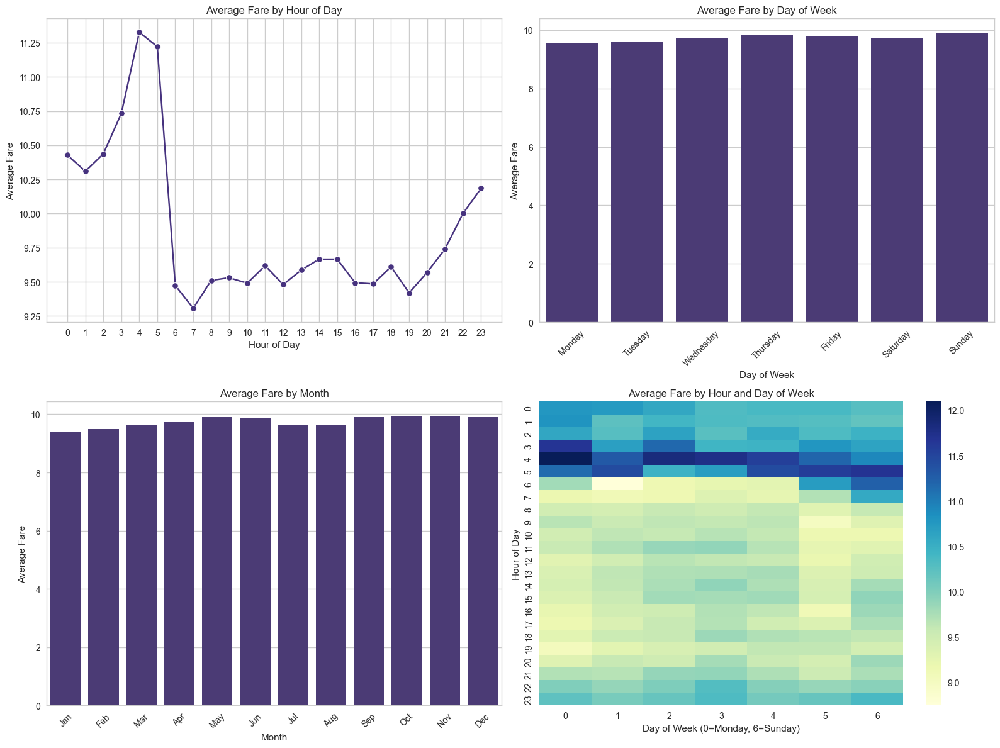

In [60]:
# Set the style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

# 1. Time series analysis of fares
plt.figure(figsize=(16, 12))

# Average fare by time of day
plt.subplot(2, 2, 1)
time_of_day_fare = df_encoded.groupby('request_hour')['fare'].mean().reset_index()
sns.lineplot(x='request_hour', y='fare', data=time_of_day_fare, marker='o')
plt.title('Average Fare by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Fare')
plt.xticks(range(0, 24), [str(i) for i in range(24)])

# Average fare by day of week
plt.subplot(2, 2, 2)
day_of_week_fare = df_encoded.groupby('request_weekday')['fare'].mean().reset_index()
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_of_week_fare['day_name'] = day_of_week_fare['request_weekday'].apply(lambda x: days[x])
sns.barplot(x='day_name', y='fare', data=day_of_week_fare)
plt.title('Average Fare by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Average Fare')
plt.xticks(rotation=45)

# Average fare by month
plt.subplot(2, 2, 3)
month_fare = df_encoded.groupby('request_month')['fare'].mean().reset_index()
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
month_fare['month_name'] = month_fare['request_month'].apply(lambda x: months[x-1])
sns.barplot(x='month_name', y='fare', data=month_fare)
plt.title('Average Fare by Month')
plt.xlabel('Month')
plt.ylabel('Average Fare')
plt.xticks(rotation=45)

# Heatmap of fares by hour vs day of week
plt.subplot(2, 2, 4)
pivot_table = df_encoded.pivot_table(values='fare', index='request_hour', 
                                    columns='request_weekday', aggfunc='mean')
sns.heatmap(pivot_table, cmap='YlGnBu', annot=False, fmt='.1f')
plt.title('Average Fare by Hour and Day of Week')
plt.xlabel('Day of Week (0=Monday, 6=Sunday)')
plt.ylabel('Hour of Day')

plt.tight_layout()
plt.show()

- Seasonal decomposition


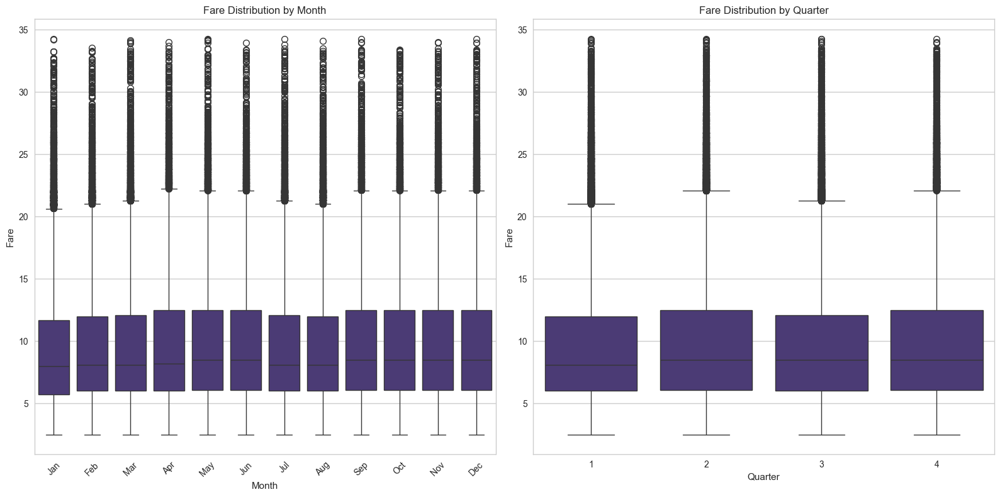

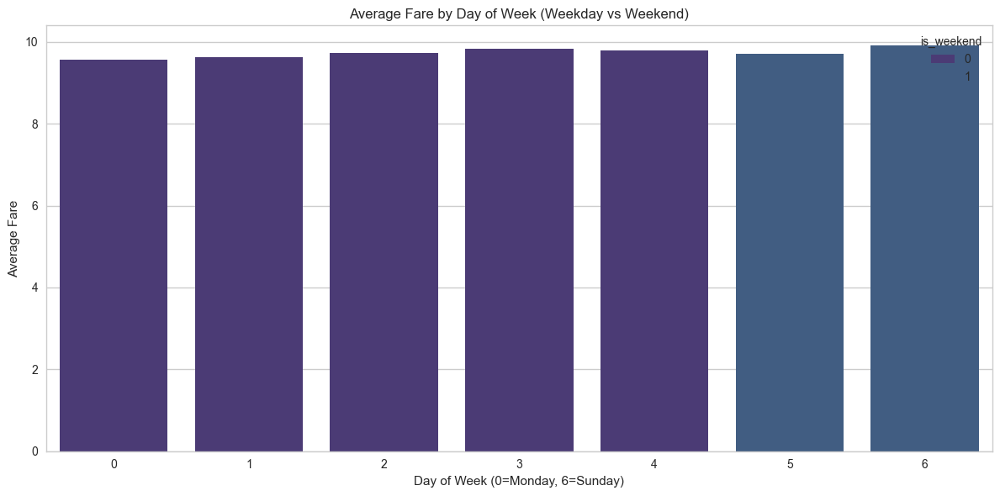

In [61]:
# 2. Seasonal decomposition
plt.figure(figsize=(16, 8))

# Box plots of fare by month
plt.subplot(1, 2, 1)
sns.boxplot(x='request_month', y='fare', data=df_encoded)
plt.title('Fare Distribution by Month')
plt.xlabel('Month')
plt.ylabel('Fare')
plt.xticks(range(12), months, rotation=45)

# Box plots of fare by quarter
plt.subplot(1, 2, 2)
sns.boxplot(x='pickup_quarter', y='fare', data=df_encoded)
plt.title('Fare Distribution by Quarter')
plt.xlabel('Quarter')
plt.ylabel('Fare')

plt.tight_layout()
plt.show()

# Weekday vs Weekend comparison
plt.figure(figsize=(12, 6))
weekday_data = df_encoded.groupby(['request_weekday', 'is_weekend'])['fare'].mean().reset_index()
sns.barplot(x='request_weekday', y='fare', hue='is_weekend', data=weekday_data)
plt.title('Average Fare by Day of Week (Weekday vs Weekend)')
plt.xlabel('Day of Week (0=Monday, 6=Sunday)')
plt.ylabel('Average Fare')
plt.tight_layout()
plt.show()

#### 2. Spatial and Distance Analysis

- Distance relationships

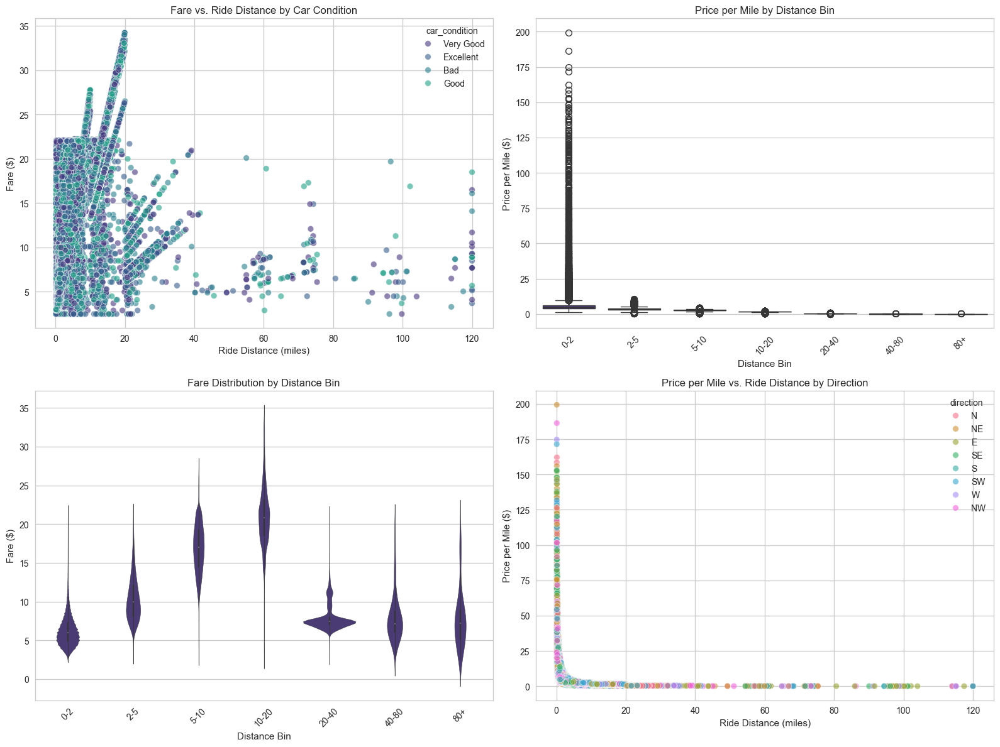

In [62]:
# Set the style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

# 1. Distance relationships
plt.figure(figsize=(16, 12))

# Scatter plot of ride_distance vs. fare with color encoding for car_condition
plt.subplot(2, 2, 1)
sns.scatterplot(data=df_encoded, x='ride_distance', y='fare', hue='car_condition', alpha=0.6)
plt.title('Fare vs. Ride Distance by Car Condition')
plt.xlabel('Ride Distance (miles)')
plt.ylabel('Fare ($)')

# Box plots of price_per_mile across distance_bin
plt.subplot(2, 2, 2)
sns.boxplot(data=df_encoded, x='distance_bin', y='price_per_mile')
plt.title('Price per Mile by Distance Bin')
plt.xlabel('Distance Bin')
plt.ylabel('Price per Mile ($)')
plt.xticks(rotation=45)

# Violin plots of fare by distance_bin
plt.subplot(2, 2, 3)
sns.violinplot(data=df_encoded, x='distance_bin', y='fare')
plt.title('Fare Distribution by Distance Bin')
plt.xlabel('Distance Bin')
plt.ylabel('Fare ($)')
plt.xticks(rotation=45)

# Scatter plot of ride_distance vs. price_per_mile with direction encoding
plt.subplot(2, 2, 4)
sns.scatterplot(data=df_encoded, x='ride_distance', y='price_per_mile', hue='direction', alpha=0.6)
plt.title('Price per Mile vs. Ride Distance by Direction')
plt.xlabel('Ride Distance (miles)')
plt.ylabel('Price per Mile ($)')

plt.tight_layout()
plt.show()


- Directional analysis

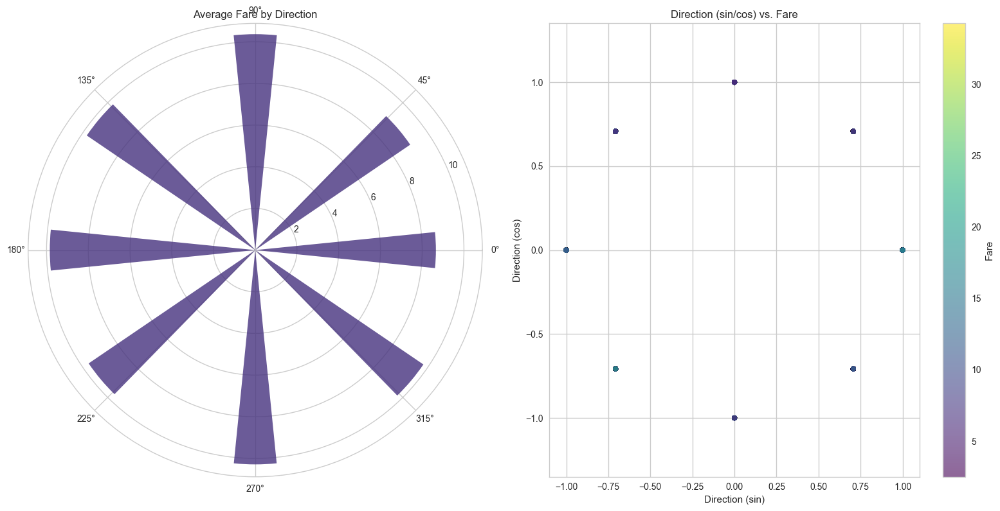

In [63]:
# 2. Directional analysis
plt.figure(figsize=(16, 8))

# Polar plot using direction_angle and fare
plt.subplot(1, 2, 1, polar=True)
# Group by direction angle (round to nearest 10 degrees)
df_encoded['direction_angle_rounded'] = np.round(df_encoded['direction_angle'] / 10) * 10
direction_fare = df_encoded.groupby('direction_angle_rounded')['fare'].mean().reset_index()
angles = np.deg2rad(direction_fare['direction_angle_rounded'])
fares = direction_fare['fare']
plt.bar(angles, fares, width=0.2, alpha=0.8)
plt.title('Average Fare by Direction')

# Scatter plot of direction_sin vs. direction_cos colored by fare
plt.subplot(1, 2, 2)
scatter = plt.scatter(df_encoded['direction_sin'], df_encoded['direction_cos'], 
                     c=df_encoded['fare'], cmap='viridis', alpha=0.6, s=30)
plt.colorbar(scatter, label='Fare')
plt.title('Direction (sin/cos) vs. Fare')
plt.xlabel('Direction (sin)')
plt.ylabel('Direction (cos)')
plt.axis('equal')

plt.tight_layout()
plt.show()


- Additional distance analysis


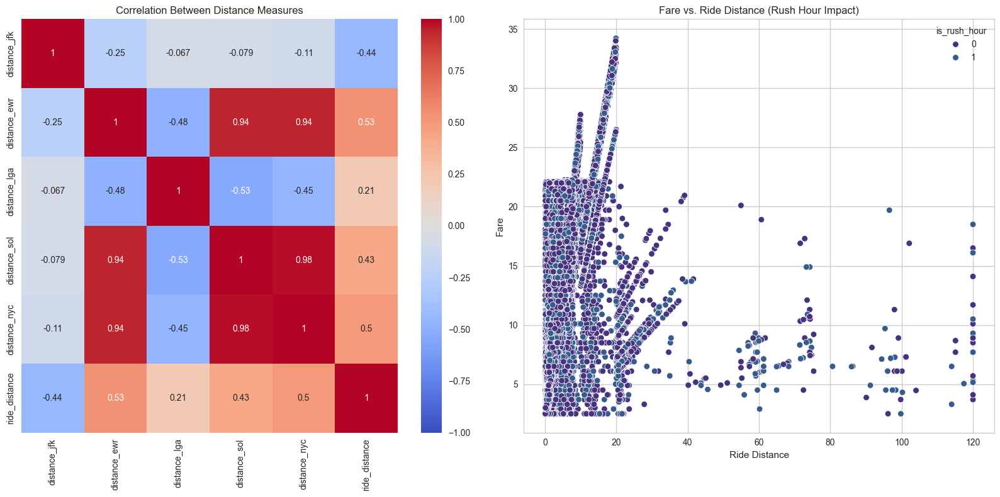

In [64]:
# Additional distance analysis
plt.figure(figsize=(16, 8))

# Relation between different distance measures
distance_cols = ['distance_jfk', 'distance_ewr', 'distance_lga', 'distance_sol', 'distance_nyc', 'ride_distance']
distance_corr = df_encoded[distance_cols].corr()

plt.subplot(1, 2, 1)
sns.heatmap(distance_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Between Distance Measures')

# Scatter plot matrix for distances and fare
plt.subplot(1, 2, 2)
sns.scatterplot(x='ride_distance', y='fare', hue='is_rush_hour', data=df_encoded)
plt.title('Fare vs. Ride Distance (Rush Hour Impact)')
plt.xlabel('Ride Distance')
plt.ylabel('Fare')

plt.tight_layout()
plt.show()


#### 3. Factor Analysis

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\3317590126.py:49: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  traffic_time = df_encoded.pivot_table(values='fare', index='traffic', columns='time_of_day', aggfunc='mean')


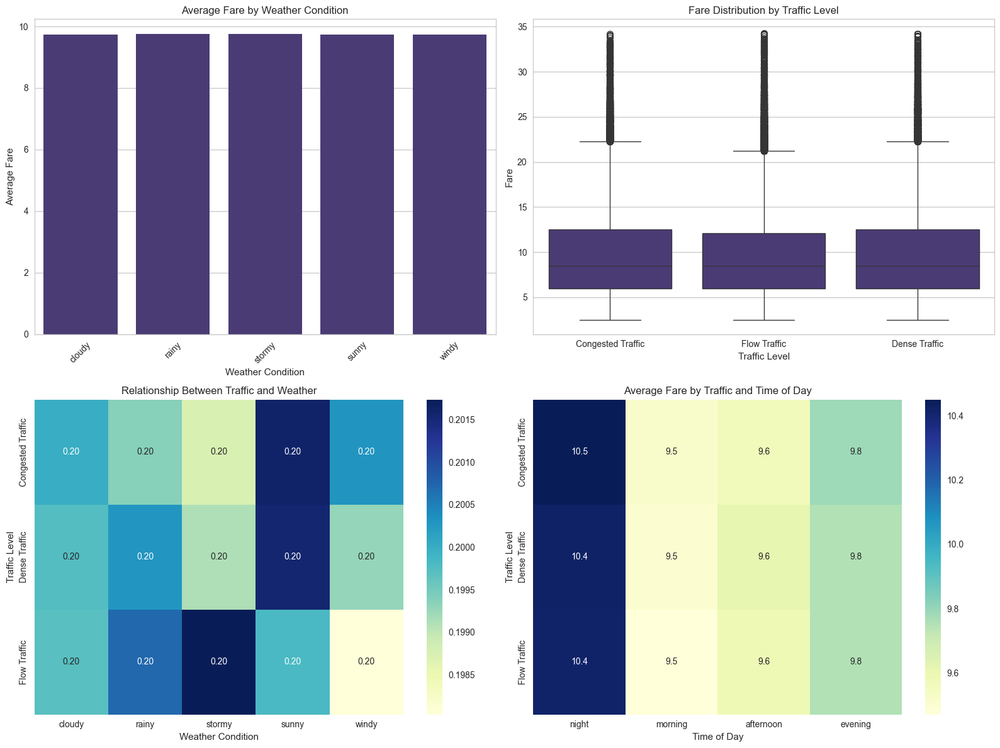

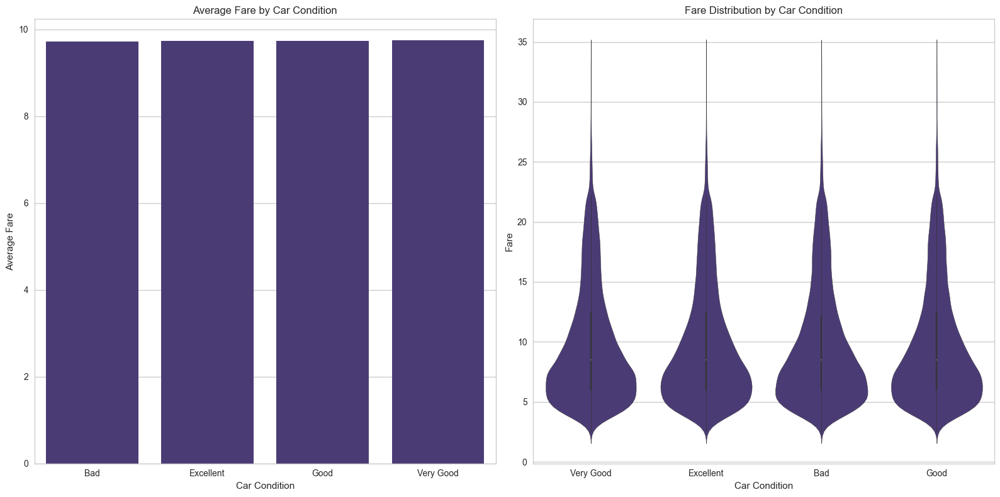

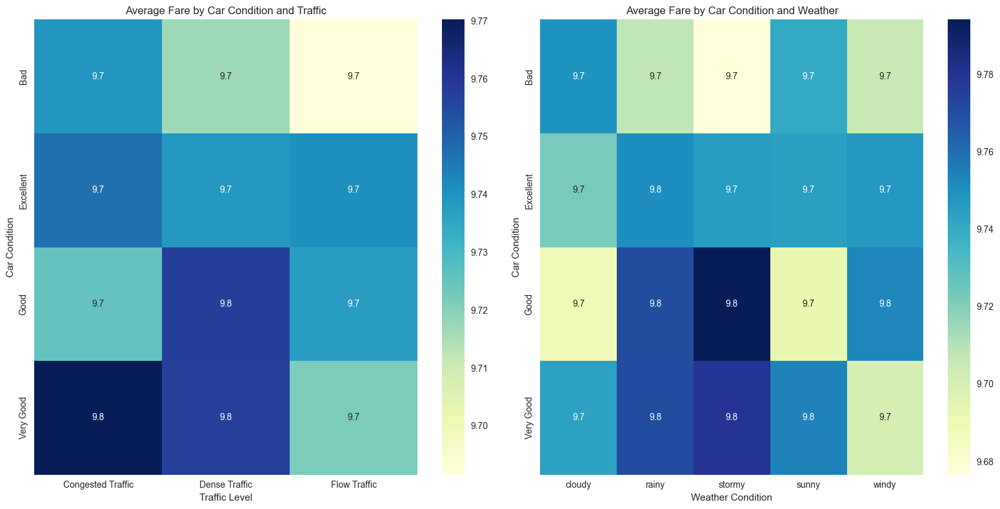

In [65]:
# Set the style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

# 5. Weather and traffic impact
plt.figure(figsize=(16, 12))

# Bar plots showing average fare across different weather conditions
plt.subplot(2, 2, 1)
# Create a single weather column from one-hot encoded columns
weather_columns = ['weather_cloudy', 'weather_rainy', 'weather_stormy', 'weather_sunny', 'weather_windy']
weather_mapping = {col: col.replace('weather_', '') for col in weather_columns}

# Create a function to get the weather type
def get_weather_type(row):
    for col in weather_columns:
        if row[col] == 1:
            return weather_mapping[col]
    return 'unknown'

# Apply the function to create a new column
df_encoded['weather_type'] = df_encoded.apply(get_weather_type, axis=1)

# Now plot the average fare by weather type
weather_fare = df_encoded.groupby('weather_type')['fare'].mean().reset_index()
sns.barplot(x='weather_type', y='fare', data=weather_fare)
plt.title('Average Fare by Weather Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Average Fare')
plt.xticks(rotation=45)

# Box plots of fare distribution by traffic levels
plt.subplot(2, 2, 2)
sns.boxplot(x='traffic', y='fare', data=df_encoded)
plt.title('Fare Distribution by Traffic Level')
plt.xlabel('Traffic Level')
plt.ylabel('Fare')

# Heatmap of traffic vs. weather conditions
plt.subplot(2, 2, 3)
traffic_weather = pd.crosstab(df_encoded['traffic'], df_encoded['weather_type'], normalize='index')
sns.heatmap(traffic_weather, annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Relationship Between Traffic and Weather')
plt.xlabel('Weather Condition')
plt.ylabel('Traffic Level')

# Average fare by traffic and time of day
plt.subplot(2, 2, 4)
traffic_time = df_encoded.pivot_table(values='fare', index='traffic', columns='time_of_day', aggfunc='mean')
sns.heatmap(traffic_time, annot=True, cmap='YlGnBu', fmt='.1f')
plt.title('Average Fare by Traffic and Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Traffic Level')

plt.tight_layout()
plt.show()

# 6. Car condition impact
plt.figure(figsize=(16, 8))

# Bar chart of average fare by car_condition
plt.subplot(1, 2, 1)
car_fare = df_encoded.groupby('car_condition')['fare'].mean().reset_index()
sns.barplot(x='car_condition', y='fare', data=car_fare)
plt.title('Average Fare by Car Condition')
plt.xlabel('Car Condition')
plt.ylabel('Average Fare')

# Violin plots of fare distribution by car_condition
plt.subplot(1, 2, 2)
sns.violinplot(x='car_condition', y='fare', data=df_encoded)
plt.title('Fare Distribution by Car Condition')
plt.xlabel('Car Condition')
plt.ylabel('Fare')

plt.tight_layout()
plt.show()

# Additional factor analysis
plt.figure(figsize=(16, 8))

# Car condition vs. traffic impact on fare
plt.subplot(1, 2, 1)
car_traffic_fare = df_encoded.pivot_table(values='fare', index='car_condition', columns='traffic', aggfunc='mean')
sns.heatmap(car_traffic_fare, annot=True, cmap='YlGnBu', fmt='.1f')
plt.title('Average Fare by Car Condition and Traffic')
plt.xlabel('Traffic Level')
plt.ylabel('Car Condition')

# Car condition vs. weather impact on fare
plt.subplot(1, 2, 2)
car_weather_fare = df_encoded.pivot_table(values='fare', index='car_condition', columns='weather_type', aggfunc='mean')
sns.heatmap(car_weather_fare, annot=True, cmap='YlGnBu', fmt='.1f')
plt.title('Average Fare by Car Condition and Weather')
plt.xlabel('Weather Condition')
plt.ylabel('Car Condition')

plt.tight_layout()
plt.show()

#### 4. Multi-factor Analysis

c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\seaborn\axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\seaborn\axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\seaborn\axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=vector, **plot_kwargs)
c:\InstallationSources\Programs\Miniconda\envs\ML_env\Lib\site-packages\seaborn\axisgrid.py:1513: FutureWarning: 

`shade` is now deprecated i

<Figure size 1600x1400 with 0 Axes>

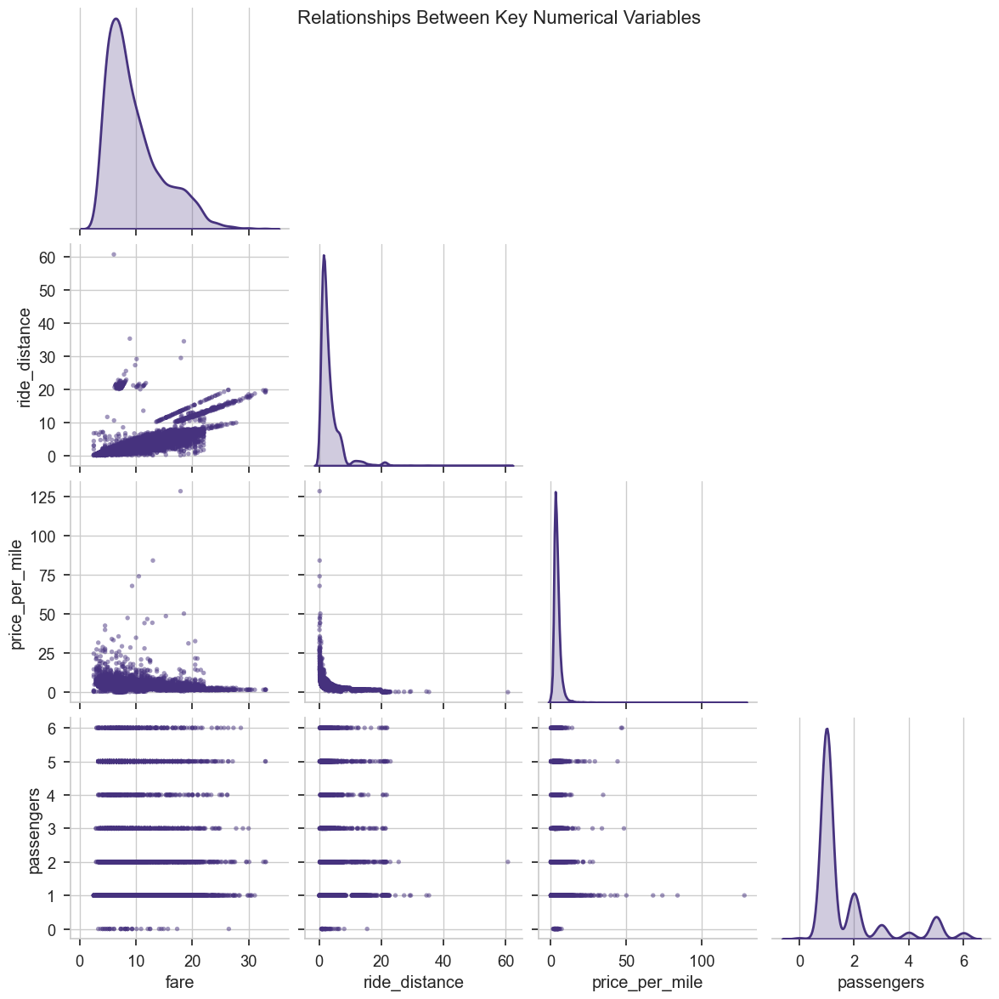

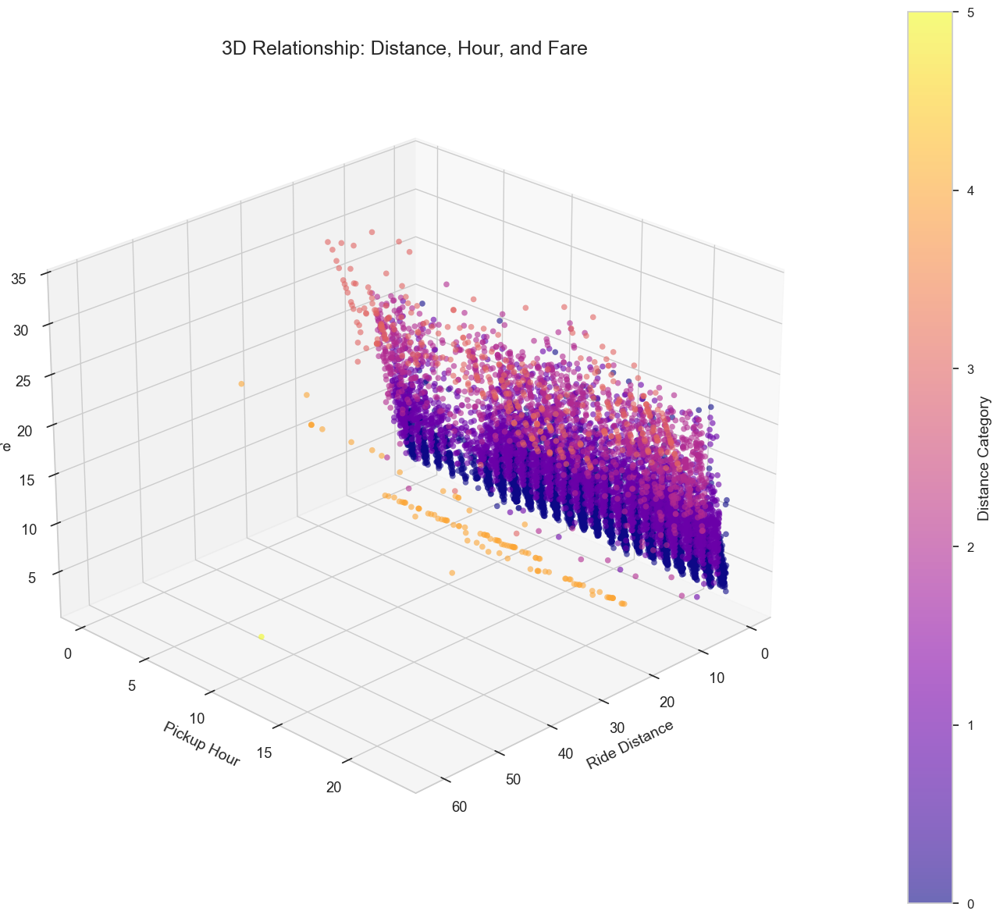

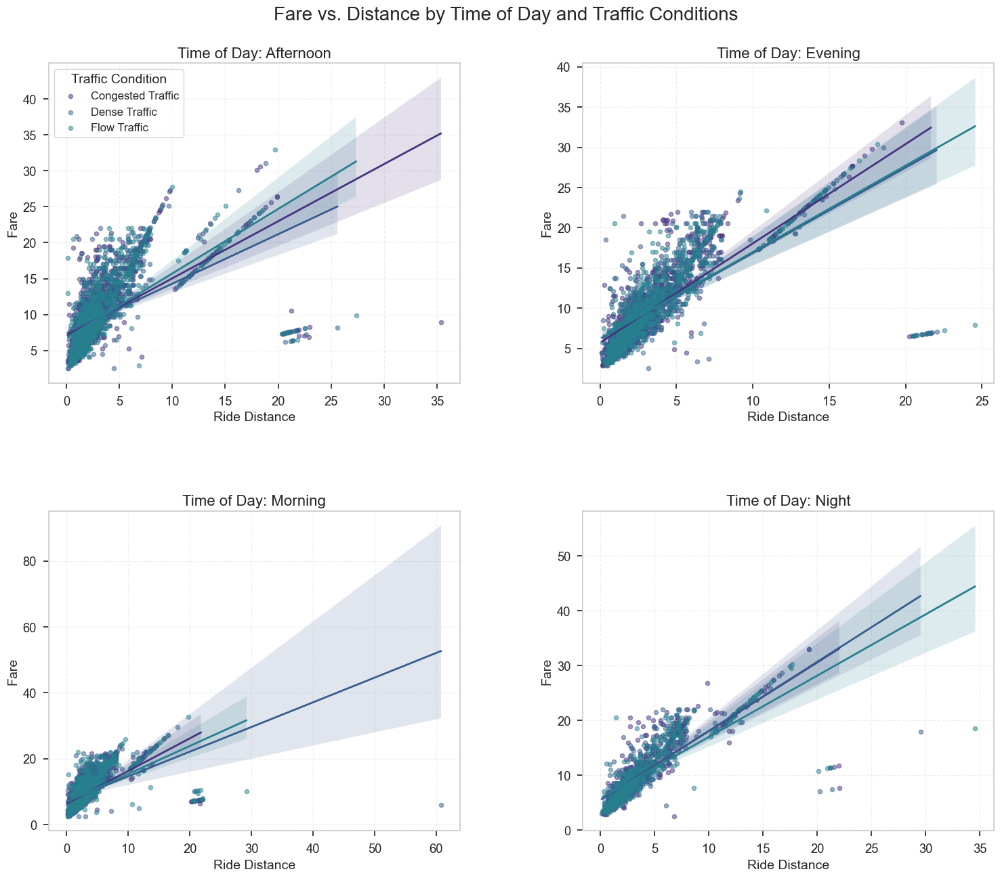

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1042238636.py:137: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  time_weekend_fare = df_encoded.pivot_table(
C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1042238636.py:172: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\1042238636.py:201: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  direction_distance = df_encoded.groupby('direction')['ride_distance'].mean().reset_index

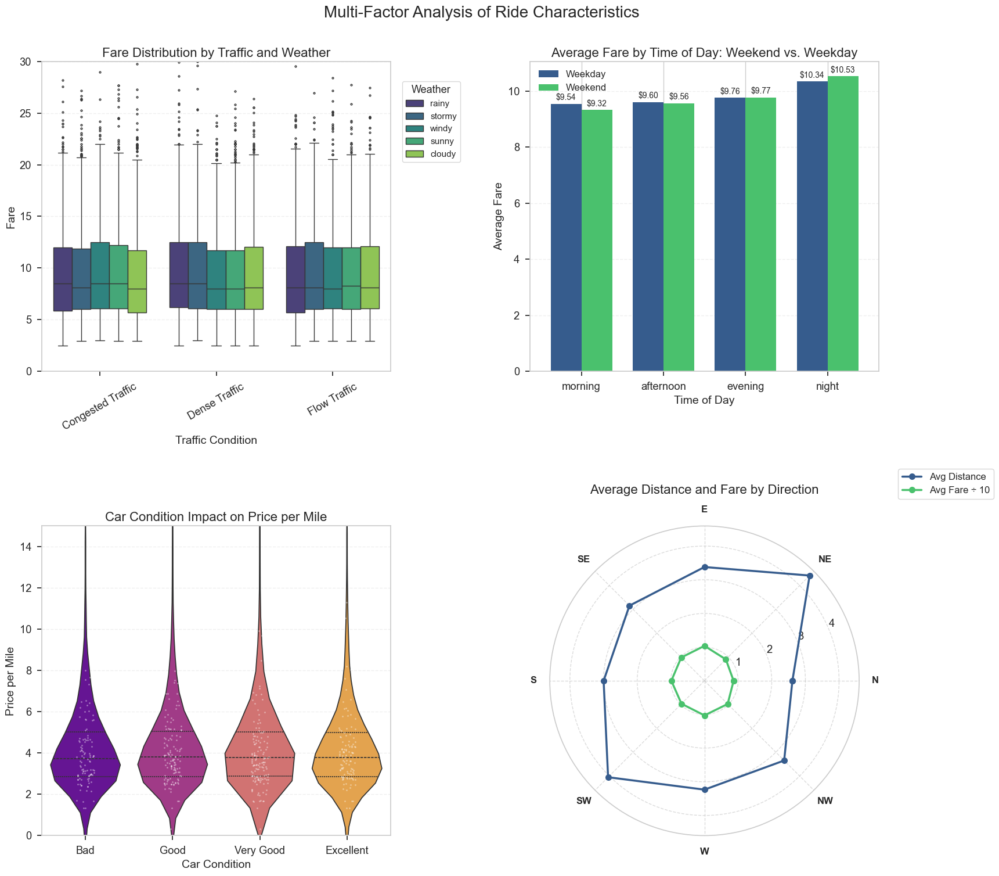

In [66]:
# Set consistent aesthetics
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.2)
colors = sns.color_palette("viridis", 6)
plt.rcParams['figure.figsize'] = [12, 8]

# Create a smaller sample for scatter plots to avoid overplotting
sample_df = df_encoded.sample(min(10000, len(df_encoded)), random_state=42)

# ---------- SECTION 1: KEY VARIABLE RELATIONSHIPS ----------
plt.figure(figsize=(16, 14))  # Create new figure
pair_plot = sns.pairplot(
    sample_df[['fare', 'ride_distance', 'price_per_mile', 'passengers']], 
    height=3,
    diag_kind='kde',
    corner=True,
    plot_kws={'alpha': 0.5, 's': 15, 'edgecolor': 'none'},
    diag_kws={'linewidth': 2, 'shade': True}
)
pair_plot.fig.suptitle('Relationships Between Key Numerical Variables', fontsize=16, y=0.98)
plt.show()  # Explicitly show this plot before moving to next

# ---------- SECTION 2: 3D ANALYSIS ----------
fig = plt.figure(figsize=(14, 12))  # Clear previous figure
ax = fig.add_subplot(111, projection='3d')

# Use distance binning to color points meaningfully
scatter = ax.scatter(
    sample_df['ride_distance'],
    sample_df['pickup_hour'],
    sample_df['fare'],
    c=sample_df['distance_bin_encoded'],
    cmap='plasma',
    s=30,
    alpha=0.6,
    edgecolor='none'
)

# Set better viewing angle
ax.view_init(elev=25, azim=45)
ax.set_xlabel('Ride Distance', fontsize=14, labelpad=10)
ax.set_ylabel('Pickup Hour', fontsize=14, labelpad=10)
ax.set_zlabel('Fare', fontsize=14, labelpad=10)
ax.set_title('3D Relationship: Distance, Hour, and Fare', fontsize=18)
ax.grid(True, linestyle='--', alpha=0.6)

# Add colorbar with meaningful labels
cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Distance Category', fontsize=14)
cbar.ax.tick_params(labelsize=12)

plt.tight_layout()
plt.show()  # Explicitly show this plot

# ---------- SECTION 3: FACETED ANALYSIS BY TIME & TRAFFIC ----------
fig = plt.figure(figsize=(18, 14))  # New figure
gs = GridSpec(2, 2, figure=fig, wspace=0.3, hspace=0.4)  # Add spacing between subplots

# Loop through time of day categories
time_categories = sorted(df_encoded['time_of_day'].unique())
traffic_categories = sorted(df_encoded['traffic'].unique())

for i, time_cat in enumerate(time_categories):
    ax = fig.add_subplot(gs[i//2, i%2])
    
    # Filter data for this time of day
    time_data = sample_df[sample_df['time_of_day'] == time_cat]
    
    # Plot each traffic category with different colors
    for j, traffic in enumerate(traffic_categories):
        traffic_data = time_data[time_data['traffic'] == traffic]
        
        # Plot scatter with transparency
        ax.scatter(
            traffic_data['ride_distance'], 
            traffic_data['fare'],
            alpha=0.5, 
            s=20,
            label=traffic,
            color=colors[j]
        )
        
        # Add regression line for each traffic category
        sns.regplot(
            x='ride_distance', 
            y='fare', 
            data=traffic_data,
            scatter=False,
            color=colors[j],
            ax=ax,
            line_kws={'linewidth': 2}
        )
    
    ax.set_title(f'Time of Day: {time_cat.capitalize()}', fontsize=16)
    ax.set_xlabel('Ride Distance', fontsize=14)
    ax.set_ylabel('Fare', fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.3)
    
    # Only show legend on the first plot
    if i == 0:
        ax.legend(title='Traffic Condition', title_fontsize=14, fontsize=12, 
                 loc='upper left', frameon=True)

fig.suptitle('Fare vs. Distance by Time of Day and Traffic Conditions', fontsize=20, y=0.98)
plt.subplots_adjust(top=0.92)  # Adjust top spacing for suptitle
plt.show()  # Show this section

# ---------- SECTION 4: ADVANCED MULTI-FACTOR ANALYSIS ----------
fig = plt.figure(figsize=(18, 16))  # Increased height for better spacing
# We'll set up the subplots with more room for margins

# 1. Traffic and Weather Interaction on Fares
ax1 = plt.subplot(2, 2, 1)
sns.boxplot(
    x='traffic', 
    y='fare', 
    hue='weather',
    data=sample_df,
    palette='viridis',
    fliersize=2  # Make outlier points smaller
)
plt.title('Fare Distribution by Traffic and Weather', fontsize=16)
plt.xlabel('Traffic Condition', fontsize=14)
plt.ylabel('Fare', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.3)
# Improve legend positioning and style
plt.legend(title='Weather', fontsize=11, title_fontsize=13, 
           bbox_to_anchor=(1.02, 0.95), loc='upper left', frameon=True,
           framealpha=0.9, edgecolor='lightgray')
plt.xticks(rotation=30)
# Set reasonable y limit to focus on the main distribution
ylim = plt.ylim()
plt.ylim(0, min(ylim[1], 30))  # Cap at 30 or the current max

# 2. Enhanced weekend/time of day analysis
ax2 = plt.subplot(2, 2, 2)
time_weekend_fare = df_encoded.pivot_table(
    values='fare', 
    index='time_of_day', 
    columns='is_weekend', 
    aggfunc='mean'
)
time_weekend_fare.columns = ['Weekday', 'Weekend']

# Reorder categories for time of day
time_order = ['morning', 'afternoon', 'evening', 'night']
time_weekend_fare = time_weekend_fare.reindex(time_order)

# Plot with enhanced styling
ax = time_weekend_fare.plot(
    kind='bar',
    width=0.75,
    color=[colors[1], colors[4]],  # Different colors for better contrast
    rot=0,
    ax=ax2
)
plt.title('Average Fare by Time of Day: Weekend vs. Weekday', fontsize=16)
plt.xlabel('Time of Day', fontsize=14)
plt.ylabel('Average Fare', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.legend(fontsize=12, loc='best', framealpha=0.9, edgecolor='lightgray')

# Add value labels on bars with enhanced formatting
try:
    for container in ax.containers:
        ax.bar_label(container, fmt='${:.2f}', fontsize=10, padding=3)
except Exception:
    pass  # Skip labeling if there's an issue

# 3. Car condition impact on price per mile
ax3 = plt.subplot(2, 2, 3)
sns.violinplot(
    x='car_condition', 
    y='price_per_mile',
    data=sample_df,
    palette='plasma',
    inner='quartile',
    order=['Bad', 'Good', 'Very Good', 'Excellent']
)
# Add individual points for more detailed view
sns.stripplot(
    x='car_condition', 
    y='price_per_mile',
    data=sample_df.sample(min(500, len(sample_df))),  # Sample to avoid overcrowding
    order=['Bad', 'Good', 'Very Good', 'Excellent'],
    color='white',
    alpha=0.4,
    size=2,
    jitter=True
)
plt.title('Car Condition Impact on Price per Mile', fontsize=16)
plt.xlabel('Car Condition', fontsize=14)
plt.ylabel('Price per Mile', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.3)
# Set reasonable y limit to focus on the main distribution
ylim = plt.ylim()
plt.ylim(0, min(ylim[1], 15))  # Cap at 15 or the current max

# 4. Direction and distance relationship
ax4 = plt.subplot(2, 2, 4, projection='polar')
direction_distance = df_encoded.groupby('direction')['ride_distance'].mean().reset_index()
direction_fare = df_encoded.groupby('direction')['fare'].mean().reset_index()

# Combine into one dataframe
direction_data = pd.merge(direction_distance, direction_fare, on='direction')

# Convert direction to angle for radar chart - with error handling
direction_to_angle = {'N': 0, 'NE': 45, 'E': 90, 'SE': 135, 'S': 180, 'SW': 225, 'W': 270, 'NW': 315}
try:
    direction_data['angle'] = direction_data['direction'].astype(str).map(direction_to_angle).astype(float) * (np.pi/180)
except Exception:
    # If mapping fails, handle the error
    print("Warning: Issue with direction mapping. Check your direction values.")
    # Create a default angle column based on position if mapping fails
    direction_data['angle'] = np.linspace(0, 2*np.pi, len(direction_data), endpoint=False)

# Sort by angle for proper plotting
direction_data = direction_data.sort_values('angle')

# Ensure the plot is circular by repeating the first point at the end
first_row = direction_data.iloc[0].copy()
direction_data = pd.concat([direction_data, pd.DataFrame([first_row])], ignore_index=True)

# Plot using polar projection with enhanced styling
ax4.plot(
    direction_data['angle'], 
    direction_data['ride_distance'], 
    'o-', 
    linewidth=2.5, 
    label='Avg Distance',
    color=colors[1],
    markersize=8
)
ax4.plot(
    direction_data['angle'], 
    direction_data['fare']/10,  # Scale down for visibility
    'o-', 
    linewidth=2.5, 
    label='Avg Fare ÷ 10',
    color=colors[4],
    markersize=8
)

# Set direction labels with improved formatting
try:
    ax4.set_xticks(np.array(list(direction_to_angle.values())) * (np.pi/180))
    ax4.set_xticklabels(direction_to_angle.keys(), fontsize=12, fontweight='bold')
    # Add radial grid lines for better readability
    ax4.grid(True, linestyle='--', alpha=0.7)
except Exception:
    # Fallback to automatic ticks if the above fails
    pass

ax4.set_title('Average Distance and Fare by Direction', fontsize=16, pad=40)  # Added padding for title
# Move legend to a better position with margins
ax4.legend(loc='upper right', bbox_to_anchor=(1.45, 1.2), frameon=True, framealpha=0.8, fontsize=12)

# Final adjustments for the entire figure
fig.suptitle('Multi-Factor Analysis of Ride Characteristics', fontsize=20, y=0.98)
plt.tight_layout(pad=4.0)  # Increased padding around subplots
plt.subplots_adjust(top=0.92, right=0.88, wspace=0.40, hspace=0.50)  # Added right margin and increased spacing
plt.show()  # Show final section


#### 5. Passengers and Time-specific Patterns

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\2359569272.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='passengers', y='fare', data=df_encoded, palette='viridis', ax=axes1[0])


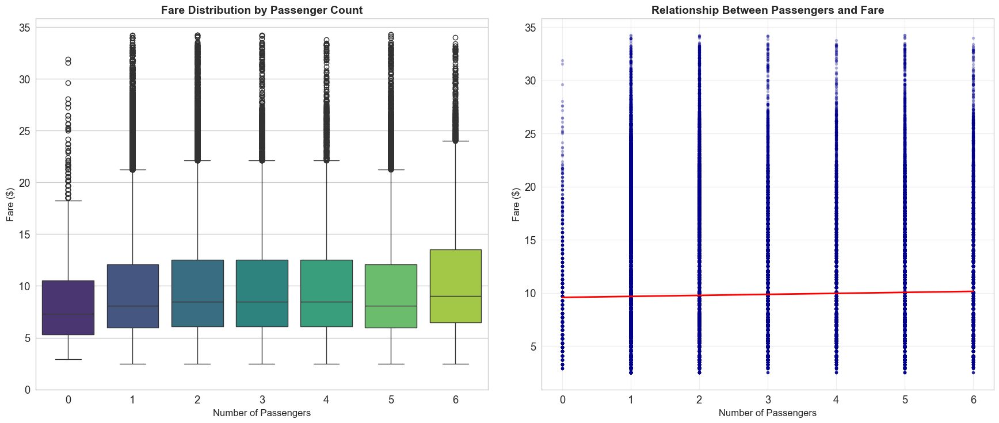

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\2359569272.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='is_rush_hour', y='fare', data=rush_fare, palette='viridis', ax=axes2[0, 0])


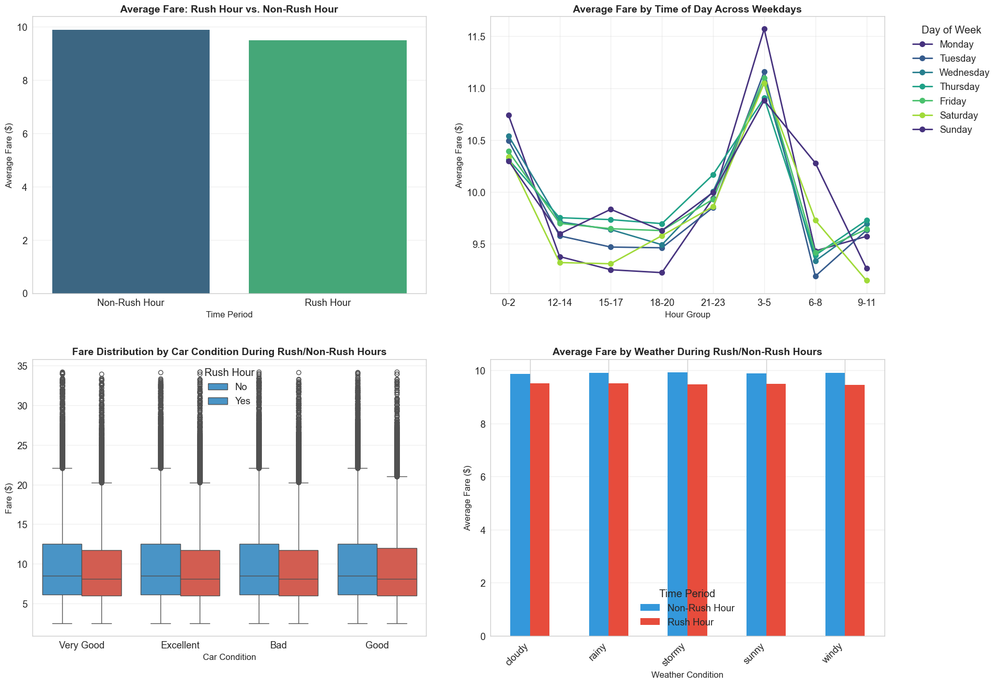

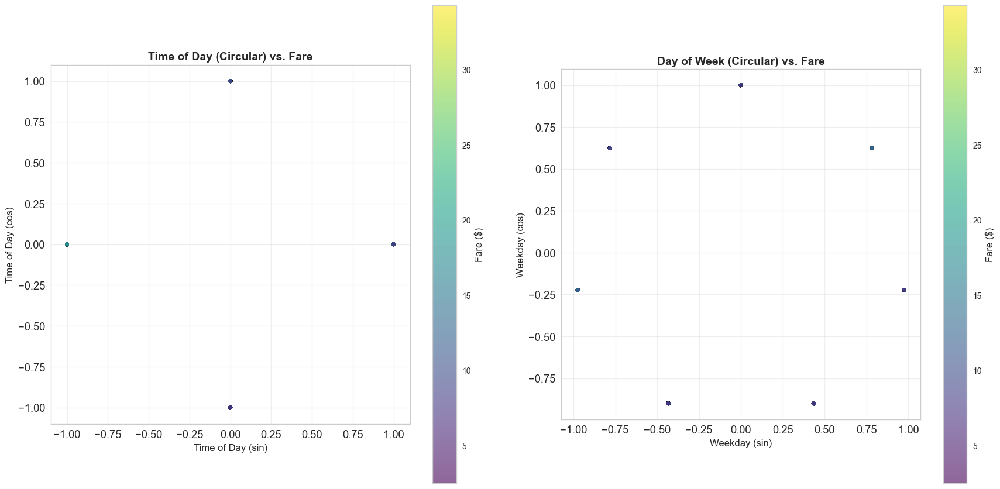

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\2359569272.py:161: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  time_direction = df_encoded.pivot_table(
C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\2359569272.py:174: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  time_distance = df_encoded.pivot_table(


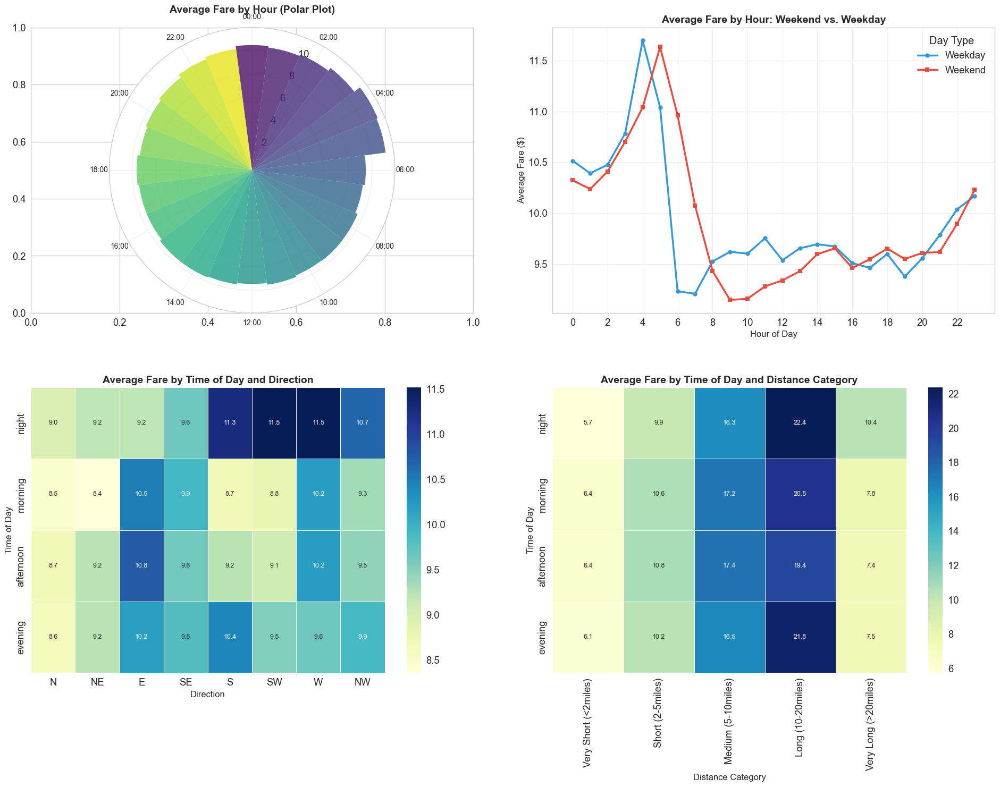

In [67]:
# Set the style with improved aesthetics
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")
plt.rcParams['font.size'] = 10
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['figure.autolayout'] = True  # Enable automatic layout adjustment

# 8. Passenger impact - IMPROVED
fig1, axes1 = plt.subplots(1, 2, figsize=(18, 8))

# Box plots of fare by passenger count with improved colors
sns.boxplot(x='passengers', y='fare', data=df_encoded, palette='viridis', ax=axes1[0])
axes1[0].set_title('Fare Distribution by Passenger Count', fontweight='bold')
axes1[0].set_xlabel('Number of Passengers')
axes1[0].set_ylabel('Fare ($)')
axes1[0].set_ylim(bottom=0)  # Start y-axis from 0 for better perspective

# Scatter plot of passengers vs. fare with enhanced trend line
sns.regplot(x='passengers', y='fare', data=df_encoded, 
           scatter_kws={'alpha':0.3, 's':15, 'color':'darkblue'}, 
           line_kws={'color':'red', 'linewidth':2},
           ax=axes1[1])
axes1[1].set_title('Relationship Between Passengers and Fare', fontweight='bold')
axes1[1].set_xlabel('Number of Passengers')
axes1[1].set_ylabel('Fare ($)')
axes1[1].grid(True, alpha=0.3)

fig1.tight_layout(pad=3.0)  # Increased padding
plt.savefig('passengers_fare_analysis.png', dpi=300, bbox_inches='tight')  # Save with tight borders
plt.show(fig1)  # show figure to free memory

# 9. Rush hour analysis with improved layout - IMPROVED
fig2, axes2 = plt.subplots(2, 2, figsize=(20, 14))  # Increased figure size

# Bar plots comparing rush hour vs. non-rush hour fares
rush_fare = df_encoded.groupby('is_rush_hour')['fare'].mean().reset_index()
rush_fare['is_rush_hour'] = rush_fare['is_rush_hour'].map({0: 'Non-Rush Hour', 1: 'Rush Hour'})
sns.barplot(x='is_rush_hour', y='fare', data=rush_fare, palette='viridis', ax=axes2[0, 0])
axes2[0, 0].set_title('Average Fare: Rush Hour vs. Non-Rush Hour', fontweight='bold')
axes2[0, 0].set_xlabel('Time Period')
axes2[0, 0].set_ylabel('Average Fare ($)')
axes2[0, 0].grid(True, axis='y', alpha=0.3)

# Line plot showing fare variation during rush hours across different weekdays
# Create an hour group for better visualization (group by 3-hour intervals)
df_encoded['hour_group'] = (df_encoded['request_hour'] // 3) * 3
df_encoded['hour_group'] = df_encoded['hour_group'].astype(str) + '-' + (df_encoded['hour_group'] + 2).astype(str)

rush_weekday_fare = df_encoded.pivot_table(
    values='fare', 
    index='hour_group',
    columns='request_weekday', 
    aggfunc='mean'
)

rush_weekday_fare.columns = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
rush_weekday_fare.plot(marker='o', linewidth=2, markersize=8, ax=axes2[0, 1])
axes2[0, 1].set_title('Average Fare by Time of Day Across Weekdays', fontweight='bold')
axes2[0, 1].set_xlabel('Hour Group')
axes2[0, 1].set_ylabel('Average Fare ($)')
axes2[0, 1].legend(title='Day of Week', bbox_to_anchor=(1.05, 1), loc='upper left')
axes2[0, 1].grid(True, alpha=0.3)

# Box plots of fare distribution with better color differentiation
sns.boxplot(x='car_condition', y='fare', hue='is_rush_hour', 
           data=df_encoded, palette=['#3498db', '#e74c3c'], ax=axes2[1, 0])
axes2[1, 0].set_title('Fare Distribution by Car Condition During Rush/Non-Rush Hours', fontweight='bold')
axes2[1, 0].set_xlabel('Car Condition')
axes2[1, 0].set_ylabel('Fare ($)')
axes2[1, 0].legend(title='Rush Hour', labels=['No', 'Yes'])
axes2[1, 0].grid(True, axis='y', alpha=0.3)

# Average fare by rush hour and weather with enhanced bar chart
rush_weather_fare = df_encoded.pivot_table(
    values='fare', 
    index='weather_type',
    columns='is_rush_hour', 
    aggfunc='mean'
)
rush_weather_fare.columns = ['Non-Rush Hour', 'Rush Hour']
rush_weather_fare.plot(kind='bar', color=['#3498db', '#e74c3c'], ax=axes2[1, 1])
axes2[1, 1].set_title('Average Fare by Weather During Rush/Non-Rush Hours', fontweight='bold')
axes2[1, 1].set_xlabel('Weather Condition')
axes2[1, 1].set_ylabel('Average Fare ($)')
axes2[1, 1].legend(title='Time Period')
axes2[1, 1].set_xticklabels(axes2[1, 1].get_xticklabels(), rotation=45, ha='right')
axes2[1, 1].grid(True, axis='y', alpha=0.3)

fig2.tight_layout(pad=4.0)  # Increased padding further
plt.savefig('rush_hour_analysis.png', dpi=300, bbox_inches='tight')
plt.show(fig2)

# 10. Circular time features - IMPROVED
fig3, axes3 = plt.subplots(1, 2, figsize=(18, 9))

# Scatter plots of time_of_day_sin vs. time_of_day_cos with improved color mapping
scatter1 = axes3[0].scatter(df_encoded['time_of_day_sin'], df_encoded['time_of_day_cos'], 
                     c=df_encoded['fare'], cmap='viridis', alpha=0.6, s=25, edgecolor='none')
cbar1 = fig3.colorbar(scatter1, ax=axes3[0], label='Fare ($)')
cbar1.ax.tick_params(labelsize=10)
axes3[0].set_title('Time of Day (Circular) vs. Fare', fontweight='bold')
axes3[0].set_xlabel('Time of Day (sin)')
axes3[0].set_ylabel('Time of Day (cos)')
axes3[0].set_aspect('equal')
axes3[0].grid(True, alpha=0.3)

# Similar plot for weekday_sin vs. weekday_cos
scatter2 = axes3[1].scatter(df_encoded['weekday_sin'], df_encoded['weekday_cos'], 
                     c=df_encoded['fare'], cmap='viridis', alpha=0.6, s=25, edgecolor='none')
cbar2 = fig3.colorbar(scatter2, ax=axes3[1], label='Fare ($)')
cbar2.ax.tick_params(labelsize=10)
axes3[1].set_title('Day of Week (Circular) vs. Fare', fontweight='bold')
axes3[1].set_xlabel('Weekday (sin)')
axes3[1].set_ylabel('Weekday (cos)')
axes3[1].set_aspect('equal')
axes3[1].grid(True, alpha=0.3)

fig3.tight_layout(pad=3.0)
plt.savefig('circular_time_features.png', dpi=300, bbox_inches='tight')
plt.show(fig3)

# Additional circular time analysis - IMPROVED
fig4, axes4 = plt.subplots(2, 2, figsize=(20, 16))  # Further increased figure size

# Create polar plots for time of day analysis with better readability
hours = np.linspace(0, 24, 25)
angles = np.linspace(0, 2*np.pi, 25)
width = 2*np.pi / 24

hour_fare = df_encoded.groupby('request_hour')['fare'].mean().reset_index()

polar_ax = fig4.add_subplot(2, 2, 1, polar=True)
bars = polar_ax.bar(angles[:-1], hour_fare['fare'], width=width, bottom=0.0, 
              alpha=0.8, color=sns.color_palette("viridis", 24))
polar_ax.set_theta_zero_location("N")  # Start at top (midnight)
polar_ax.set_theta_direction(-1)  # Go clockwise
polar_ax.set_xticks(np.linspace(0, 2*np.pi, 12, endpoint=False))
polar_ax.set_xticklabels([f"{h:02d}:00" for h in range(0, 24, 2)], fontsize=10)
polar_ax.set_title('Average Fare by Hour (Polar Plot)', fontweight='bold', pad=20)
polar_ax.grid(True, alpha=0.3)

# Hour vs. fare by is_weekend with improved line styling
weekend_hour_fare = df_encoded.pivot_table(
    values='fare', 
    index='request_hour',
    columns='is_weekend', 
    aggfunc='mean'
)
weekend_hour_fare.columns = ['Weekday', 'Weekend']
weekend_hour_fare.plot(linewidth=2.5, style=['-o', '-s'], 
                      color=['#3498db', '#e74c3c'], markersize=6, ax=axes4[0, 1])
axes4[0, 1].set_title('Average Fare by Hour: Weekend vs. Weekday', fontweight='bold')
axes4[0, 1].set_xlabel('Hour of Day')
axes4[0, 1].set_ylabel('Average Fare ($)')
axes4[0, 1].set_xticks(range(0, 24, 2))
axes4[0, 1].grid(True, alpha=0.3)
axes4[0, 1].legend(title='Day Type')

# Enhanced heatmaps with better color scales
time_direction = df_encoded.pivot_table(
    values='fare', 
    index='time_of_day',
    columns='direction', 
    aggfunc='mean'
)
sns.heatmap(time_direction, annot=True, cmap='YlGnBu', fmt='.1f',
           linewidths=0.5, annot_kws={"size": 9}, ax=axes4[1, 0])
axes4[1, 0].set_title('Average Fare by Time of Day and Direction', fontweight='bold')
axes4[1, 0].set_xlabel('Direction')
axes4[1, 0].set_ylabel('Time of Day')

# Time of day pattern by distance category with improved heatmap
time_distance = df_encoded.pivot_table(
    values='fare', 
    index='time_of_day',
    columns='distance_category', 
    aggfunc='mean'
)
sns.heatmap(time_distance, annot=True, cmap='YlGnBu', fmt='.1f',
           linewidths=0.5, annot_kws={"size": 9}, ax=axes4[1, 1])
axes4[1, 1].set_title('Average Fare by Time of Day and Distance Category', fontweight='bold')
axes4[1, 1].set_xlabel('Distance Category')
axes4[1, 1].set_ylabel('Time of Day')

fig4.tight_layout(pad=5.0)  # Substantially increased padding
plt.savefig('circular_time_analysis.png', dpi=300, bbox_inches='tight')
plt.show(fig4)



#### 6. Extra Visualizations

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\317241568.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=weekday_counts.index, y=weekday_counts.values, palette='viridis', ax=axes[1])


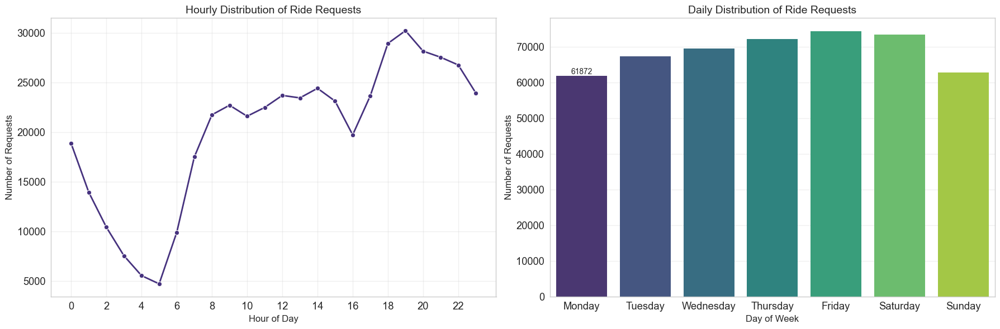

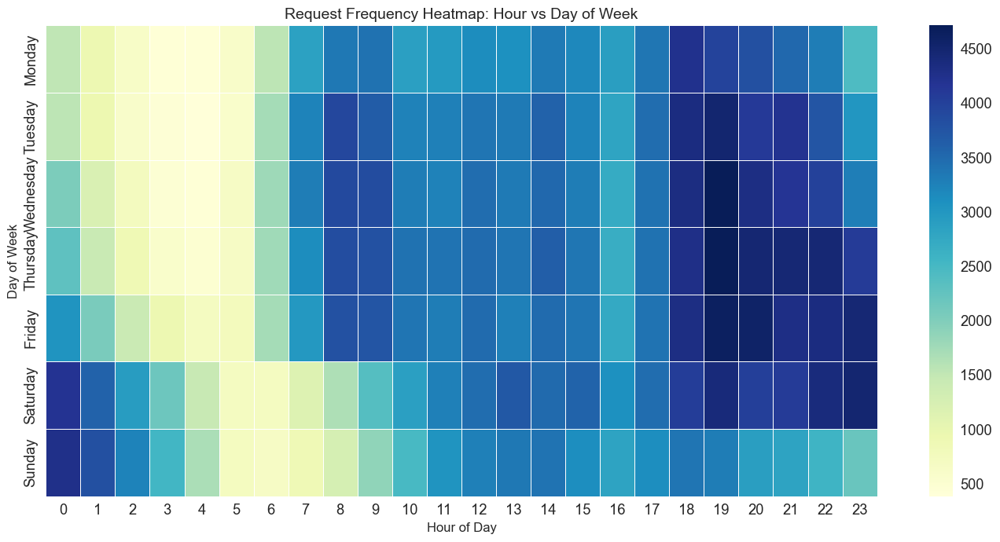

C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\317241568.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='distance_category', y='ride_distance', data=df_encoded, palette='viridis', ax=axes[0])
C:\Users\OmarMamon\AppData\Local\Temp\ipykernel_19984\317241568.py:63: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=bin_counts.index, y=bin_counts.values, palette='viridis', ax=axes[1])


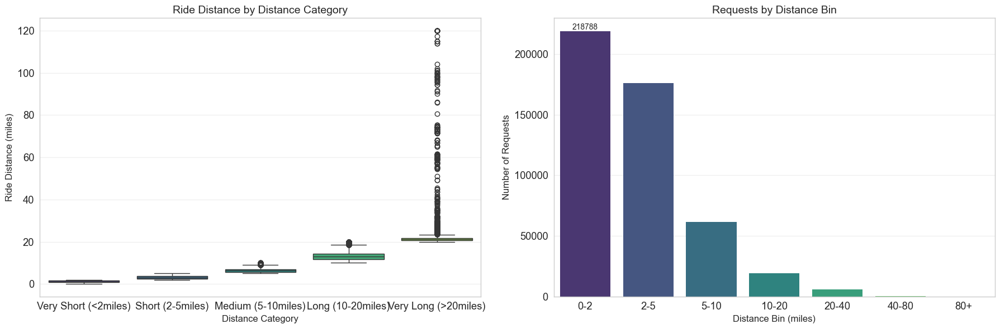

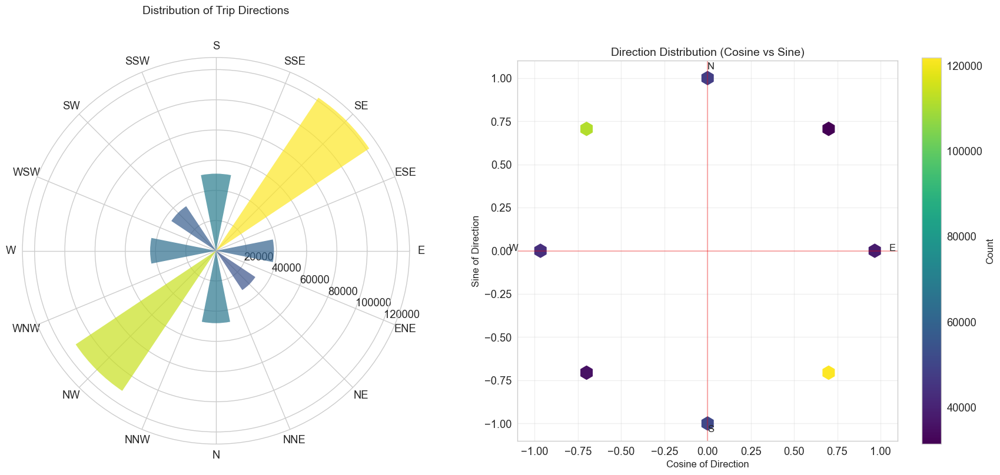

<Figure size 1200x600 with 0 Axes>

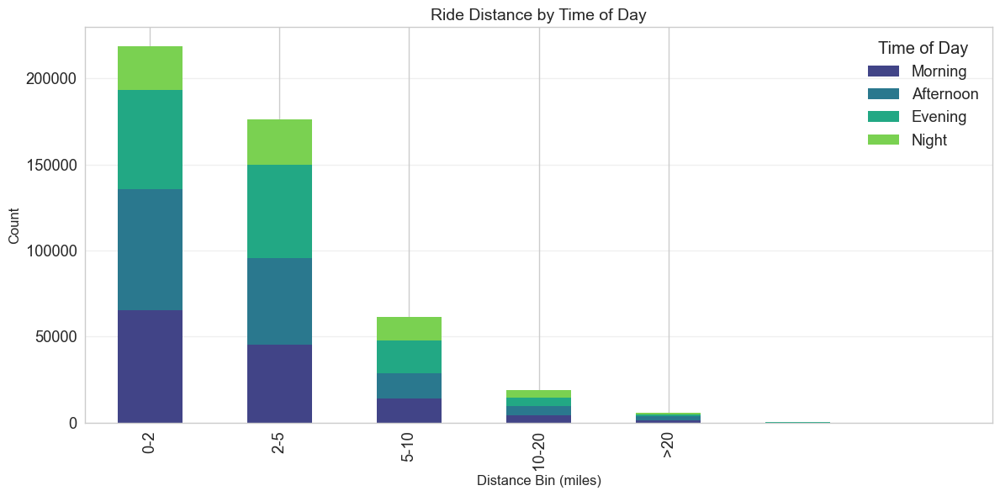

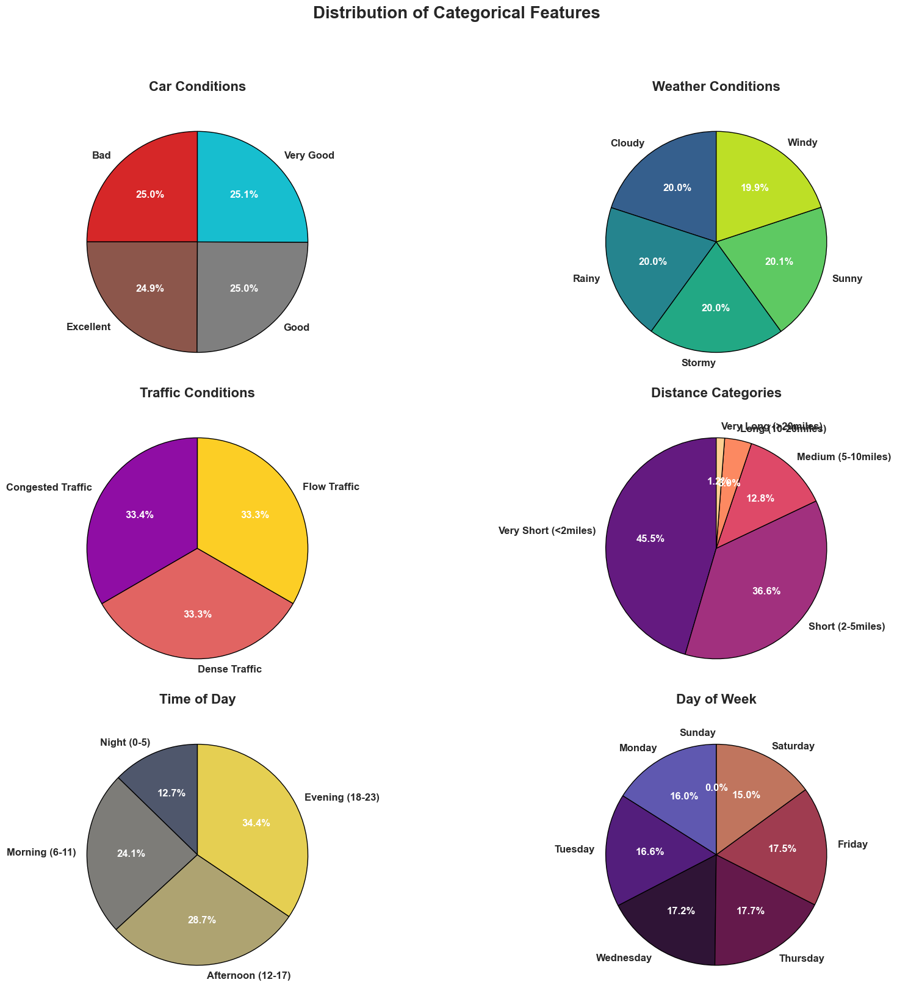

In [68]:
# Time-Based Analysis
def time_based_visualizations(df_encoded):

    plt.style.use('seaborn-v0_8-whitegrid')  # Use a more modern style
    
    # Create a figure with 2 subplots for time-based analysis
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))
    
    # Line Plot: Requests across request_hour
    hourly_counts = df_encoded.groupby('request_hour').size()
    sns.lineplot(x=hourly_counts.index, y=hourly_counts.values, marker='o', linewidth=2, ax=axes[0])
    axes[0].set_title('Hourly Distribution of Ride Requests', fontsize=14)
    axes[0].set_xlabel('Hour of Day', fontsize=12)
    axes[0].set_ylabel('Number of Requests', fontsize=12)
    axes[0].set_xticks(np.arange(0, 24, 2))
    axes[0].grid(True, alpha=0.3)
    
    # Bar Plot: Requests by request_weekday with weekday names
    weekday_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    weekday_counts = df_encoded.groupby('request_weekday').size()
    ax = sns.barplot(x=weekday_counts.index, y=weekday_counts.values, palette='viridis', ax=axes[1])
    axes[1].set_title('Daily Distribution of Ride Requests', fontsize=14)
    axes[1].set_xlabel('Day of Week', fontsize=12)
    axes[1].set_ylabel('Number of Requests', fontsize=12)
    axes[1].set_xticks(np.arange(0, 7))
    axes[1].set_xticklabels(weekday_names)
    ax.bar_label(ax.containers[0], fmt='%d')
    axes[1].grid(True, axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()

    # Heatmap in a separate figure
    pivot_table = df_encoded.pivot_table(index='request_weekday', columns='request_hour', aggfunc='size', fill_value=0)
    plt.figure(figsize=(14, 7))
    ax = sns.heatmap(pivot_table, cmap='YlGnBu', linewidths=0.5, annot=False)
    plt.title('Request Frequency Heatmap: Hour vs Day of Week', fontsize=14)
    plt.xlabel('Hour of Day', fontsize=12)
    plt.ylabel('Day of Week', fontsize=12)
    ax.set_yticklabels(weekday_names)
    plt.tight_layout()
    plt.show()


# Distance Analysis
def distance_visualizations(df_encoded):
    
    # Set the style
    plt.style.use('seaborn-v0_8-whitegrid')

    # Create a figure with 2 subplots for distance analysis
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))
    
    # Boxplot: Ride Distance across Distance Category
    ax = sns.boxplot(x='distance_category', y='ride_distance', data=df_encoded, palette='viridis', ax=axes[0])
    axes[0].set_title('Ride Distance by Distance Category', fontsize=14)
    axes[0].set_xlabel('Distance Category', fontsize=12)
    axes[0].set_ylabel('Ride Distance (miles)', fontsize=12)
    axes[0].grid(True, axis='y', alpha=0.3)
    
    # Bar Plot: Requests across Distance Bin
    bin_counts = df_encoded['distance_bin'].value_counts().sort_index()
    ax = sns.barplot(x=bin_counts.index, y=bin_counts.values, palette='viridis', ax=axes[1])
    axes[1].set_title('Requests by Distance Bin', fontsize=14)
    axes[1].set_xlabel('Distance Bin (miles)', fontsize=12)
    axes[1].set_ylabel('Number of Requests', fontsize=12)
    ax.bar_label(ax.containers[0], fmt='%d')
    axes[1].grid(True, axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()


# Direction Analysis
def direction_visualizations(df_encoded):
    
    plt.style.use('seaborn-v0_8-whitegrid')

    # Create a figure with 2 subplots for direction analysis
    fig = plt.figure(figsize=(18, 8))
    
    # Polar Plot: Direction Angle
    ax1 = plt.subplot(121, polar=True)
    
    # Group directions into bins
    bins = np.linspace(0, 2*np.pi, 17)  # 16 direction bins
    hist, _ = np.histogram(df_encoded['direction_angle'] * np.pi / 180, bins=bins)
    
    # Plot the binned data
    width = (2*np.pi) / 16
    bars = ax1.bar(bins[:-1], hist, width=width, alpha=0.7)
    
    # Add directional labels
    directions = ['E', 'ENE', 'NE', 'NNE', 'N', 'NNW', 'NW', 'WNW', 
                 'W', 'WSW', 'SW', 'SSW', 'S', 'SSE', 'SE', 'ESE']
    ax1.set_theta_zero_location('E')
    ax1.set_theta_direction(-1)  # clockwise
    ax1.set_thetagrids(np.arange(0, 360, 22.5), directions)
    
    for bar, count in zip(bars, hist):
        bar.set_facecolor(plt.cm.viridis(count/max(hist)))
    
    ax1.set_title('Distribution of Trip Directions', fontsize=14, y=1.1)
    
    # Scatter Plot: Cos vs Sin with hexbin for density
    ax2 = plt.subplot(122)
    hb = ax2.hexbin(df_encoded['direction_cos'], df_encoded['direction_sin'], 
                   gridsize=30, cmap='viridis', mincnt=1)
    plt.colorbar(hb, ax=ax2, label='Count')
    ax2.axhline(y=0, color='r', linestyle='-', alpha=0.3)
    ax2.axvline(x=0, color='r', linestyle='-', alpha=0.3)
    
    # Add cardinal direction labels
    ax2.text(1.05, 0, 'E', fontsize=12)
    ax2.text(-1.15, 0, 'W', fontsize=12)
    ax2.text(0, 1.05, 'N', fontsize=12)
    ax2.text(0, -1.05, 'S', fontsize=12)
    
    ax2.set_title('Direction Distribution (Cosine vs Sine)', fontsize=14)
    ax2.set_xlabel('Cosine of Direction', fontsize=12)
    ax2.set_ylabel('Sine of Direction', fontsize=12)
    ax2.grid(True, alpha=0.3)
    ax2.set_aspect('equal')
    
    plt.tight_layout()
    plt.show()


# Categorical Distributions
def categorical_visualizations(df_encoded):

    
    plt.style.use('seaborn-v0_8-whitegrid')

    # Bar Plot: Distance Bin vs Time of Day in a separate figure
    plt.figure(figsize=(12, 6))
    time_mapping = {0: 'Morning', 1: 'Afternoon', 2: 'Evening', 3: 'Night'}
    distance_mapping = {0: '0-2', 1: '2-5', 2: '5-10', 3: '10-20', 4: '>20'}
    
    # Prepare the data
    cross_tab = pd.crosstab(df_encoded['distance_bin_encoded'], 
                            df_encoded['time_of_day_encoded'])
    
    # Plot
    ax = cross_tab.plot(kind='bar', stacked=True, figsize=(12, 6), 
                        color=sns.color_palette('viridis', len(time_mapping)))
    
    plt.title('Ride Distance by Time of Day', fontsize=14)
    plt.xlabel('Distance Bin (miles)', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(range(len(distance_mapping)), [distance_mapping[i] for i in range(len(distance_mapping))])
    plt.legend([time_mapping[i] for i in sorted(time_mapping.keys())], title='Time of Day')
    plt.grid(True, axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

def categorical_pie_charts(df_encoded):

    plt.style.use('seaborn-v0_8-darkgrid')

    fig, axes = plt.subplots(3, 2, figsize=(18, 16))
    axes = axes.flatten()
    color_maps = ['tab20', 'viridis', 'plasma', 'magma', 'cividis', 'twilight']
    titles = [
        'Car Conditions', 'Weather Conditions', 'Traffic Conditions', 
        'Distance Categories', 'Time of Day', 'Day of Week'
    ]

    def make_pie(ax, data, labels, title, cmap):
        colors = plt.get_cmap(cmap)(np.linspace(0.3, 0.9, len(data)))
        wedges, texts, autotexts = ax.pie(
            data, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors, 
            wedgeprops={'edgecolor': 'black', 'linewidth': 1}, textprops={'fontsize': 12, 'weight': 'bold'}
        )
        ax.set_title(title, fontsize=16, fontweight='bold', pad=15)
        for autotext in autotexts:
            autotext.set_fontsize(12)
            autotext.set_weight('bold')
            autotext.set_color('white')

    features = [
        ('car_condition', df_encoded['car_condition'].value_counts().sort_index()),
        ('weather', pd.Series({
            'Cloudy': df_encoded['weather_cloudy'].sum(),
            'Rainy': df_encoded['weather_rainy'].sum(),
            'Stormy': df_encoded['weather_stormy'].sum(),
            'Sunny': df_encoded['weather_sunny'].sum(),
            'Windy': df_encoded['weather_windy'].sum()
        })),
        ('traffic', df_encoded['traffic'].value_counts().sort_index()),
        ('distance_category', df_encoded['distance_category'].value_counts().sort_index()),
        ('time_of_day', pd.Series({
            'Night (0-5)': df_encoded['request_hour'].between(0, 5).sum(),
            'Morning (6-11)': df_encoded['request_hour'].between(6, 11).sum(),
            'Afternoon (12-17)': df_encoded['request_hour'].between(12, 17).sum(),
            'Evening (18-23)': df_encoded['request_hour'].between(18, 23).sum()
        })),
        ('weekday', pd.Series({
            'Monday': (df_encoded['request_weekday'] == 1).sum(),
            'Tuesday': (df_encoded['request_weekday'] == 2).sum(),
            'Wednesday': (df_encoded['request_weekday'] == 3).sum(),
            'Thursday': (df_encoded['request_weekday'] == 4).sum(),
            'Friday': (df_encoded['request_weekday'] == 5).sum(),
            'Saturday': (df_encoded['request_weekday'] == 6).sum(),
            'Sunday': (df_encoded['request_weekday'] == 7).sum()
        }))
    ]

    for i, (name, series) in enumerate(features):
        make_pie(axes[i], series.values, series.index.astype(str), titles[i], color_maps[i])

    plt.tight_layout()
    plt.suptitle('Distribution of Categorical Features', fontsize=20, fontweight='bold', y=1.02)
    plt.subplots_adjust(top=0.92)
    plt.show()

# Invoke the functions
time_based_visualizations(df_encoded)
distance_visualizations(df_encoded)
direction_visualizations(df_encoded)
categorical_visualizations(df_encoded)
categorical_pie_charts(df_encoded)


##### Correlation

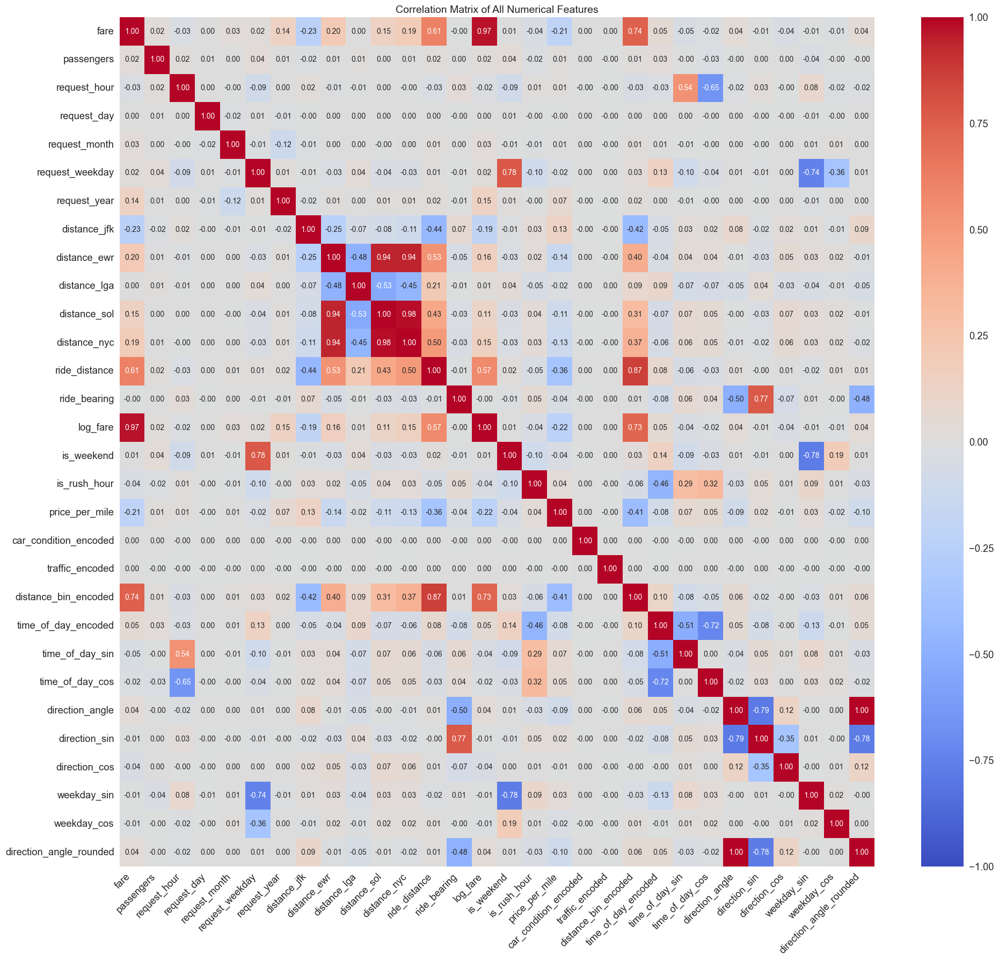

In [69]:
# Set the style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

# Correlation analysis
plt.figure(figsize=(20, 18))

# Select all numerical columns for correlation analysis
numerical_cols = df_encoded.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Create correlation matrix
corr_matrix = df_encoded[numerical_cols].corr()

# Plot the correlation heatmap
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f')
plt.title('Correlation Matrix of All Numerical Features')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()
